In [1]:
# ============================================================
# Step 1: Project setup, research framing, and notebook goals
# ============================================================

# What I am doing:
# This first step sets up the notebook environment and clearly frames the purpose
# of this project. The notebook is designed as a second-stage extension of the
# earlier minimal-complexity self-assembly model.
#
# In the first notebook, I explored simplified 2D/3D self-assembly ideas using
# voxel-like building blocks and reduced design strategies. In this notebook,
# I am moving closer to the inverse-design logic discussed in the paper by
# introducing simplified 3D target shapes, adjacency graphs, species reduction,
# constraint-style compatibility checks, stochastic assembly tests, and richer
# visual summaries.
#
# The goal is not to reproduce the full SAT solver or molecular dynamics
# pipeline from the paper. Instead, the goal is to build an understandable,
# computational prototype that demonstrates the same research direction:
#
#     Given a target shape, can we reduce the number of unique building blocks
#     while still preserving reliable self-assembly behavior?
#
# This notebook is therefore intended to be:
# 1. A computational modeling extension
# 2. A bridge toward formal inverse design
# 3. A visual and explainable research prototype
# 4. A foundation for future SAT-based or DNA-nanotechnology-aware work

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import itertools
import random
import math
import os
import textwrap
from collections import defaultdict, Counter, deque

# Optional but useful for graph-based shape representation
try:
    import networkx as nx
    NETWORKX_AVAILABLE = True
except ImportError:
    NETWORKX_AVAILABLE = False
    print("networkx is not available. Graph-based visualizations will be skipped.")

# Reproducibility
RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)
random.seed(RANDOM_SEED)

# Output folder for any generated figures or tables
OUTPUT_DIR = "self_assembly_outputs"
os.makedirs(OUTPUT_DIR, exist_ok=True)

# Global plotting defaults
plt.rcParams["figure.figsize"] = (8, 6)
plt.rcParams["axes.grid"] = True
plt.rcParams["axes.spines.top"] = False
plt.rcParams["axes.spines.right"] = False
plt.rcParams["font.size"] = 11

print("Notebook environment initialized successfully.")
print(f"Random seed set to: {RANDOM_SEED}")
print(f"Output folder: {OUTPUT_DIR}")
print(f"NetworkX available: {NETWORKX_AVAILABLE}")

Notebook environment initialized successfully.
Random seed set to: 42
Output folder: self_assembly_outputs
NetworkX available: True


In [2]:
# ============================================================
# Step 1A: High-level research plan for this final notebook
# ============================================================

# What I am doing:
# I am creating a structured overview table so that the notebook has a clear
# research direction before any modeling begins. This makes the notebook easier
# to present in a meeting and shows that the work is organized as a complete
# computational study rather than a collection of unrelated code cells.

research_plan_rows = [
    {
        "notebook_section": "Target shape construction",
        "main_question": "How can simplified 3D shapes be represented as voxel structures?",
        "expected_output": "3D visualizations of cube, L-shape, staircase, hollow, and wireframe targets"
    },
    {
        "notebook_section": "Adjacency and connectivity modeling",
        "main_question": "Which voxel positions must bind to form the target structure?",
        "expected_output": "Neighbor tables, bond counts, and graph-based shape summaries"
    },
    {
        "notebook_section": "Fully addressable design",
        "main_question": "What does the maximum-complexity solution look like?",
        "expected_output": "One unique species per voxel and one unique interface per bond"
    },
    {
        "notebook_section": "Reduced design strategies",
        "main_question": "Can repeated local environments share the same building block species?",
        "expected_output": "Strict reduced and rotation-aware reduced species assignments"
    },
    {
        "notebook_section": "Constraint-style compatibility checks",
        "main_question": "Do reduced species create ambiguous or conflicting patch rules?",
        "expected_output": "Conflict tables and design validity summaries"
    },
    {
        "notebook_section": "Stochastic assembly testing",
        "main_question": "Can the target shape still form reliably under simplified assembly rules?",
        "expected_output": "Assembly success rates, failure modes, and visual assembly traces"
    },
    {
        "notebook_section": "Strategy comparison",
        "main_question": "How do fully addressable and reduced designs compare?",
        "expected_output": "Species counts, bond counts, compression ratios, success rates, and charts"
    },
    {
        "notebook_section": "Final research interpretation",
        "main_question": "What does this prototype show about minimal-complexity self assembly?",
        "expected_output": "A conclusive summary connected to inverse design, SAT methods, and sustainability"
    }
]

research_plan_df = pd.DataFrame(research_plan_rows)

display(research_plan_df)

,notebook_section,main_question,expected_output
0,Target shape construction,How can simplified 3D shapes be represented as...,"3D visualizations of cube, L-shape, staircase,..."
1,Adjacency and connectivity modeling,Which voxel positions must bind to form the ta...,"Neighbor tables, bond counts, and graph-based ..."
2,Fully addressable design,What does the maximum-complexity solution look...,One unique species per voxel and one unique in...
3,Reduced design strategies,Can repeated local environments share the same...,Strict reduced and rotation-aware reduced spec...
4,Constraint-style compatibility checks,Do reduced species create ambiguous or conflic...,Conflict tables and design validity summaries
5,Stochastic assembly testing,Can the target shape still form reliably under...,"Assembly success rates, failure modes, and vis..."
6,Strategy comparison,How do fully addressable and reduced designs c...,"Species counts, bond counts, compression ratio..."
7,Final research interpretation,What does this prototype show about minimal-co...,A conclusive summary connected to inverse desi...


In [3]:
# ============================================================
# Step 2: Define simplified 3D voxel target shapes
# ============================================================

# What I am doing:
# I am defining a set of simplified 3D target structures using voxel coordinates.
# Each voxel represents one building block position in the final assembled shape.
#
# This step is important because the paper studies arbitrary target shapes as
# connected 3D structures. Here, I am creating small but meaningful examples
# that allow me to test design complexity, local connectivity, reduced species
# strategies, and simplified assembly behavior.
#
# The target shapes include:
# 1. A small solid cube
# 2. A 3D L shape
# 3. A staircase
# 4. A hollow 3 x 3 x 3 cube shell
# 5. A wireframe 3 x 3 x 3 cube
#
# These shapes range from very simple to more structurally interesting.
# This gives the notebook enough variety to compare how target geometry affects
# the number of required species and the difficulty of reliable assembly.

def make_solid_cube(size=2):
    """
    Create a solid cube of side length 'size'.
    Example: size=2 creates a 2 x 2 x 2 cube with 8 voxels.
    """
    coords = []
    for x in range(size):
        for y in range(size):
            for z in range(size):
                coords.append((x, y, z))
    return sorted(coords)


def make_3d_l_shape():
    """
    Create a simple 3D L shaped structure.
    This shape has branches along the x, y, and z directions from one corner.
    """
    coords = set()

    for x in range(4):
        coords.add((x, 0, 0))

    for y in range(3):
        coords.add((0, y, 0))

    for z in range(3):
        coords.add((0, 0, z))

    return sorted(coords)


def make_staircase(length=4):
    """
    Create a simple 3D staircase structure.
    Each step moves forward in x and upward in z.
    """
    coords = set()

    for x in range(length):
        for z in range(x + 1):
            coords.add((x, 0, z))

    return sorted(coords)


def make_hollow_cube_shell(size=3):
    """
    Create a hollow cube shell.
    For size=3, this creates a 3 x 3 x 3 cube with the center removed.
    """
    coords = []

    for x in range(size):
        for y in range(size):
            for z in range(size):
                on_boundary = (
                    x == 0 or x == size - 1 or
                    y == 0 or y == size - 1 or
                    z == 0 or z == size - 1
                )

                if on_boundary:
                    coords.append((x, y, z))

    return sorted(coords)


def make_wireframe_cube(size=3):
    """
    Create a wireframe cube.
    A voxel is included if it lies on at least two boundary planes.
    This keeps only the edges of the cube.
    """
    coords = []

    for x in range(size):
        for y in range(size):
            for z in range(size):
                boundary_count = sum([
                    x == 0 or x == size - 1,
                    y == 0 or y == size - 1,
                    z == 0 or z == size - 1
                ])

                if boundary_count >= 2:
                    coords.append((x, y, z))

    return sorted(coords)


target_shapes = {
    "Solid 2 x 2 x 2 Cube": make_solid_cube(size=2),
    "3D L Shape": make_3d_l_shape(),
    "Staircase": make_staircase(length=4),
    "Hollow 3 x 3 x 3 Cube Shell": make_hollow_cube_shell(size=3),
    "Wireframe 3 x 3 x 3 Cube": make_wireframe_cube(size=3)
}

shape_summary_rows = []

for shape_name, coords in target_shapes.items():
    xs = [c[0] for c in coords]
    ys = [c[1] for c in coords]
    zs = [c[2] for c in coords]

    shape_summary_rows.append({
        "target_shape": shape_name,
        "number_of_voxels": len(coords),
        "x_range": f"{min(xs)} to {max(xs)}",
        "y_range": f"{min(ys)} to {max(ys)}",
        "z_range": f"{min(zs)} to {max(zs)}"
    })

shape_summary_df = pd.DataFrame(shape_summary_rows)

display(shape_summary_df)

,target_shape,number_of_voxels,x_range,y_range,z_range
0,Solid 2 x 2 x 2 Cube,8,0 to 1,0 to 1,0 to 1
1,3D L Shape,8,0 to 3,0 to 2,0 to 2
2,Staircase,10,0 to 3,0 to 0,0 to 3
3,Hollow 3 x 3 x 3 Cube Shell,26,0 to 2,0 to 2,0 to 2
4,Wireframe 3 x 3 x 3 Cube,20,0 to 2,0 to 2,0 to 2


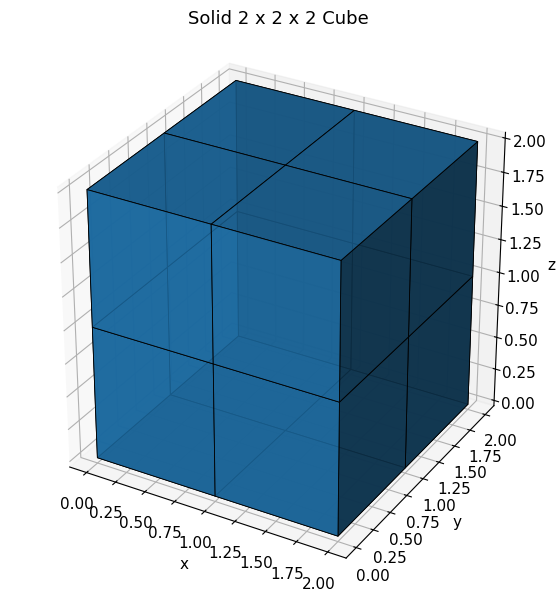

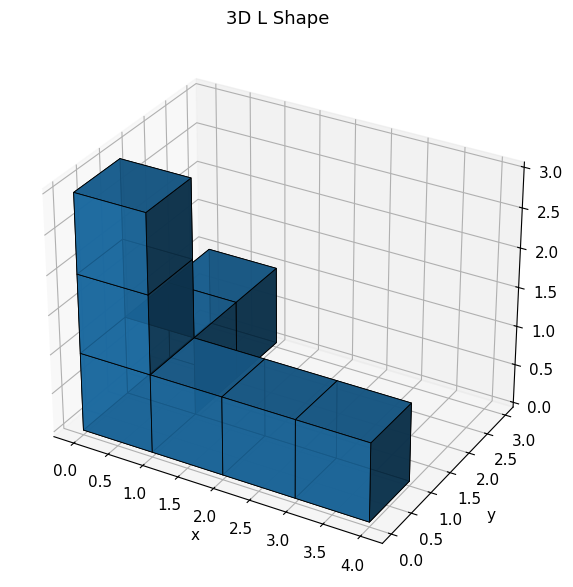

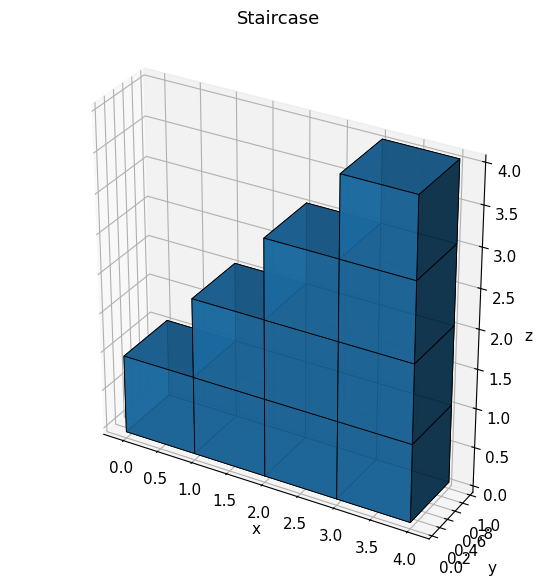

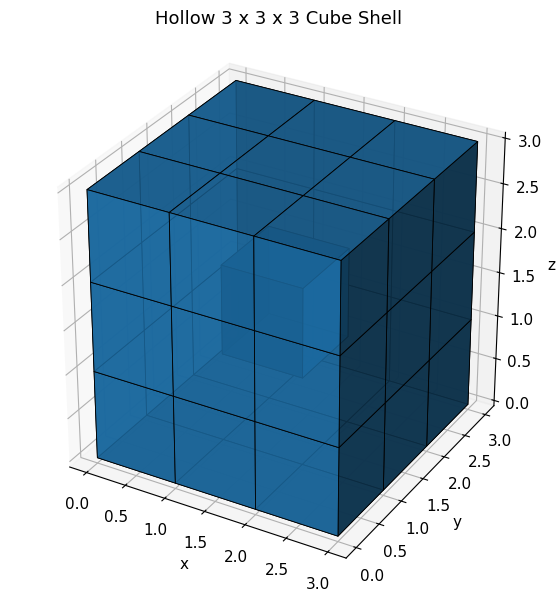

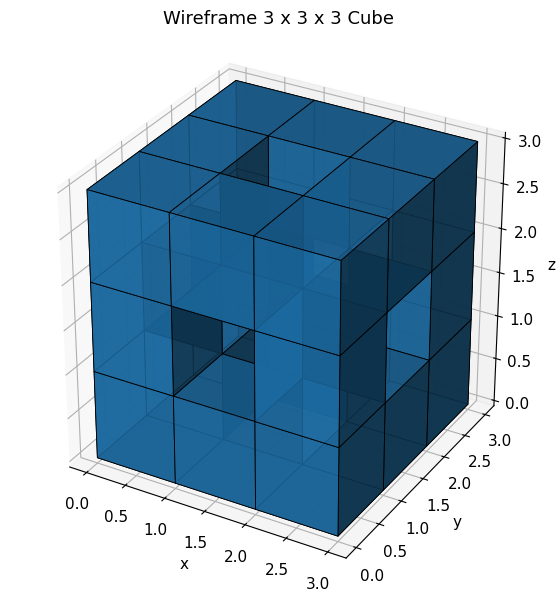

In [4]:
# ============================================================
# Step 2A: Visualize the 3D target shapes
# ============================================================

# What I am doing:
# I am creating clear 3D voxel visualizations for each target structure.
# These visuals make the notebook easier to understand and help connect the
# coordinate representation to actual self-assembly target shapes.
#
# This also makes the notebook more presentation-ready because the professor
# can immediately see the structures being tested before reading the later
# design and assembly logic.

def coords_to_voxel_grid(coords):
    """
    Convert a list of voxel coordinates into a 3D boolean grid for plotting.
    """
    xs = [c[0] for c in coords]
    ys = [c[1] for c in coords]
    zs = [c[2] for c in coords]

    grid = np.zeros((max(xs) + 1, max(ys) + 1, max(zs) + 1), dtype=bool)

    for x, y, z in coords:
        grid[x, y, z] = True

    return grid


def plot_voxel_shape(coords, title, ax=None, show_labels=True):
    """
    Plot a voxel-based shape using matplotlib's 3D voxel plotting.
    """
    if ax is None:
        fig = plt.figure(figsize=(7, 6))
        ax = fig.add_subplot(111, projection="3d")

    grid = coords_to_voxel_grid(coords)

    ax.voxels(
        grid,
        edgecolor="black",
        linewidth=0.6,
        alpha=0.85
    )

    ax.set_title(title, fontsize=13, pad=12)

    if show_labels:
        ax.set_xlabel("x")
        ax.set_ylabel("y")
        ax.set_zlabel("z")
    else:
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_zticks([])

    ax.set_box_aspect((
        max(1, grid.shape[0]),
        max(1, grid.shape[1]),
        max(1, grid.shape[2])
    ))

    return ax


for shape_name, coords in target_shapes.items():
    fig = plt.figure(figsize=(7, 6))
    ax = fig.add_subplot(111, projection="3d")
    plot_voxel_shape(coords, shape_name, ax=ax)
    plt.tight_layout()
    plt.show()

In [5]:
# ============================================================
# Step 3: Build adjacency and bond structure for each target shape
# ============================================================

# What I am doing:
# I am converting each 3D voxel target shape into a connectivity structure.
# Each voxel is treated as one building block position, and each face-sharing
# neighbor relationship becomes a required bond.
#
# This is a key step because self-assembly is not only about the final visual
# shape. It is also about which local connections must form between building
# blocks.
#
# In the paper, target structures are represented as connected arrangements of
# building blocks, and the design problem asks what species and patch rules can
# reproduce that structure. Here, I am building the simplified version of that
# idea using voxel adjacency.
#
# This step produces:
# 1. A list of required bonds for each target shape
# 2. A degree count for every voxel
# 3. Connectivity statistics for each structure
# 4. A graph representation for later design and assembly tests

DIRECTIONS = {
    "+x": (1, 0, 0),
    "-x": (-1, 0, 0),
    "+y": (0, 1, 0),
    "-y": (0, -1, 0),
    "+z": (0, 0, 1),
    "-z": (0, 0, -1)
}

OPPOSITE_DIRECTIONS = {
    "+x": "-x",
    "-x": "+x",
    "+y": "-y",
    "-y": "+y",
    "+z": "-z",
    "-z": "+z"
}


def add_coords(a, b):
    """
    Add two 3D coordinate tuples.
    """
    return (a[0] + b[0], a[1] + b[1], a[2] + b[2])


def build_adjacency(coords):
    """
    Build the adjacency structure for a voxel shape.

    Returns:
    adjacency:
        Dictionary where each voxel maps to a list of neighboring voxels.

    bonds:
        List of unique bonds. Each bond stores voxel A, voxel B,
        and the direction from A to B.
    """
    coord_set = set(coords)
    adjacency = {coord: [] for coord in coords}
    bonds = []

    for coord in coords:
        for direction_name, direction_vector in DIRECTIONS.items():
            neighbor = add_coords(coord, direction_vector)

            if neighbor in coord_set:
                adjacency[coord].append(neighbor)

                # Store each bond once to avoid duplicates
                if coord < neighbor:
                    bonds.append({
                        "voxel_a": coord,
                        "voxel_b": neighbor,
                        "direction_from_a_to_b": direction_name
                    })

    return adjacency, bonds


def shape_graph_metrics(coords, adjacency, bonds):
    """
    Calculate useful graph and connectivity metrics for one target shape.
    """
    degree_values = [len(adjacency[coord]) for coord in coords]

    number_of_voxels = len(coords)
    number_of_bonds = len(bonds)
    average_degree = np.mean(degree_values) if degree_values else 0
    max_degree = max(degree_values) if degree_values else 0
    min_degree = min(degree_values) if degree_values else 0

    endpoints = sum(1 for d in degree_values if d == 1)
    branch_points = sum(1 for d in degree_values if d >= 3)

    # For a connected graph, cycle_rank = E - V + 1.
    # If the graph has loops, this value is positive.
    cycle_rank = number_of_bonds - number_of_voxels + 1

    return {
        "number_of_voxels": number_of_voxels,
        "number_of_required_bonds": number_of_bonds,
        "average_voxel_degree": round(average_degree, 2),
        "minimum_degree": min_degree,
        "maximum_degree": max_degree,
        "endpoints_degree_1": endpoints,
        "branch_points_degree_3_or_more": branch_points,
        "cycle_rank_estimate": cycle_rank
    }


shape_adjacency_data = {}
connectivity_summary_rows = []

for shape_name, coords in target_shapes.items():
    adjacency, bonds = build_adjacency(coords)

    shape_adjacency_data[shape_name] = {
        "coords": coords,
        "adjacency": adjacency,
        "bonds": bonds
    }

    metrics = shape_graph_metrics(coords, adjacency, bonds)
    metrics["target_shape"] = shape_name
    connectivity_summary_rows.append(metrics)

connectivity_summary_df = pd.DataFrame(connectivity_summary_rows)

display(connectivity_summary_df)

,number_of_voxels,number_of_required_bonds,average_voxel_degree,minimum_degree,maximum_degree,endpoints_degree_1,branch_points_degree_3_or_more,cycle_rank_estimate,target_shape
0,8,12,3.00,3,3,0,8,5,Solid 2 x 2 x 2 Cube
1,8,7,1.75,1,3,3,1,0,3D L Shape
2,10,12,2.40,1,4,2,5,3,Staircase
3,26,48,3.69,3,4,0,26,23,Hollow 3 x 3 x 3 Cube Shell
4,20,24,2.40,2,3,0,8,5,Wireframe 3 x 3 x 3 Cube


In [6]:
# ============================================================
# Step 3A: Create bond tables for each target shape
# ============================================================

# What I am doing:
# I am creating tables that explicitly list the required bonds in each target.
# This makes the design problem more concrete because each row represents one
# required face-to-face connection that a patch rule must support.
#
# Later, these bonds will be used to define fully addressable and reduced
# building block strategies.

all_bond_rows = []

for shape_name, data in shape_adjacency_data.items():
    for bond_id, bond in enumerate(data["bonds"]):
        voxel_a = bond["voxel_a"]
        voxel_b = bond["voxel_b"]
        direction = bond["direction_from_a_to_b"]

        all_bond_rows.append({
            "target_shape": shape_name,
            "bond_id": bond_id,
            "voxel_a": voxel_a,
            "voxel_b": voxel_b,
            "direction_from_a_to_b": direction,
            "direction_from_b_to_a": OPPOSITE_DIRECTIONS[direction]
        })

bond_table_df = pd.DataFrame(all_bond_rows)

display(bond_table_df.head(20))

,target_shape,bond_id,voxel_a,voxel_b,direction_from_a_to_b,direction_from_b_to_a
0,Solid 2 x 2 x 2 Cube,0,"(0, 0, 0)","(1, 0, 0)",+x,-x
1,Solid 2 x 2 x 2 Cube,1,"(0, 0, 0)","(0, 1, 0)",+y,-y
2,Solid 2 x 2 x 2 Cube,2,"(0, 0, 0)","(0, 0, 1)",+z,-z
3,Solid 2 x 2 x 2 Cube,3,"(0, 0, 1)","(1, 0, 1)",+x,-x
4,Solid 2 x 2 x 2 Cube,4,"(0, 0, 1)","(0, 1, 1)",+y,-y
5,Solid 2 x 2 x 2 Cube,5,"(0, 1, 0)","(1, 1, 0)",+x,-x
6,Solid 2 x 2 x 2 Cube,6,"(0, 1, 0)","(0, 1, 1)",+z,-z
7,Solid 2 x 2 x 2 Cube,7,"(0, 1, 1)","(1, 1, 1)",+x,-x
8,Solid 2 x 2 x 2 Cube,8,"(1, 0, 0)","(1, 1, 0)",+y,-y
9,Solid 2 x 2 x 2 Cube,9,"(1, 0, 0)","(1, 0, 1)",+z,-z


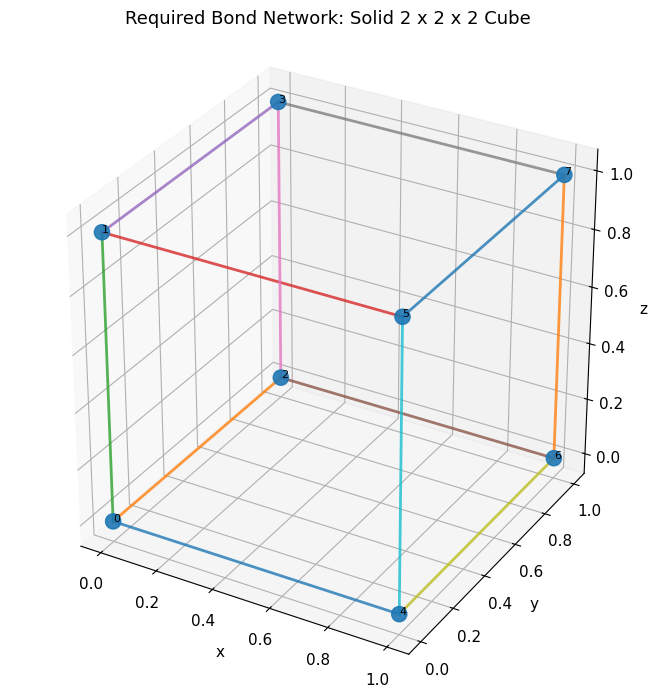

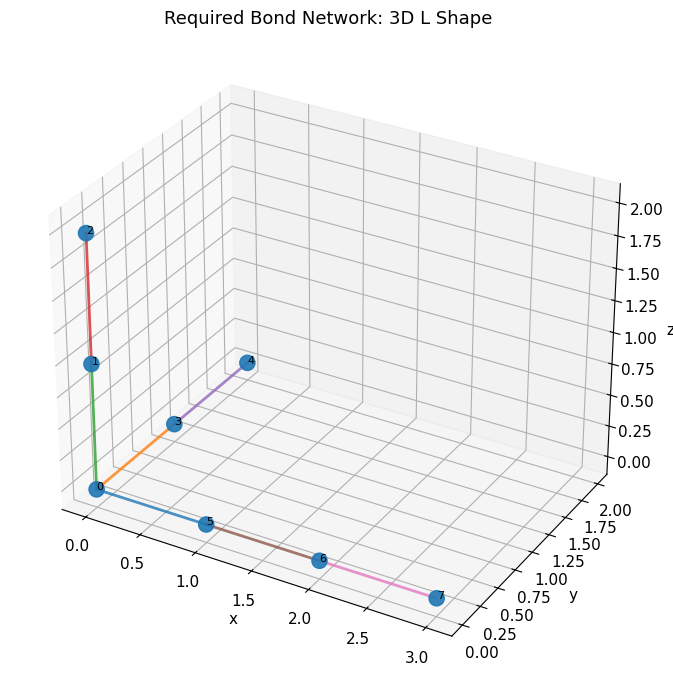

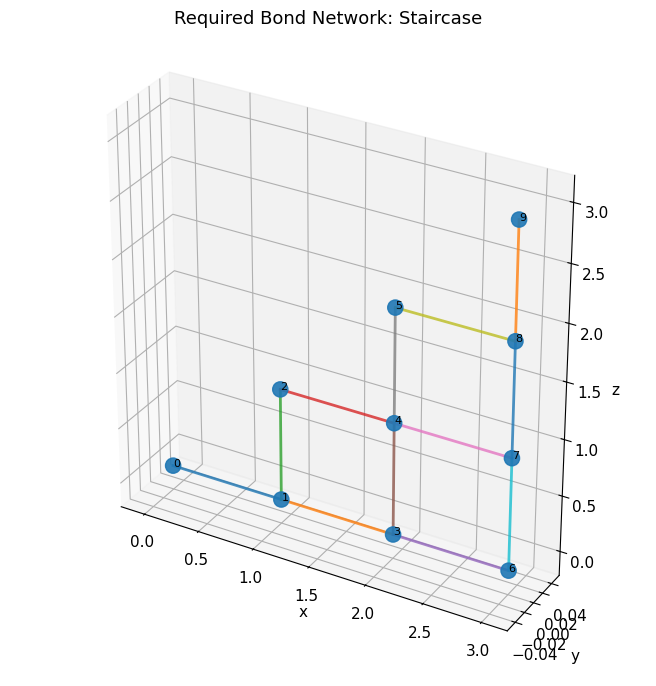

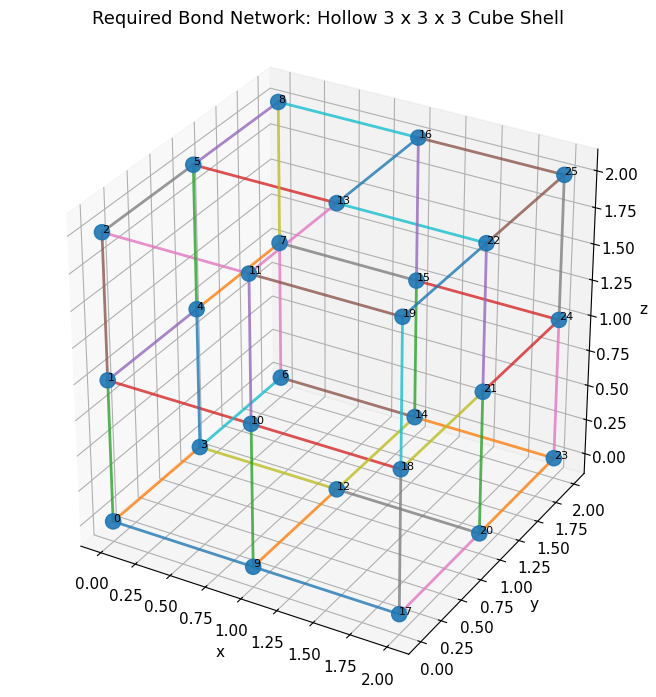

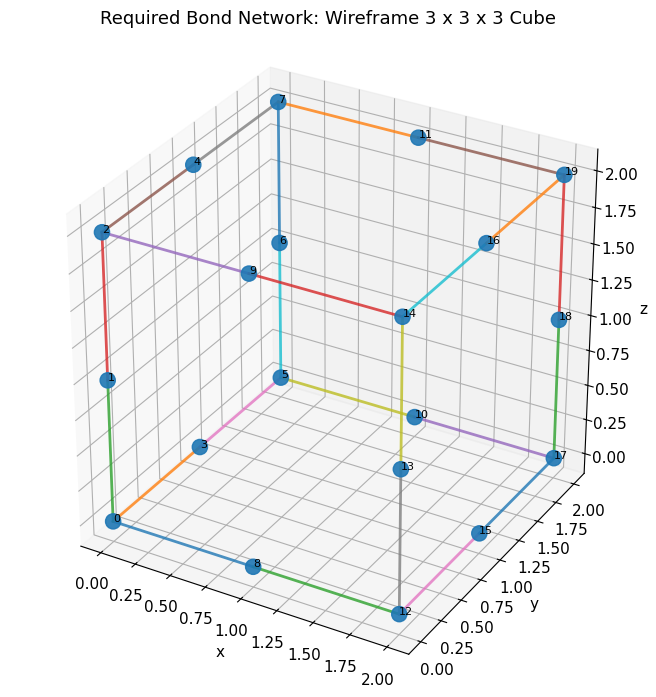

In [7]:
# ============================================================
# Step 3B: Visualize voxel centers and required bonds
# ============================================================

# What I am doing:
# I am plotting each target shape as a set of voxel centers connected by bonds.
# This is different from the solid voxel plots in Step 2 because this view shows
# the self-assembly topology directly.
#
# These plots help explain which local connections the design rules must encode.

def plot_shape_bond_network(coords, bonds, title):
    """
    Visualize a voxel shape as a 3D bond network.
    Voxel centers are shown as points and required bonds are shown as lines.
    """
    fig = plt.figure(figsize=(8, 7))
    ax = fig.add_subplot(111, projection="3d")

    xs = [c[0] for c in coords]
    ys = [c[1] for c in coords]
    zs = [c[2] for c in coords]

    ax.scatter(xs, ys, zs, s=120, alpha=0.9)

    for bond in bonds:
        a = bond["voxel_a"]
        b = bond["voxel_b"]

        ax.plot(
            [a[0], b[0]],
            [a[1], b[1]],
            [a[2], b[2]],
            linewidth=2.0,
            alpha=0.8
        )

    for i, coord in enumerate(coords):
        ax.text(
            coord[0],
            coord[1],
            coord[2],
            str(i),
            fontsize=8
        )

    ax.set_title(title, fontsize=13, pad=12)
    ax.set_xlabel("x")
    ax.set_ylabel("y")
    ax.set_zlabel("z")

    ax.set_box_aspect((
        max(1, max(xs) - min(xs) + 1),
        max(1, max(ys) - min(ys) + 1),
        max(1, max(zs) - min(zs) + 1)
    ))

    plt.tight_layout()
    plt.show()


for shape_name, data in shape_adjacency_data.items():
    plot_shape_bond_network(
        coords=data["coords"],
        bonds=data["bonds"],
        title=f"Required Bond Network: {shape_name}"
    )

,target_shape,degree,count
0,3D L Shape,1,3
1,3D L Shape,2,4
2,3D L Shape,3,1
3,Hollow 3 x 3 x 3 Cube Shell,3,8
4,Hollow 3 x 3 x 3 Cube Shell,4,18
5,Solid 2 x 2 x 2 Cube,3,8
6,Staircase,1,2
7,Staircase,2,3
8,Staircase,3,4
9,Staircase,4,1


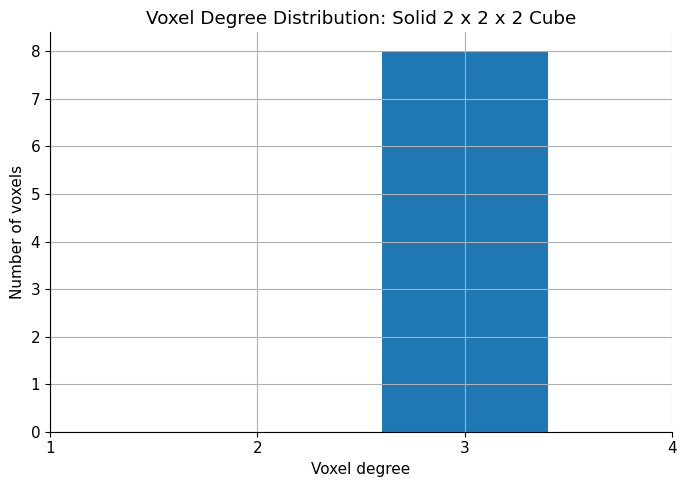

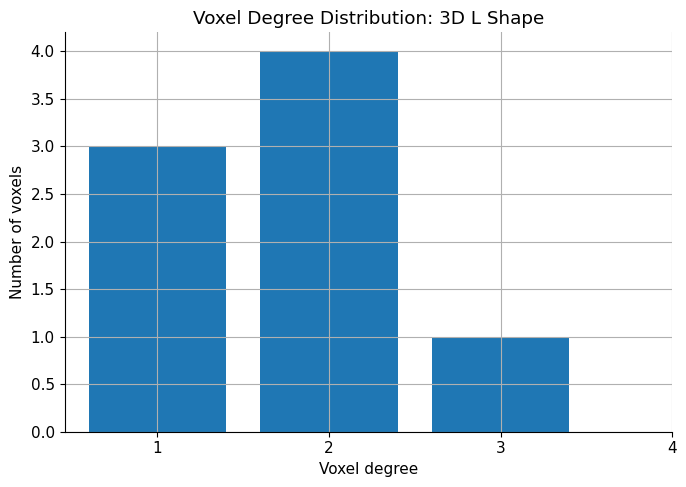

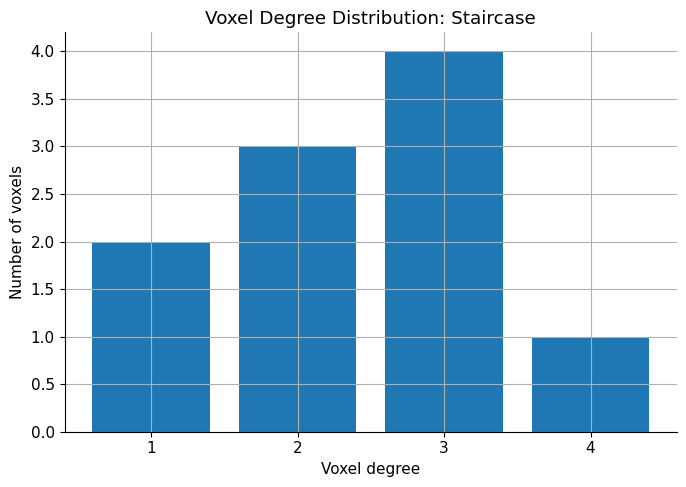

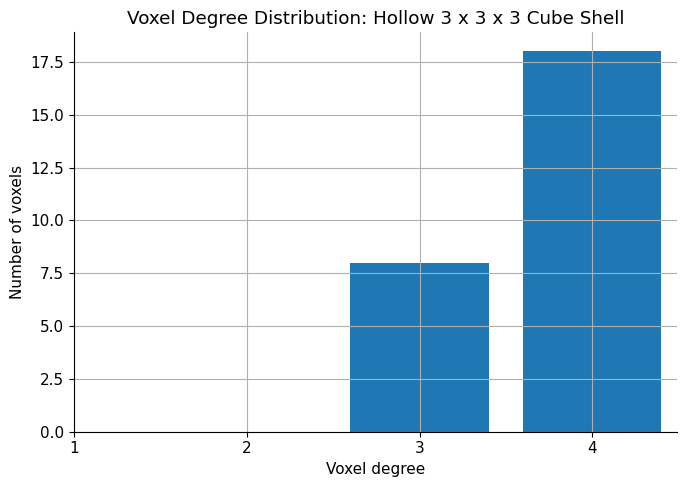

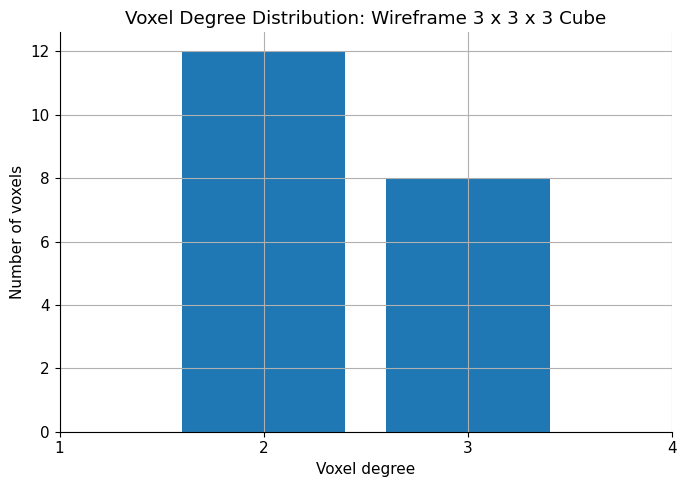

In [8]:
# ============================================================
# Step 3C: Compare degree distributions across target shapes
# ============================================================

# What I am doing:
# I am comparing the local connectivity patterns of the target shapes.
# The degree of a voxel is the number of neighboring voxels it must bind to.
#
# A simple chain-like structure has many degree-1 or degree-2 positions.
# A compact or shell-like structure has more highly connected positions.
# This matters because local connectivity affects how many patches are needed
# and how difficult it may be to reduce species complexity.

degree_rows = []

for shape_name, data in shape_adjacency_data.items():
    adjacency = data["adjacency"]

    for voxel, neighbors in adjacency.items():
        degree_rows.append({
            "target_shape": shape_name,
            "voxel": voxel,
            "degree": len(neighbors)
        })

degree_df = pd.DataFrame(degree_rows)

degree_count_df = (
    degree_df
    .groupby(["target_shape", "degree"])
    .size()
    .reset_index(name="count")
)

display(degree_count_df)

for shape_name in target_shapes.keys():
    subset = degree_count_df[degree_count_df["target_shape"] == shape_name]

    plt.figure(figsize=(7, 5))
    plt.bar(subset["degree"], subset["count"])
    plt.title(f"Voxel Degree Distribution: {shape_name}")
    plt.xlabel("Voxel degree")
    plt.ylabel("Number of voxels")
    plt.xticks(sorted(degree_df["degree"].unique()))
    plt.tight_layout()
    plt.show()

In [9]:
# ============================================================
# Step 4: Build the fully addressable design for each target shape
# ============================================================

# What I am doing:
# I am creating the maximum-complexity design for each target shape.
#
# In a fully addressable design:
# 1. Every voxel position gets its own unique building block species.
# 2. Every required bond gets its own unique complementary patch-color pair.
# 3. No species is reused across multiple positions.
#
# This is the most direct and least ambiguous design strategy.
# However, it is also experimentally expensive because every position requires
# a distinct component.
#
# This step provides the upper-bound baseline that reduced-complexity strategies
# will be compared against later.

def initialize_empty_patch_rule():
    """
    Create an empty patch rule for one cube species.
    Each cube has six possible patch directions.
    A value of None means that face has no active binding patch.
    """
    return {direction: None for direction in DIRECTIONS.keys()}


def build_fully_addressable_design(shape_name, shape_data):
    """
    Build a fully addressable design for one target shape.

    Returns a dictionary containing:
    - species assignment for each voxel
    - patch rules for each species
    - bond rules
    - compatibility rules
    """
    coords = shape_data["coords"]
    bonds = shape_data["bonds"]

    species_assignments = {}
    patch_rules = {}
    compatibility_rules = {}
    bond_rules = []

    # Give every voxel its own unique species
    for i, coord in enumerate(coords):
        species_name = f"{shape_name.replace(' ', '_')}_S{i}"
        species_assignments[coord] = species_name
        patch_rules[species_name] = initialize_empty_patch_rule()

    # Give every bond its own unique complementary patch-color pair
    for bond_id, bond in enumerate(bonds):
        voxel_a = bond["voxel_a"]
        voxel_b = bond["voxel_b"]
        direction_a_to_b = bond["direction_from_a_to_b"]
        direction_b_to_a = OPPOSITE_DIRECTIONS[direction_a_to_b]

        species_a = species_assignments[voxel_a]
        species_b = species_assignments[voxel_b]

        color_a = f"C{bond_id}_A"
        color_b = f"C{bond_id}_B"

        patch_rules[species_a][direction_a_to_b] = color_a
        patch_rules[species_b][direction_b_to_a] = color_b

        compatibility_rules[color_a] = color_b
        compatibility_rules[color_b] = color_a

        bond_rules.append({
            "target_shape": shape_name,
            "bond_id": bond_id,
            "voxel_a": voxel_a,
            "voxel_b": voxel_b,
            "species_a": species_a,
            "species_b": species_b,
            "patch_on_species_a": direction_a_to_b,
            "patch_on_species_b": direction_b_to_a,
            "color_on_species_a": color_a,
            "color_on_species_b": color_b
        })

    design = {
        "shape_name": shape_name,
        "coords": coords,
        "species_assignments": species_assignments,
        "patch_rules": patch_rules,
        "compatibility_rules": compatibility_rules,
        "bond_rules": bond_rules
    }

    return design


fully_addressable_designs = {}

for shape_name, shape_data in shape_adjacency_data.items():
    fully_addressable_designs[shape_name] = build_fully_addressable_design(
        shape_name=shape_name,
        shape_data=shape_data
    )

print("Fully addressable designs created for all target shapes.")

Fully addressable designs created for all target shapes.


In [10]:
# ============================================================
# Step 4A: Summarize fully addressable design complexity
# ============================================================

# What I am doing:
# I am summarizing the complexity of the fully addressable design for each shape.
#
# Important quantities:
# - Number of species: how many unique building blocks are required
# - Number of required bonds: how many target connections must be encoded
# - Number of patch colors: two complementary colors are used per bond
# - Number of active patches: two active patches are used per bond
#
# This table becomes the baseline for measuring how much complexity is reduced
# in later design strategies.

fully_addressable_summary_rows = []

for shape_name, design in fully_addressable_designs.items():
    number_of_species = len(design["patch_rules"])
    number_of_required_bonds = len(design["bond_rules"])
    number_of_patch_colors = len(design["compatibility_rules"])
    number_of_active_patches = 2 * number_of_required_bonds
    maximum_possible_patches = number_of_species * 6
    unused_patches = maximum_possible_patches - number_of_active_patches

    fully_addressable_summary_rows.append({
        "target_shape": shape_name,
        "number_of_voxels": len(design["coords"]),
        "number_of_species": number_of_species,
        "number_of_required_bonds": number_of_required_bonds,
        "number_of_patch_colors": number_of_patch_colors,
        "active_patches": number_of_active_patches,
        "unused_patch_faces": unused_patches
    })

fully_addressable_summary_df = pd.DataFrame(fully_addressable_summary_rows)

display(fully_addressable_summary_df)

,target_shape,number_of_voxels,number_of_species,number_of_required_bonds,number_of_patch_colors,active_patches,unused_patch_faces
0,Solid 2 x 2 x 2 Cube,8,8,12,24,24,24
1,3D L Shape,8,8,7,14,14,34
2,Staircase,10,10,12,24,24,36
3,Hollow 3 x 3 x 3 Cube Shell,26,26,48,96,96,60
4,Wireframe 3 x 3 x 3 Cube,20,20,24,48,48,72


In [11]:
# ============================================================
# Step 4B: Create readable patch-rule tables
# ============================================================

# What I am doing:
# I am converting the fully addressable design into a readable table.
# Each row represents one building block species and the patch colors assigned
# to its six possible faces.
#
# This makes the abstract design more transparent. Instead of only saying that
# the design has many species and colors, I can show exactly how those species
# are encoded.

fully_addressable_patch_rows = []

for shape_name, design in fully_addressable_designs.items():
    for species_name, patch_rule in design["patch_rules"].items():
        row = {
            "target_shape": shape_name,
            "species": species_name
        }

        for direction in DIRECTIONS.keys():
            row[direction] = patch_rule[direction]

        fully_addressable_patch_rows.append(row)

fully_addressable_patch_df = pd.DataFrame(fully_addressable_patch_rows)

display(fully_addressable_patch_df.head(25))

,target_shape,species,+x,-x,+y,-y,+z,-z
0,Solid 2 x 2 x 2 Cube,Solid_2_x_2_x_2_Cube_S0,C0_A,None,C1_A,None,C2_A,None
1,Solid 2 x 2 x 2 Cube,Solid_2_x_2_x_2_Cube_S1,C3_A,None,C4_A,None,None,C2_B
2,Solid 2 x 2 x 2 Cube,Solid_2_x_2_x_2_Cube_S2,C5_A,None,None,C1_B,C6_A,None
3,Solid 2 x 2 x 2 Cube,Solid_2_x_2_x_2_Cube_S3,C7_A,None,None,C4_B,None,C6_B
4,Solid 2 x 2 x 2 Cube,Solid_2_x_2_x_2_Cube_S4,None,C0_B,C8_A,None,C9_A,None
5,Solid 2 x 2 x 2 Cube,Solid_2_x_2_x_2_Cube_S5,None,C3_B,C10_A,None,None,C9_B
6,Solid 2 x 2 x 2 Cube,Solid_2_x_2_x_2_Cube_S6,None,C5_B,None,C8_B,C11_A,None
7,Solid 2 x 2 x 2 Cube,Solid_2_x_2_x_2_Cube_S7,None,C7_B,None,C10_B,None,C11_B
8,3D L Shape,3D_L_Shape_S0,C0_A,None,C1_A,None,C2_A,None
9,3D L Shape,3D_L_Shape_S1,None,None,None,None,C3_A,C2_B


In [12]:
# ============================================================
# Step 4C: Display fully addressable bond rules
# ============================================================

# What I am doing:
# I am showing the specific complementary patch-color pair assigned to each
# required bond in the target structure.
#
# In a fully addressable design, every bond receives a unique pair of compatible
# colors. This prevents ambiguity, but it increases design complexity.

fully_addressable_bond_rows = []

for shape_name, design in fully_addressable_designs.items():
    fully_addressable_bond_rows.extend(design["bond_rules"])

fully_addressable_bond_df = pd.DataFrame(fully_addressable_bond_rows)

display(fully_addressable_bond_df.head(25))

,target_shape,bond_id,voxel_a,voxel_b,species_a,species_b,patch_on_species_a,patch_on_species_b,color_on_species_a,color_on_species_b
0,Solid 2 x 2 x 2 Cube,0,"(0, 0, 0)","(1, 0, 0)",Solid_2_x_2_x_2_Cube_S0,Solid_2_x_2_x_2_Cube_S4,+x,-x,C0_A,C0_B
1,Solid 2 x 2 x 2 Cube,1,"(0, 0, 0)","(0, 1, 0)",Solid_2_x_2_x_2_Cube_S0,Solid_2_x_2_x_2_Cube_S2,+y,-y,C1_A,C1_B
2,Solid 2 x 2 x 2 Cube,2,"(0, 0, 0)","(0, 0, 1)",Solid_2_x_2_x_2_Cube_S0,Solid_2_x_2_x_2_Cube_S1,+z,-z,C2_A,C2_B
3,Solid 2 x 2 x 2 Cube,3,"(0, 0, 1)","(1, 0, 1)",Solid_2_x_2_x_2_Cube_S1,Solid_2_x_2_x_2_Cube_S5,+x,-x,C3_A,C3_B
4,Solid 2 x 2 x 2 Cube,4,"(0, 0, 1)","(0, 1, 1)",Solid_2_x_2_x_2_Cube_S1,Solid_2_x_2_x_2_Cube_S3,+y,-y,C4_A,C4_B
5,Solid 2 x 2 x 2 Cube,5,"(0, 1, 0)","(1, 1, 0)",Solid_2_x_2_x_2_Cube_S2,Solid_2_x_2_x_2_Cube_S6,+x,-x,C5_A,C5_B
6,Solid 2 x 2 x 2 Cube,6,"(0, 1, 0)","(0, 1, 1)",Solid_2_x_2_x_2_Cube_S2,Solid_2_x_2_x_2_Cube_S3,+z,-z,C6_A,C6_B
7,Solid 2 x 2 x 2 Cube,7,"(0, 1, 1)","(1, 1, 1)",Solid_2_x_2_x_2_Cube_S3,Solid_2_x_2_x_2_Cube_S7,+x,-x,C7_A,C7_B
8,Solid 2 x 2 x 2 Cube,8,"(1, 0, 0)","(1, 1, 0)",Solid_2_x_2_x_2_Cube_S4,Solid_2_x_2_x_2_Cube_S6,+y,-y,C8_A,C8_B
9,Solid 2 x 2 x 2 Cube,9,"(1, 0, 0)","(1, 0, 1)",Solid_2_x_2_x_2_Cube_S4,Solid_2_x_2_x_2_Cube_S5,+z,-z,C9_A,C9_B


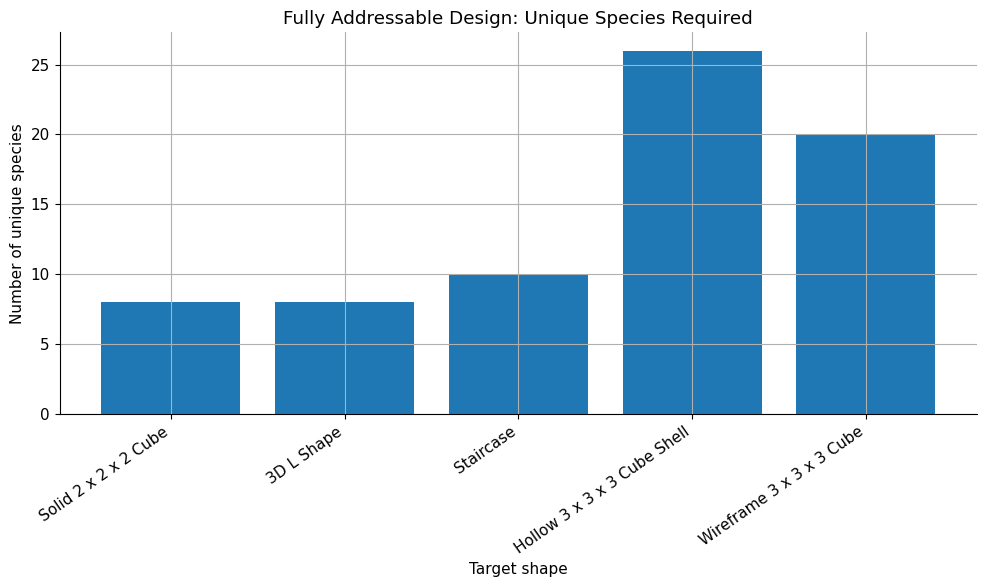

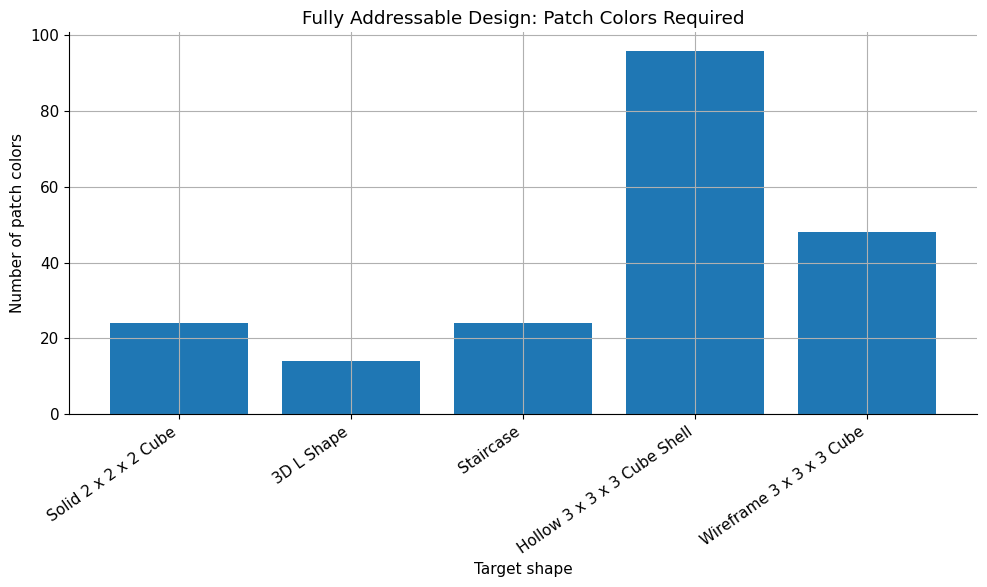

In [13]:
# ============================================================
# Step 4D: Visualize fully addressable complexity across shapes
# ============================================================

# What I am doing:
# I am plotting the number of unique species and patch colors required by the
# fully addressable design.
#
# This visual makes the cost of the maximum-complexity strategy easy to see.
# As target shapes become larger or more connected, the number of required
# species and patch colors increases quickly.

summary_for_plot = fully_addressable_summary_df.copy()

plt.figure(figsize=(10, 6))
plt.bar(
    summary_for_plot["target_shape"],
    summary_for_plot["number_of_species"]
)
plt.title("Fully Addressable Design: Unique Species Required")
plt.xlabel("Target shape")
plt.ylabel("Number of unique species")
plt.xticks(rotation=35, ha="right")
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 6))
plt.bar(
    summary_for_plot["target_shape"],
    summary_for_plot["number_of_patch_colors"]
)
plt.title("Fully Addressable Design: Patch Colors Required")
plt.xlabel("Target shape")
plt.ylabel("Number of patch colors")
plt.xticks(rotation=35, ha="right")
plt.tight_layout()
plt.show()

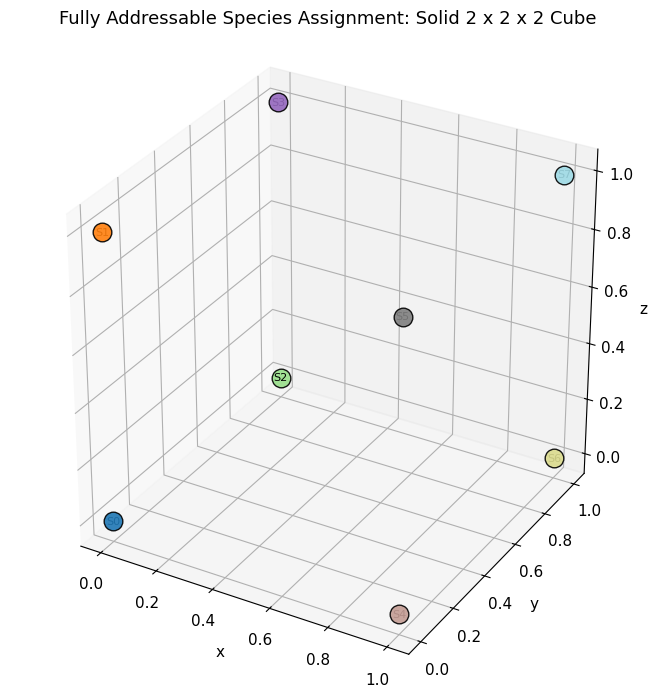

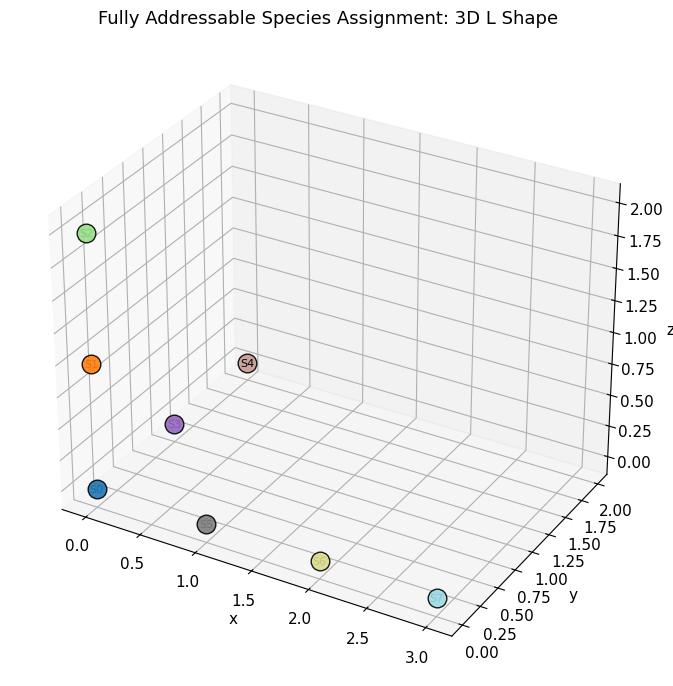

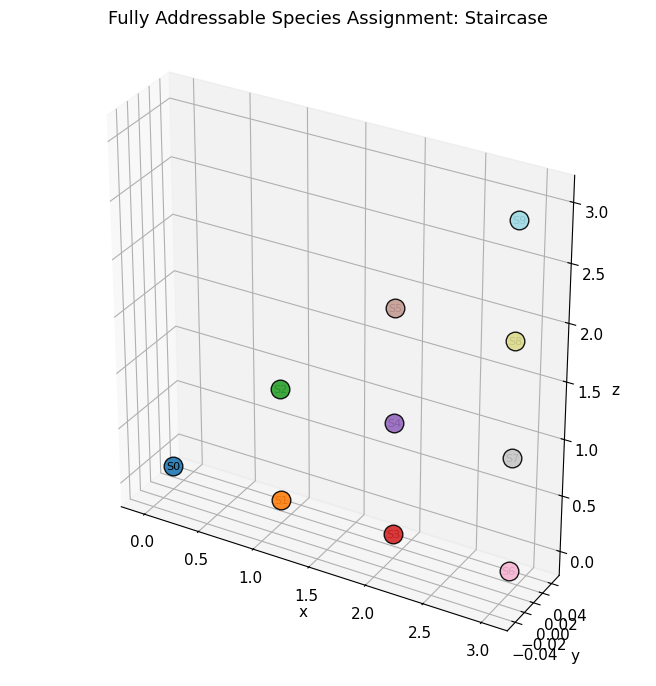

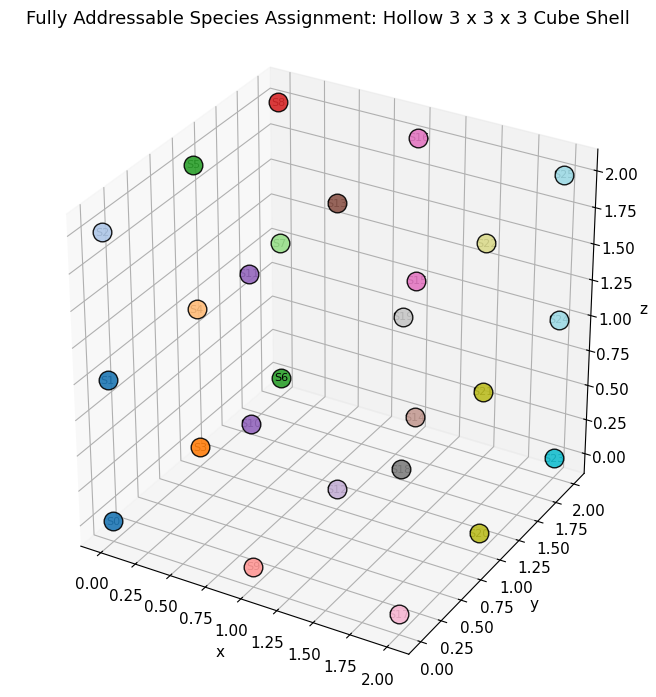

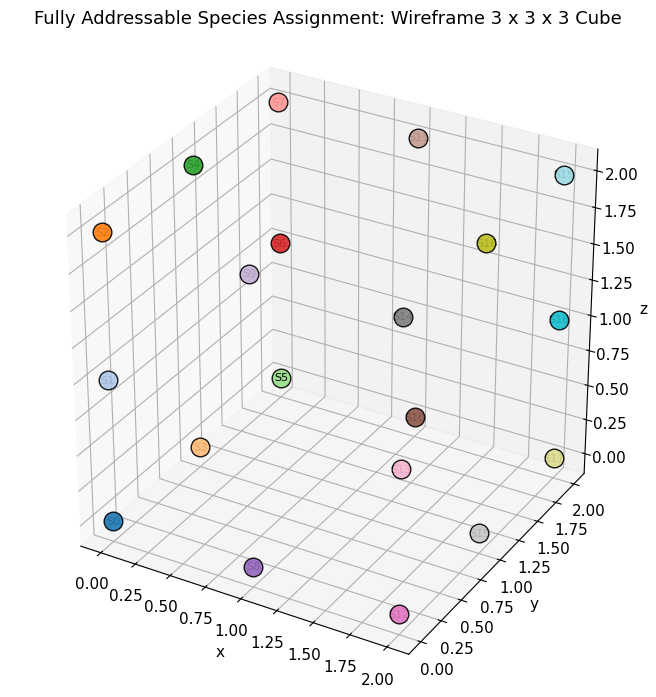

In [14]:
# ============================================================
# Step 4E: Visualize fully addressable species assignments
# ============================================================

# What I am doing:
# I am visualizing the fully addressable species assignment for each target.
# Since every voxel gets its own species, every position is shown as unique.
#
# This figure makes the maximum-complexity design visually obvious:
# the design is simple to specify, but expensive because nothing is reused.

def plot_fully_addressable_species(design):
    """
    Plot a target shape where every voxel has its own species label.
    """
    shape_name = design["shape_name"]
    coords = design["coords"]
    species_assignments = design["species_assignments"]

    fig = plt.figure(figsize=(8, 7))
    ax = fig.add_subplot(111, projection="3d")

    xs = [coord[0] for coord in coords]
    ys = [coord[1] for coord in coords]
    zs = [coord[2] for coord in coords]

    colors = plt.cm.tab20(np.linspace(0, 1, len(coords)))

    for i, coord in enumerate(coords):
        ax.scatter(
            coord[0],
            coord[1],
            coord[2],
            s=180,
            color=colors[i],
            edgecolor="black",
            alpha=0.9
        )

        short_label = f"S{i}"
        ax.text(
            coord[0],
            coord[1],
            coord[2],
            short_label,
            fontsize=8,
            ha="center",
            va="center"
        )

    ax.set_title(f"Fully Addressable Species Assignment: {shape_name}", fontsize=13, pad=12)
    ax.set_xlabel("x")
    ax.set_ylabel("y")
    ax.set_zlabel("z")

    ax.set_box_aspect((
        max(1, max(xs) - min(xs) + 1),
        max(1, max(ys) - min(ys) + 1),
        max(1, max(zs) - min(zs) + 1)
    ))

    plt.tight_layout()
    plt.show()


for shape_name, design in fully_addressable_designs.items():
    plot_fully_addressable_species(design)

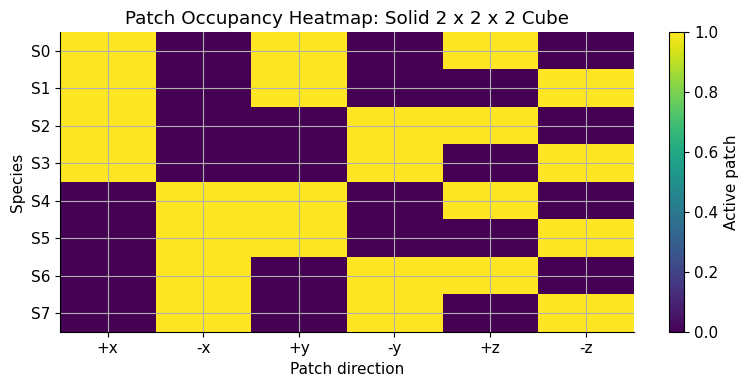

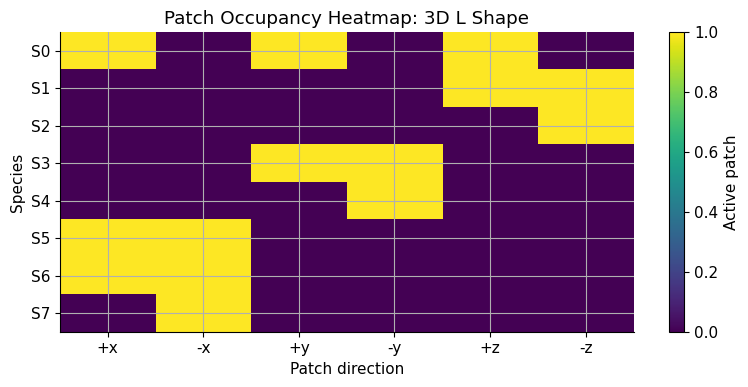

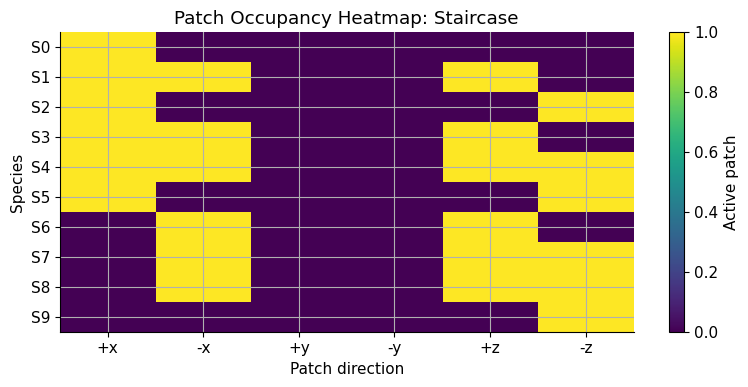

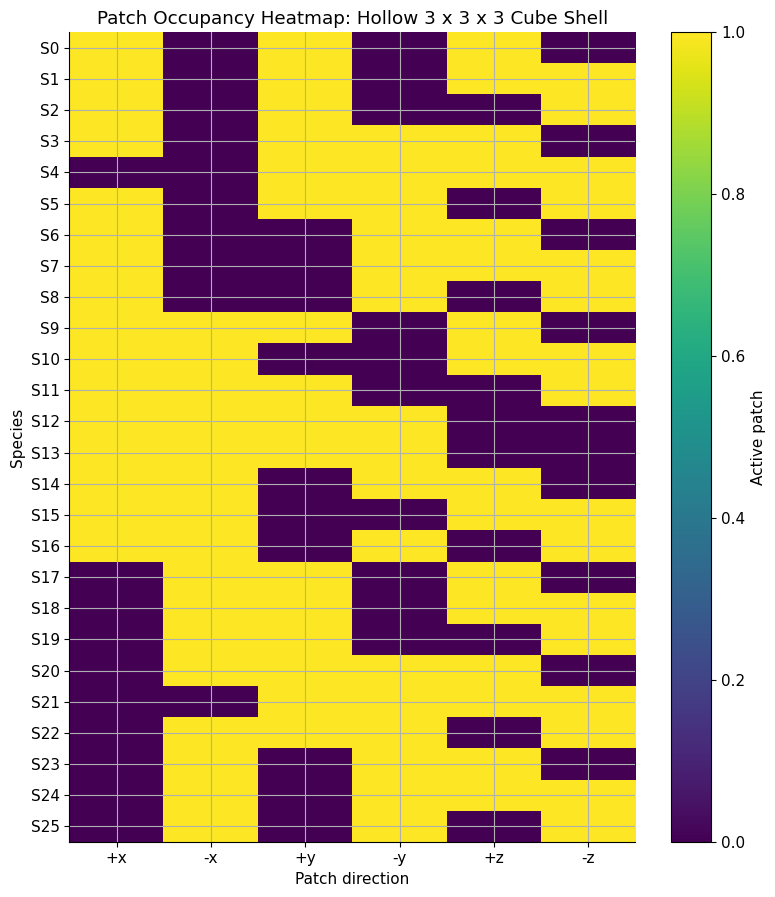

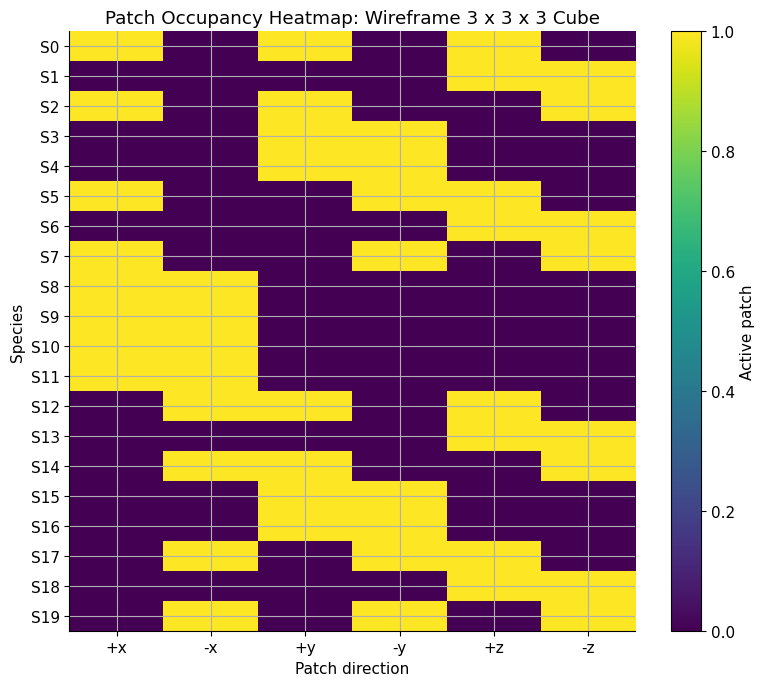

In [15]:
# ============================================================
# Step 4F: Visualize active patch faces for each fully addressable design
# ============================================================

# What I am doing:
# I am creating a patch occupancy heatmap for each target shape.
#
# Rows represent species.
# Columns represent cube faces.
# A value of 1 means that the species has an active patch on that face.
# A value of 0 means that the face is unused.
#
# This is useful because it shows how the shape topology determines the patch
# structure of the building blocks.

def plot_patch_occupancy_heatmap(design):
    """
    Plot a heatmap showing which patch directions are active for each species.
    """
    shape_name = design["shape_name"]
    patch_rules = design["patch_rules"]

    species_names = list(patch_rules.keys())
    directions = list(DIRECTIONS.keys())

    occupancy_matrix = np.zeros((len(species_names), len(directions)))

    for i, species in enumerate(species_names):
        for j, direction in enumerate(directions):
            if patch_rules[species][direction] is not None:
                occupancy_matrix[i, j] = 1

    plt.figure(figsize=(8, max(4, 0.35 * len(species_names))))
    plt.imshow(occupancy_matrix, aspect="auto")

    plt.title(f"Patch Occupancy Heatmap: {shape_name}")
    plt.xlabel("Patch direction")
    plt.ylabel("Species")

    plt.xticks(range(len(directions)), directions)
    plt.yticks(range(len(species_names)), [f"S{i}" for i in range(len(species_names))])

    cbar = plt.colorbar()
    cbar.set_label("Active patch")

    plt.tight_layout()
    plt.show()


for shape_name, design in fully_addressable_designs.items():
    plot_patch_occupancy_heatmap(design)

In [16]:
# ============================================================
# Step 5: Build a strict reduced design based on local patch patterns
# ============================================================

# What I am doing:
# I am creating a reduced-complexity design strategy.
#
# In the fully addressable design, every voxel had its own unique species.
# That is simple and unambiguous, but expensive.
#
# In this strict reduced strategy, I group voxels together if they have the exact
# same local connectivity pattern in the same global directions.
#
# Example:
# If two voxels both connect through +x and +z faces, they can share one species.
# If one voxel connects through +x and +z, but another connects through -x and +z,
# they are treated as different species because the directions are not identical.
#
# This is called "strict" because it does not allow rotation equivalence yet.
# Rotation-aware reduction will be added in the next step.

def get_local_patch_signature(coord, adjacency):
    """
    Create a strict local patch signature for one voxel.

    The signature records which global directions have neighboring voxels.
    This does not account for rotations.
    """
    neighbor_set = set(adjacency[coord])
    active_directions = []

    for direction_name, direction_vector in DIRECTIONS.items():
        neighbor = add_coords(coord, direction_vector)

        if neighbor in neighbor_set:
            active_directions.append(direction_name)

    return tuple(sorted(active_directions))


def build_strict_reduced_design(shape_name, shape_data):
    """
    Build a strict reduced design by grouping voxels with identical
    global-direction patch signatures.
    """
    coords = shape_data["coords"]
    adjacency = shape_data["adjacency"]
    bonds = shape_data["bonds"]

    signature_to_species = {}
    species_assignments = {}
    species_signatures = {}

    # Assign species based on strict local patch signatures
    for coord in coords:
        signature = get_local_patch_signature(coord, adjacency)

        if signature not in signature_to_species:
            species_id = len(signature_to_species)
            species_name = f"{shape_name.replace(' ', '_')}_Strict_R{species_id}"
            signature_to_species[signature] = species_name
            species_signatures[species_name] = signature

        species_assignments[coord] = signature_to_species[signature]

    # Create patch rules for each reduced species
    patch_rules = {}

    for species_name, signature in species_signatures.items():
        patch_rule = initialize_empty_patch_rule()

        for direction in signature:
            patch_rule[direction] = f"{species_name}_{direction}"

        patch_rules[species_name] = patch_rule

    # Create compatibility observations from actual target bonds
    compatibility_observations = defaultdict(list)
    bond_rules = []

    for bond_id, bond in enumerate(bonds):
        voxel_a = bond["voxel_a"]
        voxel_b = bond["voxel_b"]
        direction_a_to_b = bond["direction_from_a_to_b"]
        direction_b_to_a = OPPOSITE_DIRECTIONS[direction_a_to_b]

        species_a = species_assignments[voxel_a]
        species_b = species_assignments[voxel_b]

        color_a = patch_rules[species_a][direction_a_to_b]
        color_b = patch_rules[species_b][direction_b_to_a]

        compatibility_observations[color_a].append(color_b)
        compatibility_observations[color_b].append(color_a)

        bond_rules.append({
            "target_shape": shape_name,
            "bond_id": bond_id,
            "voxel_a": voxel_a,
            "voxel_b": voxel_b,
            "species_a": species_a,
            "species_b": species_b,
            "patch_on_species_a": direction_a_to_b,
            "patch_on_species_b": direction_b_to_a,
            "color_on_species_a": color_a,
            "color_on_species_b": color_b
        })

    # Convert compatibility observations into a conflict-aware table
    compatibility_summary = {}

    for color, partners in compatibility_observations.items():
        unique_partners = sorted(set(partners))
        compatibility_summary[color] = {
            "compatible_partners": unique_partners,
            "number_of_unique_partners": len(unique_partners),
            "has_conflict": len(unique_partners) > 1
        }

    design = {
        "shape_name": shape_name,
        "coords": coords,
        "species_assignments": species_assignments,
        "species_signatures": species_signatures,
        "patch_rules": patch_rules,
        "bond_rules": bond_rules,
        "compatibility_summary": compatibility_summary
    }

    return design


strict_reduced_designs = {}

for shape_name, shape_data in shape_adjacency_data.items():
    strict_reduced_designs[shape_name] = build_strict_reduced_design(
        shape_name=shape_name,
        shape_data=shape_data
    )

print("Strict reduced designs created for all target shapes.")

Strict reduced designs created for all target shapes.


In [17]:
# ============================================================
# Step 5A: Summarize strict reduced design complexity
# ============================================================

# What I am doing:
# I am comparing the strict reduced design against the fully addressable design.
#
# The main quantity of interest is species reduction:
#
#     species reduction = 1 - reduced species / fully addressable species
#
# A larger value means the design uses fewer distinct building blocks.
# This table gives an early quantitative measure of how much reuse is possible.

strict_summary_rows = []

for shape_name, design in strict_reduced_designs.items():
    fully_addressable_species = fully_addressable_summary_df.loc[
        fully_addressable_summary_df["target_shape"] == shape_name,
        "number_of_species"
    ].iloc[0]

    strict_species = len(design["patch_rules"])
    number_of_bonds = len(design["bond_rules"])
    active_patches = sum(
        1
        for species, patch_rule in design["patch_rules"].items()
        for direction, color in patch_rule.items()
        if color is not None
    )

    conflict_count = sum(
        1
        for color, info in design["compatibility_summary"].items()
        if info["has_conflict"]
    )

    species_reduction_fraction = 1 - (strict_species / fully_addressable_species)

    strict_summary_rows.append({
        "target_shape": shape_name,
        "fully_addressable_species": fully_addressable_species,
        "strict_reduced_species": strict_species,
        "species_saved": fully_addressable_species - strict_species,
        "species_reduction_percent": round(100 * species_reduction_fraction, 2),
        "number_of_required_bonds": number_of_bonds,
        "active_patch_types": active_patches,
        "compatibility_conflicts": conflict_count
    })

strict_reduced_summary_df = pd.DataFrame(strict_summary_rows)

display(strict_reduced_summary_df)

,target_shape,fully_addressable_species,strict_reduced_species,species_saved,species_reduction_percent,number_of_required_bonds,active_patch_types,compatibility_conflicts
0,Solid 2 x 2 x 2 Cube,8,8,0,0.00,12,24,0
1,3D L Shape,8,7,1,12.50,7,12,2
2,Staircase,10,7,3,30.00,12,16,8
3,Hollow 3 x 3 x 3 Cube Shell,26,23,3,11.54,48,84,12
4,Wireframe 3 x 3 x 3 Cube,20,11,9,45.00,24,30,6


In [18]:
# ============================================================
# Step 5B: Display strict reduced species signatures
# ============================================================

# What I am doing:
# I am showing what each reduced species represents.
# Each row lists one species and the patch directions that define it.
#
# This table is useful because it explains why certain voxels were grouped
# together. The grouping is based only on local connectivity patterns.

strict_signature_rows = []

for shape_name, design in strict_reduced_designs.items():
    for species_name, signature in design["species_signatures"].items():
        strict_signature_rows.append({
            "target_shape": shape_name,
            "strict_species": species_name,
            "local_patch_signature": signature,
            "number_of_active_faces": len(signature)
        })

strict_signature_df = pd.DataFrame(strict_signature_rows)

display(strict_signature_df)

,target_shape,strict_species,local_patch_signature,number_of_active_faces
0,Solid 2 x 2 x 2 Cube,Solid_2_x_2_x_2_Cube_Strict_R0,"(+x, +y, +z)",3
1,Solid 2 x 2 x 2 Cube,Solid_2_x_2_x_2_Cube_Strict_R1,"(+x, +y, -z)",3
2,Solid 2 x 2 x 2 Cube,Solid_2_x_2_x_2_Cube_Strict_R2,"(+x, +z, -y)",3
3,Solid 2 x 2 x 2 Cube,Solid_2_x_2_x_2_Cube_Strict_R3,"(+x, -y, -z)",3
4,Solid 2 x 2 x 2 Cube,Solid_2_x_2_x_2_Cube_Strict_R4,"(+y, +z, -x)",3
5,Solid 2 x 2 x 2 Cube,Solid_2_x_2_x_2_Cube_Strict_R5,"(+y, -x, -z)",3
6,Solid 2 x 2 x 2 Cube,Solid_2_x_2_x_2_Cube_Strict_R6,"(+z, -x, -y)",3
7,Solid 2 x 2 x 2 Cube,Solid_2_x_2_x_2_Cube_Strict_R7,"(-x, -y, -z)",3
8,3D L Shape,3D_L_Shape_Strict_R0,"(+x, +y, +z)",3
9,3D L Shape,3D_L_Shape_Strict_R1,"(+z, -z)",2


In [19]:
# ============================================================
# Step 5C: Show voxel-to-species assignments for strict reduction
# ============================================================

# What I am doing:
# I am showing which voxels share the same reduced species.
# This helps make the species reduction understandable at the level of the
# target structure itself.

strict_assignment_rows = []

for shape_name, design in strict_reduced_designs.items():
    for coord, species in design["species_assignments"].items():
        strict_assignment_rows.append({
            "target_shape": shape_name,
            "voxel": coord,
            "strict_species": species,
            "local_patch_signature": design["species_signatures"][species]
        })

strict_assignment_df = pd.DataFrame(strict_assignment_rows)

display(strict_assignment_df.head(30))

,target_shape,voxel,strict_species,local_patch_signature
0,Solid 2 x 2 x 2 Cube,"(0, 0, 0)",Solid_2_x_2_x_2_Cube_Strict_R0,"(+x, +y, +z)"
1,Solid 2 x 2 x 2 Cube,"(0, 0, 1)",Solid_2_x_2_x_2_Cube_Strict_R1,"(+x, +y, -z)"
2,Solid 2 x 2 x 2 Cube,"(0, 1, 0)",Solid_2_x_2_x_2_Cube_Strict_R2,"(+x, +z, -y)"
3,Solid 2 x 2 x 2 Cube,"(0, 1, 1)",Solid_2_x_2_x_2_Cube_Strict_R3,"(+x, -y, -z)"
4,Solid 2 x 2 x 2 Cube,"(1, 0, 0)",Solid_2_x_2_x_2_Cube_Strict_R4,"(+y, +z, -x)"
5,Solid 2 x 2 x 2 Cube,"(1, 0, 1)",Solid_2_x_2_x_2_Cube_Strict_R5,"(+y, -x, -z)"
6,Solid 2 x 2 x 2 Cube,"(1, 1, 0)",Solid_2_x_2_x_2_Cube_Strict_R6,"(+z, -x, -y)"
7,Solid 2 x 2 x 2 Cube,"(1, 1, 1)",Solid_2_x_2_x_2_Cube_Strict_R7,"(-x, -y, -z)"
8,3D L Shape,"(0, 0, 0)",3D_L_Shape_Strict_R0,"(+x, +y, +z)"
9,3D L Shape,"(0, 0, 1)",3D_L_Shape_Strict_R1,"(+z, -z)"


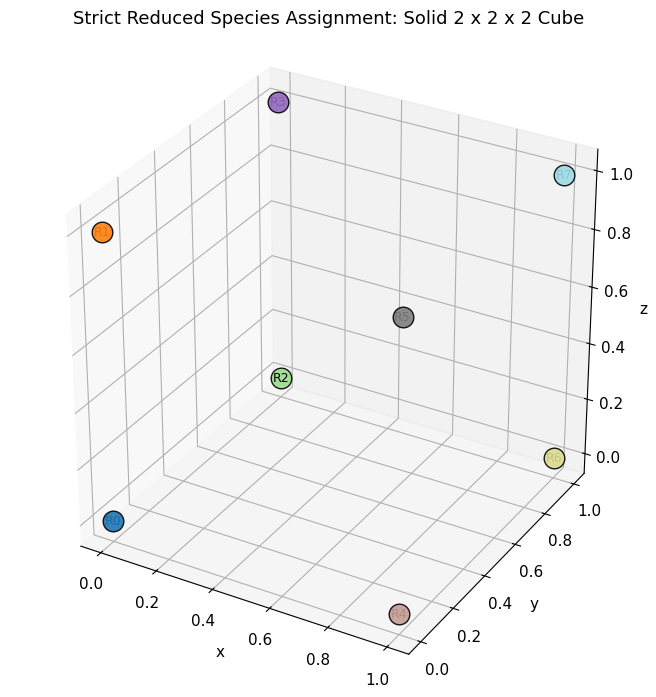

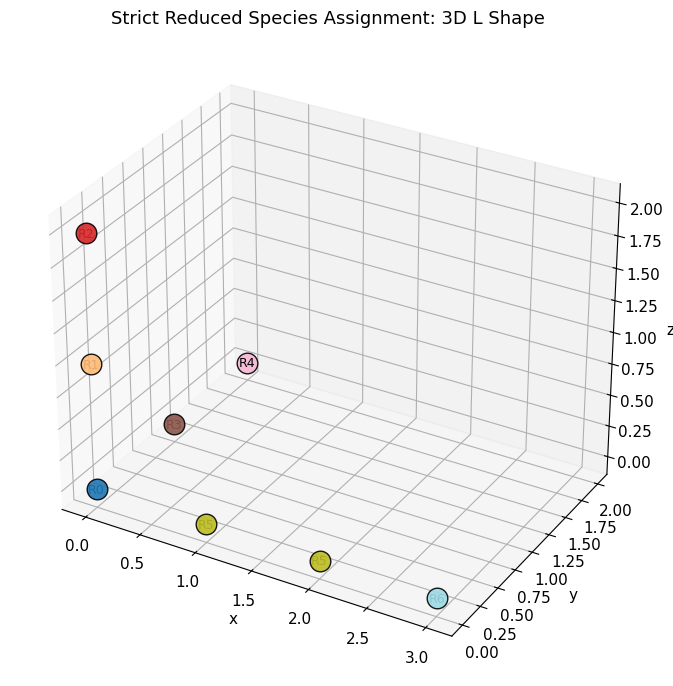

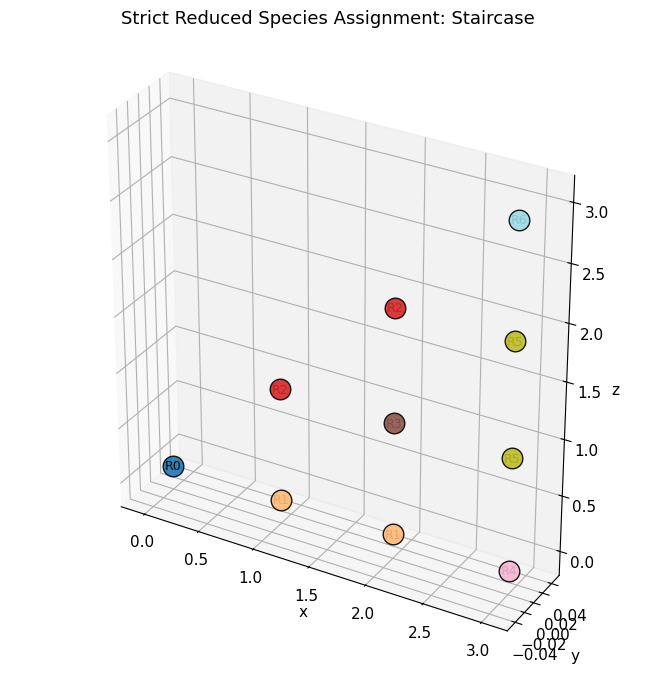

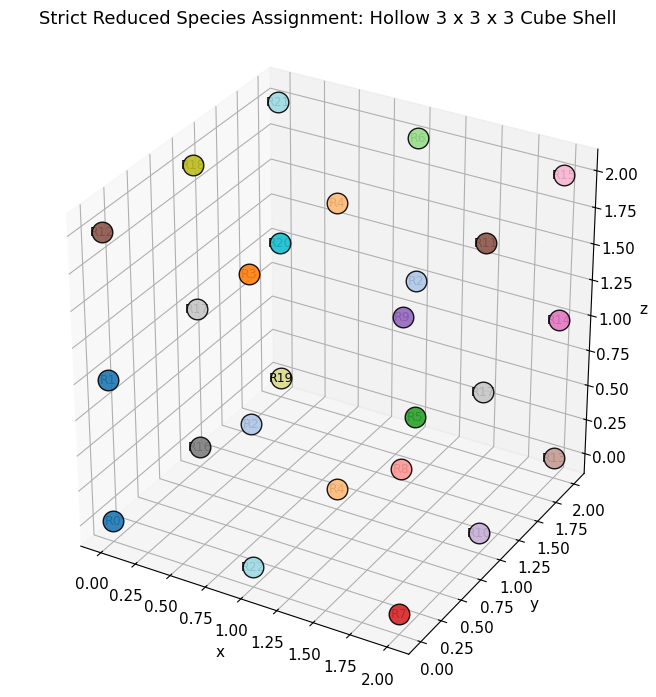

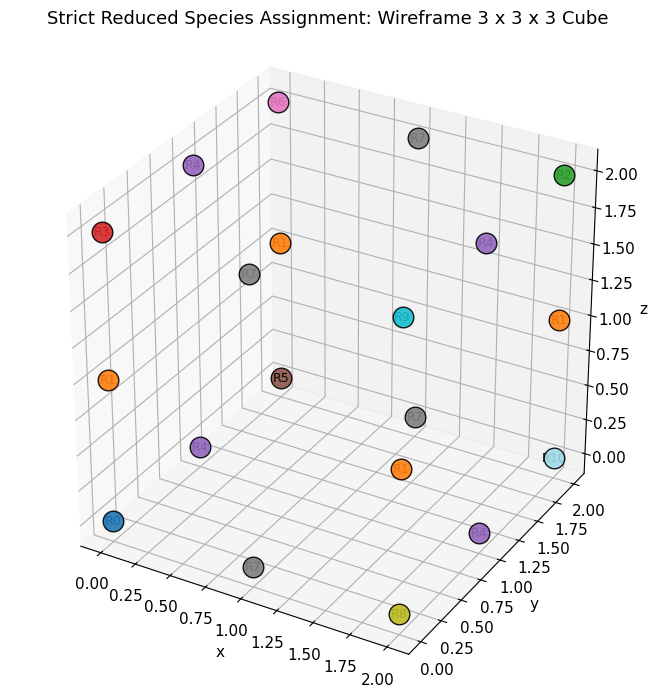

In [20]:
# ============================================================
# Step 5D: Visualize strict reduced species assignments
# ============================================================

# What I am doing:
# I am plotting each target shape with colors representing strict reduced species.
# Voxels with the same color belong to the same reusable building block type.
#
# This visual is important because it shows where component reuse appears in
# the target geometry.

def plot_reduced_species_assignment(design, title_prefix="Strict Reduced"):
    """
    Plot a target shape with each reduced species shown as a shared label/color.
    """
    shape_name = design["shape_name"]
    coords = design["coords"]
    species_assignments = design["species_assignments"]

    unique_species = sorted(set(species_assignments.values()))
    species_to_index = {species: i for i, species in enumerate(unique_species)}

    fig = plt.figure(figsize=(8, 7))
    ax = fig.add_subplot(111, projection="3d")

    color_values = plt.cm.tab20(np.linspace(0, 1, max(1, len(unique_species))))

    for coord in coords:
        species = species_assignments[coord]
        species_index = species_to_index[species]

        ax.scatter(
            coord[0],
            coord[1],
            coord[2],
            s=220,
            color=color_values[species_index % len(color_values)],
            edgecolor="black",
            alpha=0.9
        )

        ax.text(
            coord[0],
            coord[1],
            coord[2],
            f"R{species_index}",
            fontsize=9,
            ha="center",
            va="center"
        )

    xs = [coord[0] for coord in coords]
    ys = [coord[1] for coord in coords]
    zs = [coord[2] for coord in coords]

    ax.set_title(f"{title_prefix} Species Assignment: {shape_name}", fontsize=13, pad=12)
    ax.set_xlabel("x")
    ax.set_ylabel("y")
    ax.set_zlabel("z")

    ax.set_box_aspect((
        max(1, max(xs) - min(xs) + 1),
        max(1, max(ys) - min(ys) + 1),
        max(1, max(zs) - min(zs) + 1)
    ))

    plt.tight_layout()
    plt.show()


for shape_name, design in strict_reduced_designs.items():
    plot_reduced_species_assignment(design, title_prefix="Strict Reduced")

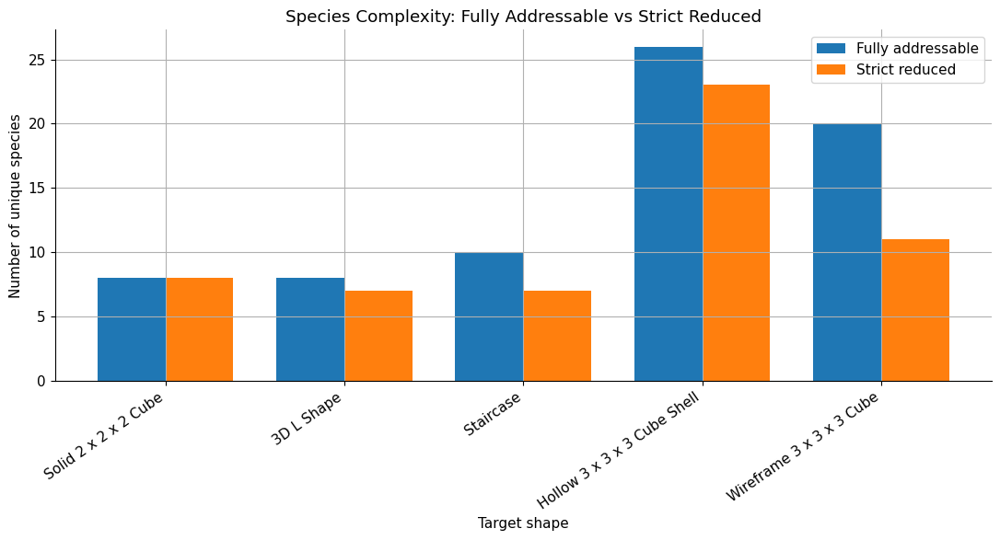

In [21]:
# ============================================================
# Step 5E: Visualize species reduction compared with fully addressable design
# ============================================================

# What I am doing:
# I am creating a direct visual comparison between the fully addressable strategy
# and the strict reduced strategy.
#
# This makes the benefit of reduced design immediately visible.

comparison_df = strict_reduced_summary_df.copy()

x_positions = np.arange(len(comparison_df))
bar_width = 0.38

plt.figure(figsize=(11, 6))

plt.bar(
    x_positions - bar_width / 2,
    comparison_df["fully_addressable_species"],
    width=bar_width,
    label="Fully addressable"
)

plt.bar(
    x_positions + bar_width / 2,
    comparison_df["strict_reduced_species"],
    width=bar_width,
    label="Strict reduced"
)

plt.title("Species Complexity: Fully Addressable vs Strict Reduced")
plt.xlabel("Target shape")
plt.ylabel("Number of unique species")
plt.xticks(x_positions, comparison_df["target_shape"], rotation=35, ha="right")
plt.legend()
plt.tight_layout()
plt.show()

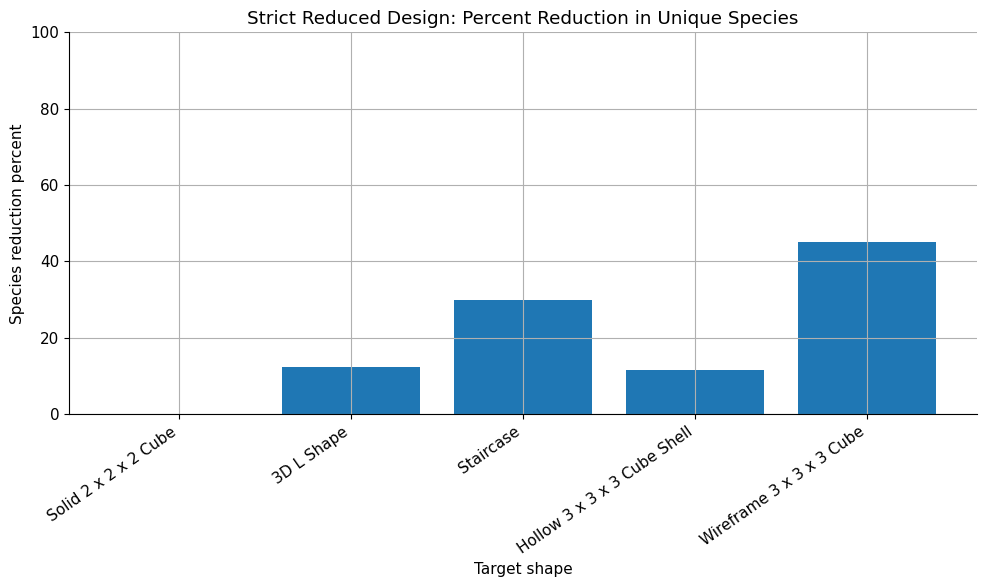

In [22]:
# ============================================================
# Step 5F: Plot strict species reduction percentage
# ============================================================

# What I am doing:
# I am plotting the percentage of species saved by the strict reduced strategy.
# This gives a clearer interpretation than raw species counts alone.

plt.figure(figsize=(10, 6))

plt.bar(
    strict_reduced_summary_df["target_shape"],
    strict_reduced_summary_df["species_reduction_percent"]
)

plt.title("Strict Reduced Design: Percent Reduction in Unique Species")
plt.xlabel("Target shape")
plt.ylabel("Species reduction percent")
plt.xticks(rotation=35, ha="right")
plt.ylim(0, 100)
plt.tight_layout()
plt.show()

In [23]:
# ============================================================
# Step 5G: Inspect possible compatibility conflicts
# ============================================================

# What I am doing:
# I am checking whether any reduced patch color is being asked to bind to more
# than one partner.
#
# In a strict one-to-one compatibility system, each patch color should have only
# one complementary partner. If one color has multiple partners, the reduced
# rule may be ambiguous and could create off-target assembly.
#
# This does not mean the reduced design is useless. It means the design needs
# a constraint check or refinement, which motivates the next section.

strict_conflict_rows = []

for shape_name, design in strict_reduced_designs.items():
    for color, info in design["compatibility_summary"].items():
        strict_conflict_rows.append({
            "target_shape": shape_name,
            "patch_color": color,
            "compatible_partners": info["compatible_partners"],
            "number_of_unique_partners": info["number_of_unique_partners"],
            "has_conflict": info["has_conflict"]
        })

strict_conflict_df = pd.DataFrame(strict_conflict_rows)

display(strict_conflict_df[strict_conflict_df["has_conflict"] == True].head(30))

if strict_conflict_df["has_conflict"].sum() == 0:
    print("No compatibility conflicts found in the strict reduced designs.")
else:
    print(
        "Compatibility conflicts were found. "
        "The next step should refine this using constraint-style validity checks."
    )

,target_shape,patch_color,compatible_partners,number_of_unique_partners,has_conflict
25,3D L Shape,3D_L_Shape_Strict_R5_-x,"[3D_L_Shape_Strict_R0_+x, 3D_L_Shape_Strict_R5...",2,True
34,3D L Shape,3D_L_Shape_Strict_R5_+x,"[3D_L_Shape_Strict_R5_-x, 3D_L_Shape_Strict_R6...",2,True
37,Staircase,Staircase_Strict_R1_-x,"[Staircase_Strict_R0_+x, Staircase_Strict_R1_+x]",2,True
38,Staircase,Staircase_Strict_R1_+x,"[Staircase_Strict_R1_-x, Staircase_Strict_R4_-x]",2,True
39,Staircase,Staircase_Strict_R1_+z,"[Staircase_Strict_R2_-z, Staircase_Strict_R3_-z]",2,True
40,Staircase,Staircase_Strict_R2_-z,"[Staircase_Strict_R1_+z, Staircase_Strict_R3_+z]",2,True
41,Staircase,Staircase_Strict_R2_+x,"[Staircase_Strict_R3_-x, Staircase_Strict_R5_-x]",2,True
46,Staircase,Staircase_Strict_R5_-x,"[Staircase_Strict_R2_+x, Staircase_Strict_R3_+x]",2,True
49,Staircase,Staircase_Strict_R5_-z,"[Staircase_Strict_R4_+z, Staircase_Strict_R5_+z]",2,True
50,Staircase,Staircase_Strict_R5_+z,"[Staircase_Strict_R5_-z, Staircase_Strict_R6_-z]",2,True


Compatibility conflicts were found. The next step should refine this using constraint-style validity checks.


In [24]:
# ============================================================
# Step 6: Build a rotation-aware reduced design
# ============================================================

# What I am doing:
# I am creating a more flexible reduced design strategy.
#
# In the strict reduced design, two voxels could share a species only if their
# active patch directions matched exactly in the global coordinate system.
#
# In this rotation-aware reduced design, two voxels can share a species if their
# local patch patterns are the same after rotating the cube.
#
# Example:
# A voxel with active faces (+x, +z) and another voxel with active faces (+y, +z)
# may represent the same local corner-type building block after rotation.
#
# This is closer to the idea of reusable building blocks because a physical
# component can often be placed in different orientations.

DIRECTION_TO_VECTOR = {
    "+x": np.array([1, 0, 0]),
    "-x": np.array([-1, 0, 0]),
    "+y": np.array([0, 1, 0]),
    "-y": np.array([0, -1, 0]),
    "+z": np.array([0, 0, 1]),
    "-z": np.array([0, 0, -1])
}

VECTOR_TO_DIRECTION = {
    (1, 0, 0): "+x",
    (-1, 0, 0): "-x",
    (0, 1, 0): "+y",
    (0, -1, 0): "-y",
    (0, 0, 1): "+z",
    (0, 0, -1): "-z"
}


def generate_cube_rotation_matrices():
    """
    Generate the 24 proper rotation matrices of a cube.

    These are all signed permutation matrices with determinant +1.
    They represent rotations that map cube faces onto cube faces.
    """
    rotations = []

    base_axes = np.eye(3, dtype=int)

    for permutation in itertools.permutations(range(3)):
        permuted_axes = base_axes[:, permutation]

        for signs in itertools.product([-1, 1], repeat=3):
            rotation = permuted_axes * np.array(signs)

            if round(np.linalg.det(rotation)) == 1:
                rotations.append(rotation)

    # Remove duplicates just in case
    unique_rotations = []
    seen = set()

    for rotation in rotations:
        key = tuple(rotation.flatten())

        if key not in seen:
            seen.add(key)
            unique_rotations.append(rotation)

    return unique_rotations


CUBE_ROTATIONS = generate_cube_rotation_matrices()

print(f"Number of cube rotations generated: {len(CUBE_ROTATIONS)}")


def apply_rotation_to_direction(direction_name, rotation_matrix):
    """
    Apply a cube rotation to a direction label.
    """
    vector = DIRECTION_TO_VECTOR[direction_name]
    rotated_vector = rotation_matrix @ vector
    rotated_tuple = tuple(rotated_vector.astype(int))

    return VECTOR_TO_DIRECTION[rotated_tuple]


def canonical_rotation_signature(active_directions):
    """
    Convert a set of active directions into a canonical signature under rotation.

    The function tries all 24 cube rotations and selects the lexicographically
    smallest rotated signature. This allows equivalent local shapes to be grouped.
    """
    active_directions = tuple(sorted(active_directions))

    if len(active_directions) == 0:
        return tuple(), np.eye(3, dtype=int)

    candidate_signatures = []

    for rotation in CUBE_ROTATIONS:
        rotated_signature = tuple(sorted(
            apply_rotation_to_direction(direction, rotation)
            for direction in active_directions
        ))

        candidate_signatures.append((rotated_signature, rotation))

    canonical_signature, best_rotation = min(
        candidate_signatures,
        key=lambda item: item[0]
    )

    return canonical_signature, best_rotation


def build_rotation_aware_reduced_design(shape_name, shape_data):
    """
    Build a rotation-aware reduced design.

    Voxels are grouped if their local connectivity pattern is equivalent under
    one of the 24 cube rotations.
    """
    coords = shape_data["coords"]
    adjacency = shape_data["adjacency"]
    bonds = shape_data["bonds"]

    signature_to_species = {}
    species_assignments = {}
    species_signatures = {}
    placement_rotations = {}

    # Assign species based on canonical rotated signatures
    for coord in coords:
        strict_signature = get_local_patch_signature(coord, adjacency)
        canonical_signature, best_rotation = canonical_rotation_signature(strict_signature)

        if canonical_signature not in signature_to_species:
            species_id = len(signature_to_species)
            species_name = f"{shape_name.replace(' ', '_')}_RotAware_R{species_id}"
            signature_to_species[canonical_signature] = species_name
            species_signatures[species_name] = canonical_signature

        species_assignments[coord] = signature_to_species[canonical_signature]
        placement_rotations[coord] = best_rotation

    # Create patch rules in canonical local directions
    patch_rules = {}

    for species_name, canonical_signature in species_signatures.items():
        patch_rule = initialize_empty_patch_rule()

        for local_direction in canonical_signature:
            patch_rule[local_direction] = f"{species_name}_{local_direction}"

        patch_rules[species_name] = patch_rule

    # Create compatibility observations from the actual target bonds
    compatibility_observations = defaultdict(list)
    bond_rules = []

    for bond_id, bond in enumerate(bonds):
        voxel_a = bond["voxel_a"]
        voxel_b = bond["voxel_b"]

        global_direction_a_to_b = bond["direction_from_a_to_b"]
        global_direction_b_to_a = OPPOSITE_DIRECTIONS[global_direction_a_to_b]

        species_a = species_assignments[voxel_a]
        species_b = species_assignments[voxel_b]

        local_direction_a = apply_rotation_to_direction(
            global_direction_a_to_b,
            placement_rotations[voxel_a]
        )

        local_direction_b = apply_rotation_to_direction(
            global_direction_b_to_a,
            placement_rotations[voxel_b]
        )

        color_a = patch_rules[species_a][local_direction_a]
        color_b = patch_rules[species_b][local_direction_b]

        compatibility_observations[color_a].append(color_b)
        compatibility_observations[color_b].append(color_a)

        bond_rules.append({
            "target_shape": shape_name,
            "bond_id": bond_id,
            "voxel_a": voxel_a,
            "voxel_b": voxel_b,
            "species_a": species_a,
            "species_b": species_b,
            "global_direction_a_to_b": global_direction_a_to_b,
            "global_direction_b_to_a": global_direction_b_to_a,
            "local_patch_on_species_a": local_direction_a,
            "local_patch_on_species_b": local_direction_b,
            "color_on_species_a": color_a,
            "color_on_species_b": color_b
        })

    compatibility_summary = {}

    for color, partners in compatibility_observations.items():
        unique_partners = sorted(set(partners))

        compatibility_summary[color] = {
            "compatible_partners": unique_partners,
            "number_of_unique_partners": len(unique_partners),
            "has_conflict": len(unique_partners) > 1
        }

    design = {
        "shape_name": shape_name,
        "coords": coords,
        "species_assignments": species_assignments,
        "species_signatures": species_signatures,
        "placement_rotations": placement_rotations,
        "patch_rules": patch_rules,
        "bond_rules": bond_rules,
        "compatibility_summary": compatibility_summary
    }

    return design


rotation_aware_reduced_designs = {}

for shape_name, shape_data in shape_adjacency_data.items():
    rotation_aware_reduced_designs[shape_name] = build_rotation_aware_reduced_design(
        shape_name=shape_name,
        shape_data=shape_data
    )

print("Rotation-aware reduced designs created for all target shapes.")

Number of cube rotations generated: 24
Rotation-aware reduced designs created for all target shapes.


In [25]:
# ============================================================
# Step 6A: Summarize rotation-aware reduced design complexity
# ============================================================

# What I am doing:
# I am comparing fully addressable, strict reduced, and rotation-aware reduced
# designs.
#
# The rotation-aware design should usually require the same number or fewer
# species than the strict reduced design because it allows rotated local patterns
# to share the same building block species.

rotation_summary_rows = []

for shape_name, design in rotation_aware_reduced_designs.items():
    fully_species = fully_addressable_summary_df.loc[
        fully_addressable_summary_df["target_shape"] == shape_name,
        "number_of_species"
    ].iloc[0]

    strict_species = strict_reduced_summary_df.loc[
        strict_reduced_summary_df["target_shape"] == shape_name,
        "strict_reduced_species"
    ].iloc[0]

    rotation_species = len(design["patch_rules"])
    number_of_bonds = len(design["bond_rules"])

    active_patch_types = sum(
        1
        for species, patch_rule in design["patch_rules"].items()
        for direction, color in patch_rule.items()
        if color is not None
    )

    conflict_count = sum(
        1
        for color, info in design["compatibility_summary"].items()
        if info["has_conflict"]
    )

    species_reduction_percent = round(
        100 * (1 - rotation_species / fully_species),
        2
    )

    additional_saving_over_strict = strict_species - rotation_species

    rotation_summary_rows.append({
        "target_shape": shape_name,
        "strategy": "Rotation-aware reduced",
        "fully_addressable_species": fully_species,
        "strict_reduced_species": strict_species,
        "rotation_aware_species": rotation_species,
        "species_saved_vs_fully_addressable": fully_species - rotation_species,
        "species_saved_vs_strict": additional_saving_over_strict,
        "rotation_aware_reduction_percent": species_reduction_percent,
        "number_of_required_bonds": number_of_bonds,
        "active_patch_types": active_patch_types,
        "compatibility_conflicts": conflict_count
    })

rotation_aware_summary_df = pd.DataFrame(rotation_summary_rows)

display(rotation_aware_summary_df)

,target_shape,fully_addressable_species,strict_reduced_species,rotation_aware_species,species_saved_vs_fully_addressable,species_saved_vs_strict,rotation_aware_reduction_percent,number_of_required_bonds,active_patch_types,compatibility_conflicts
0,Solid 2 x 2 x 2 Cube,8,8,1,7,7,87.50,12,3,0
1,3D L Shape,8,7,3,5,4,62.50,7,6,3
2,Staircase,10,7,4,6,3,60.00,12,10,5
3,Hollow 3 x 3 x 3 Cube Shell,26,23,3,23,20,88.46,48,11,9
4,Wireframe 3 x 3 x 3 Cube,20,11,2,18,9,90.00,24,5,5


In [26]:
# ============================================================
# Step 6B: Display rotation-aware species signatures
# ============================================================

# What I am doing:
# I am showing the canonical local patch pattern assigned to each rotation-aware
# species.
#
# These signatures are not tied to the original global coordinate direction.
# Instead, they represent reusable local building block types.

rotation_signature_rows = []

for shape_name, design in rotation_aware_reduced_designs.items():
    for species_name, signature in design["species_signatures"].items():
        rotation_signature_rows.append({
            "target_shape": shape_name,
            "rotation_aware_species": species_name,
            "canonical_local_patch_signature": signature,
            "number_of_active_faces": len(signature)
        })

rotation_signature_df = pd.DataFrame(rotation_signature_rows)

display(rotation_signature_df)

,target_shape,rotation_aware_species,canonical_local_patch_signature,number_of_active_faces
0,Solid 2 x 2 x 2 Cube,Solid_2_x_2_x_2_Cube_RotAware_R0,"(+x, +y, +z)",3
1,3D L Shape,3D_L_Shape_RotAware_R0,"(+x, +y, +z)",3
2,3D L Shape,3D_L_Shape_RotAware_R1,"(+x, -x)",2
3,3D L Shape,3D_L_Shape_RotAware_R2,"(+x,)",1
4,Staircase,Staircase_RotAware_R0,"(+x,)",1
5,Staircase,Staircase_RotAware_R1,"(+x, +y, -x)",3
6,Staircase,Staircase_RotAware_R2,"(+x, +y)",2
7,Staircase,Staircase_RotAware_R3,"(+x, +y, -x, -y)",4
8,Hollow 3 x 3 x 3 Cube Shell,Hollow_3_x_3_x_3_Cube_Shell_RotAware_R0,"(+x, +y, +z)",3
9,Hollow 3 x 3 x 3 Cube Shell,Hollow_3_x_3_x_3_Cube_Shell_RotAware_R1,"(+x, +y, +z, -x)",4


In [27]:
# ============================================================
# Step 6C: Show voxel-to-species assignments for rotation-aware reduction
# ============================================================

# What I am doing:
# I am showing how each voxel is assigned to a reusable species under the
# rotation-aware strategy.
#
# This table helps explain how multiple positions can share the same component
# even when their global orientations differ.

rotation_assignment_rows = []

for shape_name, design in rotation_aware_reduced_designs.items():
    for coord, species in design["species_assignments"].items():
        rotation_assignment_rows.append({
            "target_shape": shape_name,
            "voxel": coord,
            "rotation_aware_species": species,
            "canonical_signature": design["species_signatures"][species]
        })

rotation_assignment_df = pd.DataFrame(rotation_assignment_rows)

display(rotation_assignment_df.head(40))

,target_shape,voxel,rotation_aware_species,canonical_signature
0,Solid 2 x 2 x 2 Cube,"(0, 0, 0)",Solid_2_x_2_x_2_Cube_RotAware_R0,"(+x, +y, +z)"
1,Solid 2 x 2 x 2 Cube,"(0, 0, 1)",Solid_2_x_2_x_2_Cube_RotAware_R0,"(+x, +y, +z)"
2,Solid 2 x 2 x 2 Cube,"(0, 1, 0)",Solid_2_x_2_x_2_Cube_RotAware_R0,"(+x, +y, +z)"
3,Solid 2 x 2 x 2 Cube,"(0, 1, 1)",Solid_2_x_2_x_2_Cube_RotAware_R0,"(+x, +y, +z)"
4,Solid 2 x 2 x 2 Cube,"(1, 0, 0)",Solid_2_x_2_x_2_Cube_RotAware_R0,"(+x, +y, +z)"
5,Solid 2 x 2 x 2 Cube,"(1, 0, 1)",Solid_2_x_2_x_2_Cube_RotAware_R0,"(+x, +y, +z)"
6,Solid 2 x 2 x 2 Cube,"(1, 1, 0)",Solid_2_x_2_x_2_Cube_RotAware_R0,"(+x, +y, +z)"
7,Solid 2 x 2 x 2 Cube,"(1, 1, 1)",Solid_2_x_2_x_2_Cube_RotAware_R0,"(+x, +y, +z)"
8,3D L Shape,"(0, 0, 0)",3D_L_Shape_RotAware_R0,"(+x, +y, +z)"
9,3D L Shape,"(0, 0, 1)",3D_L_Shape_RotAware_R1,"(+x, -x)"


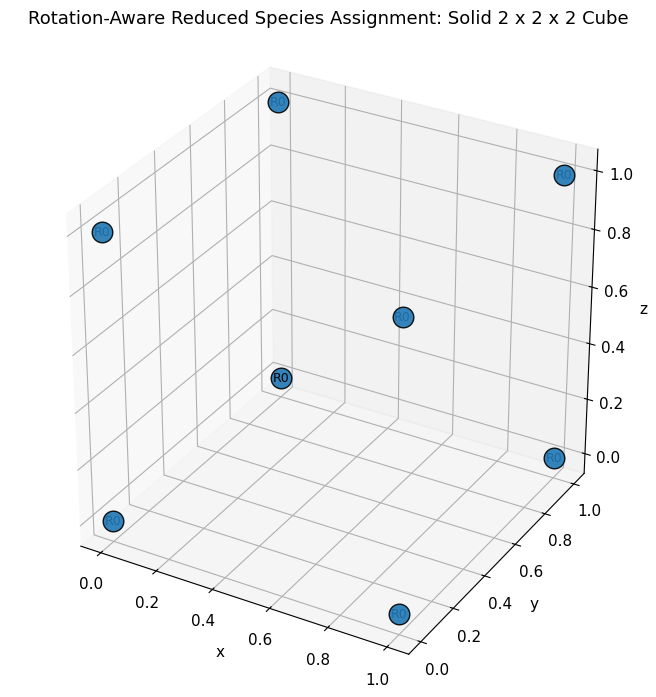

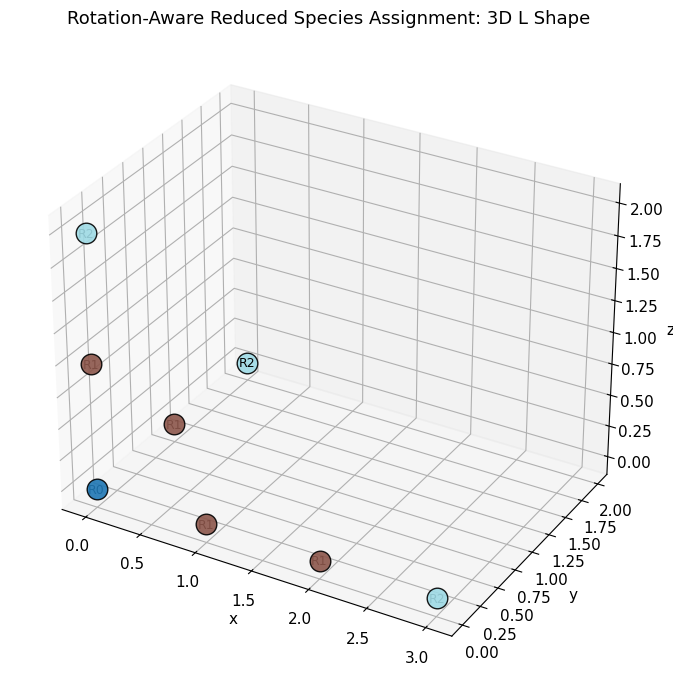

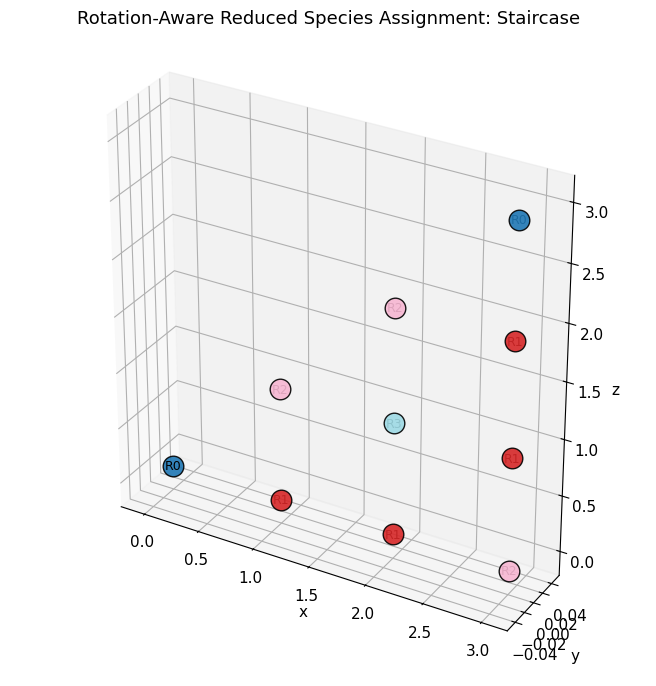

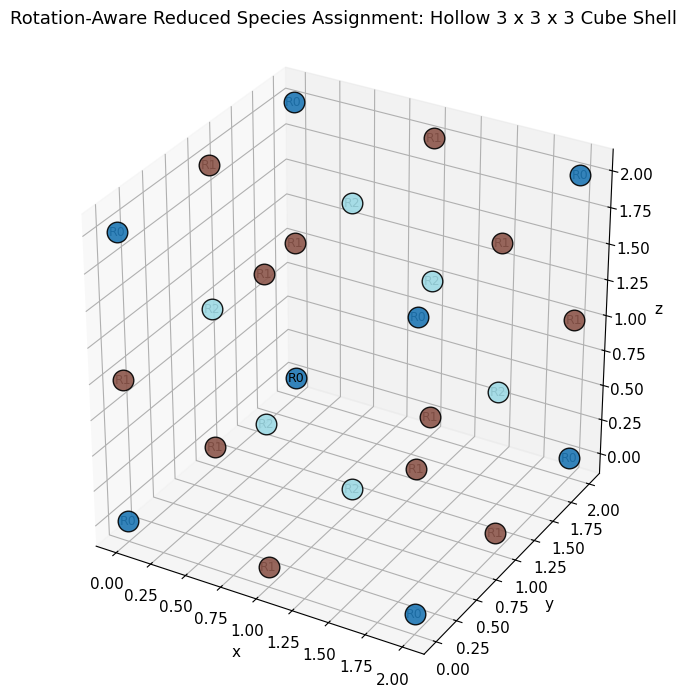

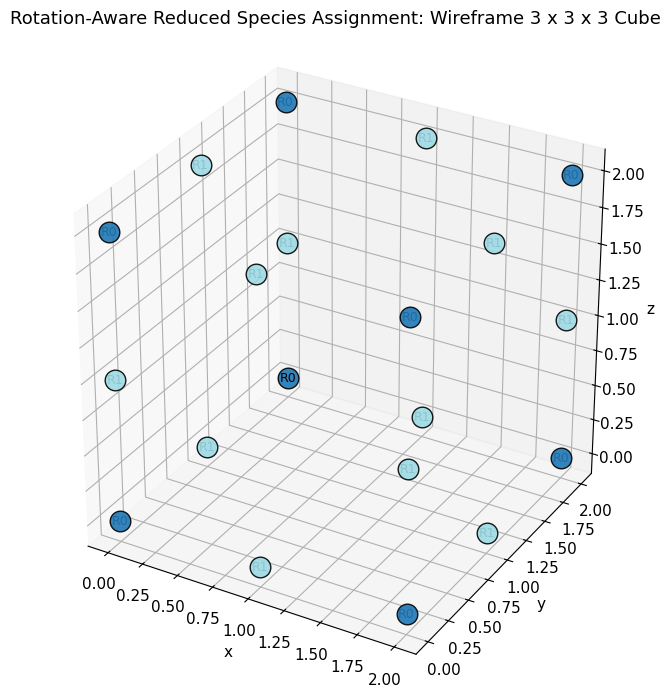

In [28]:
# ============================================================
# Step 6D: Visualize rotation-aware species assignments
# ============================================================

# What I am doing:
# I am plotting each target shape with colors representing rotation-aware
# reduced species.
#
# Compared with the strict reduced plots, these visuals should show stronger
# reuse of building blocks because rotated local environments are grouped.

for shape_name, design in rotation_aware_reduced_designs.items():
    plot_reduced_species_assignment(
        design,
        title_prefix="Rotation-Aware Reduced"
    )

,target_shape,fully_addressable_species,strict_reduced_species,rotation_aware_species
0,Solid 2 x 2 x 2 Cube,8,8,1
1,3D L Shape,8,7,3
2,Staircase,10,7,4
3,Hollow 3 x 3 x 3 Cube Shell,26,23,3
4,Wireframe 3 x 3 x 3 Cube,20,11,2


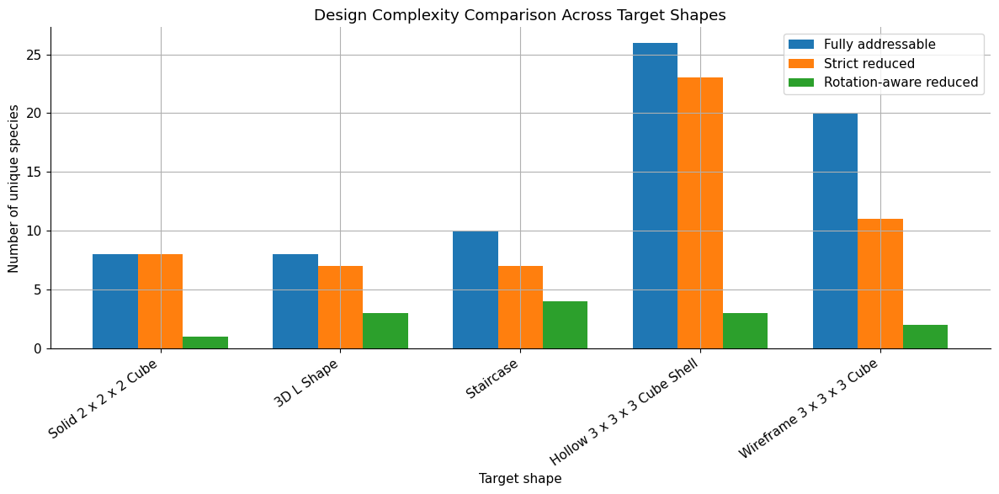

In [29]:
# ============================================================
# Step 6E: Compare all species reduction strategies
# ============================================================

# What I am doing:
# I am creating a side-by-side comparison of the three design strategies:
#
# 1. Fully addressable design
# 2. Strict reduced design
# 3. Rotation-aware reduced design
#
# This is one of the most important visuals in the notebook because it directly
# shows how much design complexity can be reduced.

strategy_comparison_df = rotation_aware_summary_df[
    [
        "target_shape",
        "fully_addressable_species",
        "strict_reduced_species",
        "rotation_aware_species"
    ]
].copy()

display(strategy_comparison_df)

x_positions = np.arange(len(strategy_comparison_df))
bar_width = 0.25

plt.figure(figsize=(12, 6))

plt.bar(
    x_positions - bar_width,
    strategy_comparison_df["fully_addressable_species"],
    width=bar_width,
    label="Fully addressable"
)

plt.bar(
    x_positions,
    strategy_comparison_df["strict_reduced_species"],
    width=bar_width,
    label="Strict reduced"
)

plt.bar(
    x_positions + bar_width,
    strategy_comparison_df["rotation_aware_species"],
    width=bar_width,
    label="Rotation-aware reduced"
)

plt.title("Design Complexity Comparison Across Target Shapes")
plt.xlabel("Target shape")
plt.ylabel("Number of unique species")
plt.xticks(x_positions, strategy_comparison_df["target_shape"], rotation=35, ha="right")
plt.legend()
plt.tight_layout()
plt.show()

,target_shape,strict_reduction_percent,rotation_aware_reduction_percent
0,Solid 2 x 2 x 2 Cube,0.00,87.50
1,3D L Shape,12.50,62.50
2,Staircase,30.00,60.00
3,Hollow 3 x 3 x 3 Cube Shell,11.54,88.46
4,Wireframe 3 x 3 x 3 Cube,45.00,90.00


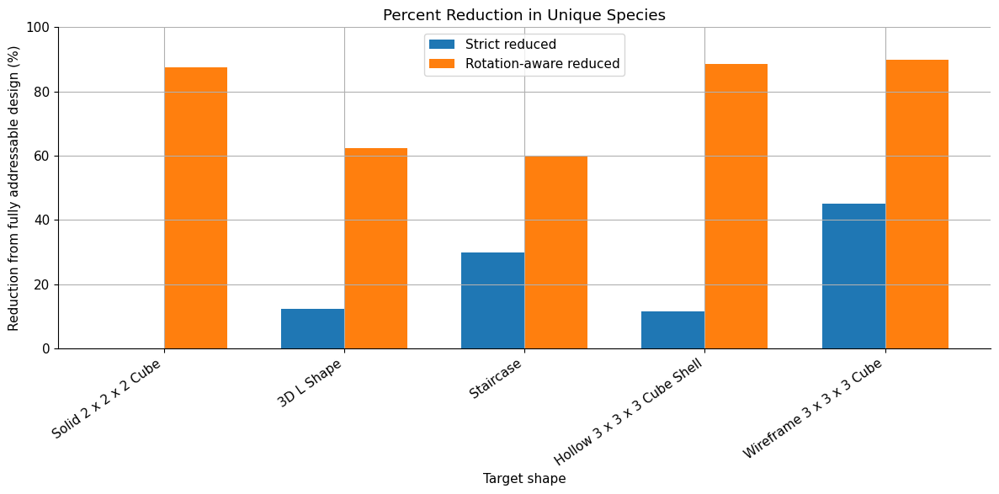

In [30]:
# ============================================================
# Step 6F: Plot percent reduction from fully addressable design
# ============================================================

# What I am doing:
# I am comparing the percent species reduction achieved by the strict and
# rotation-aware strategies.
#
# This helps show whether allowing rotation equivalence gives a meaningful
# improvement over strict local matching.

percent_reduction_df = pd.DataFrame({
    "target_shape": rotation_aware_summary_df["target_shape"],
    "strict_reduction_percent": strict_reduced_summary_df["species_reduction_percent"],
    "rotation_aware_reduction_percent": rotation_aware_summary_df["rotation_aware_reduction_percent"]
})

display(percent_reduction_df)

x_positions = np.arange(len(percent_reduction_df))
bar_width = 0.35

plt.figure(figsize=(12, 6))

plt.bar(
    x_positions - bar_width / 2,
    percent_reduction_df["strict_reduction_percent"],
    width=bar_width,
    label="Strict reduced"
)

plt.bar(
    x_positions + bar_width / 2,
    percent_reduction_df["rotation_aware_reduction_percent"],
    width=bar_width,
    label="Rotation-aware reduced"
)

plt.title("Percent Reduction in Unique Species")
plt.xlabel("Target shape")
plt.ylabel("Reduction from fully addressable design (%)")
plt.xticks(x_positions, percent_reduction_df["target_shape"], rotation=35, ha="right")
plt.ylim(0, 100)
plt.legend()
plt.tight_layout()
plt.show()

In [31]:
# ============================================================
# Step 6G: Inspect compatibility conflicts in rotation-aware designs
# ============================================================

# What I am doing:
# I am checking whether the rotation-aware reduction creates ambiguous patch
# compatibility rules.
#
# A reduced strategy is only useful if the reused species do not create patch
# colors that need to bind to multiple different partners.
#
# If conflicts appear, they motivate the next step: a constraint-style validity
# check that identifies which reduced designs are clean and which require
# refinement.

rotation_conflict_rows = []

for shape_name, design in rotation_aware_reduced_designs.items():
    for color, info in design["compatibility_summary"].items():
        rotation_conflict_rows.append({
            "target_shape": shape_name,
            "patch_color": color,
            "compatible_partners": info["compatible_partners"],
            "number_of_unique_partners": info["number_of_unique_partners"],
            "has_conflict": info["has_conflict"]
        })

rotation_conflict_df = pd.DataFrame(rotation_conflict_rows)

display(rotation_conflict_df[rotation_conflict_df["has_conflict"] == True].head(40))

if rotation_conflict_df["has_conflict"].sum() == 0:
    print("No compatibility conflicts found in the rotation-aware reduced designs.")
else:
    print(
        "Compatibility conflicts were found in at least one rotation-aware design. "
        "This motivates the next constraint-style validity check."
    )

,target_shape,patch_color,compatible_partners,number_of_unique_partners,has_conflict
4,3D L Shape,3D_L_Shape_RotAware_R1_+x,"[3D_L_Shape_RotAware_R0_+x, 3D_L_Shape_RotAwar...",4,True
7,3D L Shape,3D_L_Shape_RotAware_R1_-x,"[3D_L_Shape_RotAware_R0_+z, 3D_L_Shape_RotAwar...",3,True
8,3D L Shape,3D_L_Shape_RotAware_R2_+x,"[3D_L_Shape_RotAware_R1_+x, 3D_L_Shape_RotAwar...",2,True
10,Staircase,Staircase_RotAware_R1_+x,"[Staircase_RotAware_R0_+x, Staircase_RotAware_...",2,True
11,Staircase,Staircase_RotAware_R1_-x,"[Staircase_RotAware_R1_+x, Staircase_RotAware_...",3,True
12,Staircase,Staircase_RotAware_R1_+y,"[Staircase_RotAware_R2_+x, Staircase_RotAware_...",4,True
13,Staircase,Staircase_RotAware_R2_+y,"[Staircase_RotAware_R1_+y, Staircase_RotAware_...",3,True
14,Staircase,Staircase_RotAware_R2_+x,"[Staircase_RotAware_R1_+y, Staircase_RotAware_...",3,True
19,Hollow 3 x 3 x 3 Cube Shell,Hollow_3_x_3_x_3_Cube_Shell_RotAware_R0_+x,"[Hollow_3_x_3_x_3_Cube_Shell_RotAware_R1_+x, H...",2,True
20,Hollow 3 x 3 x 3 Cube Shell,Hollow_3_x_3_x_3_Cube_Shell_RotAware_R1_-x,"[Hollow_3_x_3_x_3_Cube_Shell_RotAware_R0_+x, H...",2,True


Compatibility conflicts were found in at least one rotation-aware design. This motivates the next constraint-style validity check.


In [32]:
# ============================================================
# Step 7: Constraint-style validation of design strategies
# ============================================================

# What I am doing:
# I am adding a simplified constraint-style validation step.
#
# The paper frames the inverse design problem as a Boolean satisfiability
# problem, where species, patch colors, orientations, and compatibility rules
# must satisfy a set of logical constraints.
#
# This notebook does not implement a full SAT solver. Instead, this step creates
# a lightweight validation layer that checks whether each design strategy has
# clean and usable compatibility rules.
#
# A design is treated as valid in this simplified model if:
# 1. Every required target bond has assigned patch colors.
# 2. Each patch color has only one compatible partner.
# 3. Compatibility is symmetric.
# 4. No patch color is forced to bind to multiple different partners.
#
# This step helps separate visually impressive reductions from reductions that
# are actually rule-consistent.

def collect_compatibility_from_bonds(design):
    """
    Collect observed patch-color compatibility relationships from bond rules.

    Returns:
    compatibility_map:
        Dictionary mapping each color to a set of observed compatible partners.
    missing_patch_rows:
        Rows where a required bond does not have a valid patch color.
    """
    compatibility_map = defaultdict(set)
    missing_patch_rows = []

    for bond in design["bond_rules"]:
        color_a = bond.get("color_on_species_a", None)
        color_b = bond.get("color_on_species_b", None)

        if color_a is None or color_b is None:
            missing_patch_rows.append(bond)
            continue

        compatibility_map[color_a].add(color_b)
        compatibility_map[color_b].add(color_a)

    return compatibility_map, missing_patch_rows


def validate_design_constraints(design, strategy_name):
    """
    Validate a design using simplified constraint-style checks.
    """
    shape_name = design["shape_name"]
    compatibility_map, missing_patch_rows = collect_compatibility_from_bonds(design)

    conflict_rows = []
    asymmetric_rows = []

    # Check one-to-one compatibility
    for color, partners in compatibility_map.items():
        if len(partners) > 1:
            conflict_rows.append({
                "target_shape": shape_name,
                "strategy": strategy_name,
                "patch_color": color,
                "compatible_partners": sorted(partners),
                "number_of_partners": len(partners),
                "constraint_issue": "one_color_has_multiple_partners"
            })

    # Check symmetry
    for color, partners in compatibility_map.items():
        for partner in partners:
            if color not in compatibility_map.get(partner, set()):
                asymmetric_rows.append({
                    "target_shape": shape_name,
                    "strategy": strategy_name,
                    "patch_color": color,
                    "partner": partner,
                    "constraint_issue": "compatibility_not_symmetric"
                })

    number_of_species = len(design["patch_rules"])
    number_of_required_bonds = len(design["bond_rules"])

    active_patch_types = sum(
        1
        for species, patch_rule in design["patch_rules"].items()
        for direction, color in patch_rule.items()
        if color is not None
    )

    unique_patch_colors = len(compatibility_map)
    conflict_count = len(conflict_rows)
    asymmetric_count = len(asymmetric_rows)
    missing_patch_count = len(missing_patch_rows)

    valid_one_to_one = conflict_count == 0
    valid_symmetric = asymmetric_count == 0
    valid_patch_assignment = missing_patch_count == 0

    valid_for_simplified_model = (
        valid_one_to_one and
        valid_symmetric and
        valid_patch_assignment
    )

    summary = {
        "target_shape": shape_name,
        "strategy": strategy_name,
        "number_of_species": number_of_species,
        "number_of_required_bonds": number_of_required_bonds,
        "active_patch_types": active_patch_types,
        "unique_patch_colors": unique_patch_colors,
        "missing_patch_assignments": missing_patch_count,
        "compatibility_conflicts": conflict_count,
        "asymmetric_compatibility_rules": asymmetric_count,
        "valid_one_to_one_compatibility": valid_one_to_one,
        "valid_symmetric_compatibility": valid_symmetric,
        "valid_patch_assignment": valid_patch_assignment,
        "valid_for_simplified_model": valid_for_simplified_model
    }

    return summary, conflict_rows, asymmetric_rows, missing_patch_rows


validation_summary_rows = []
all_conflict_rows = []
all_asymmetric_rows = []
all_missing_patch_rows = []

all_design_sets = [
    ("Fully addressable", fully_addressable_designs),
    ("Strict reduced", strict_reduced_designs),
    ("Rotation-aware reduced", rotation_aware_reduced_designs)
]

for strategy_name, design_dict in all_design_sets:
    for shape_name, design in design_dict.items():
        summary, conflict_rows, asymmetric_rows, missing_patch_rows = validate_design_constraints(
            design=design,
            strategy_name=strategy_name
        )

        validation_summary_rows.append(summary)
        all_conflict_rows.extend(conflict_rows)
        all_asymmetric_rows.extend(asymmetric_rows)

        for row in missing_patch_rows:
            copied_row = row.copy()
            copied_row["strategy"] = strategy_name
            copied_row["constraint_issue"] = "missing_patch_assignment"
            all_missing_patch_rows.append(copied_row)

validation_summary_df = pd.DataFrame(validation_summary_rows)
conflict_detail_df = pd.DataFrame(all_conflict_rows)
asymmetric_detail_df = pd.DataFrame(all_asymmetric_rows)
missing_patch_detail_df = pd.DataFrame(all_missing_patch_rows)

display(validation_summary_df)

,target_shape,strategy,number_of_species,number_of_required_bonds,active_patch_types,unique_patch_colors,missing_patch_assignments,compatibility_conflicts,asymmetric_compatibility_rules,valid_one_to_one_compatibility,valid_symmetric_compatibility,valid_patch_assignment,valid_for_simplified_model
0,Solid 2 x 2 x 2 Cube,Fully addressable,8,12,24,24,0,0,0,True,True,True,True
1,3D L Shape,Fully addressable,8,7,14,14,0,0,0,True,True,True,True
2,Staircase,Fully addressable,10,12,24,24,0,0,0,True,True,True,True
3,Hollow 3 x 3 x 3 Cube Shell,Fully addressable,26,48,96,96,0,0,0,True,True,True,True
4,Wireframe 3 x 3 x 3 Cube,Fully addressable,20,24,48,48,0,0,0,True,True,True,True
5,Solid 2 x 2 x 2 Cube,Strict reduced,8,12,24,24,0,0,0,True,True,True,True
6,3D L Shape,Strict reduced,7,7,12,12,0,2,0,False,True,True,False
7,Staircase,Strict reduced,7,12,16,16,0,8,0,False,True,True,False
8,Hollow 3 x 3 x 3 Cube Shell,Strict reduced,23,48,84,84,0,12,0,False,True,True,False
9,Wireframe 3 x 3 x 3 Cube,Strict reduced,11,24,30,30,0,6,0,False,True,True,False


In [33]:
# ============================================================
# Step 7A: Display constraint conflict details
# ============================================================

# What I am doing:
# I am displaying any rule conflicts found during validation.
#
# If a patch color has multiple possible partners, then a reduced strategy may
# allow unintended binding. This is an important warning because species
# reduction is only useful if the assembly rules remain specific enough.

if len(conflict_detail_df) == 0:
    print("No one-to-one compatibility conflicts were found.")
else:
    print("One-to-one compatibility conflicts found:")
    display(conflict_detail_df)

if len(asymmetric_detail_df) == 0:
    print("No asymmetric compatibility rules were found.")
else:
    print("Asymmetric compatibility issues found:")
    display(asymmetric_detail_df)

if len(missing_patch_detail_df) == 0:
    print("No missing patch assignments were found.")
else:
    print("Missing patch assignments found:")
    display(missing_patch_detail_df)

One-to-one compatibility conflicts found:


,target_shape,strategy,patch_color,compatible_partners,number_of_partners,constraint_issue
0,3D L Shape,Strict reduced,3D_L_Shape_Strict_R5_-x,"[3D_L_Shape_Strict_R0_+x, 3D_L_Shape_Strict_R5...",2,one_color_has_multiple_partners
1,3D L Shape,Strict reduced,3D_L_Shape_Strict_R5_+x,"[3D_L_Shape_Strict_R5_-x, 3D_L_Shape_Strict_R6...",2,one_color_has_multiple_partners
2,Staircase,Strict reduced,Staircase_Strict_R1_-x,"[Staircase_Strict_R0_+x, Staircase_Strict_R1_+x]",2,one_color_has_multiple_partners
3,Staircase,Strict reduced,Staircase_Strict_R1_+x,"[Staircase_Strict_R1_-x, Staircase_Strict_R4_-x]",2,one_color_has_multiple_partners
4,Staircase,Strict reduced,Staircase_Strict_R1_+z,"[Staircase_Strict_R2_-z, Staircase_Strict_R3_-z]",2,one_color_has_multiple_partners
5,Staircase,Strict reduced,Staircase_Strict_R2_-z,"[Staircase_Strict_R1_+z, Staircase_Strict_R3_+z]",2,one_color_has_multiple_partners
6,Staircase,Strict reduced,Staircase_Strict_R2_+x,"[Staircase_Strict_R3_-x, Staircase_Strict_R5_-x]",2,one_color_has_multiple_partners
7,Staircase,Strict reduced,Staircase_Strict_R5_-x,"[Staircase_Strict_R2_+x, Staircase_Strict_R3_+x]",2,one_color_has_multiple_partners
8,Staircase,Strict reduced,Staircase_Strict_R5_-z,"[Staircase_Strict_R4_+z, Staircase_Strict_R5_+z]",2,one_color_has_multiple_partners
9,Staircase,Strict reduced,Staircase_Strict_R5_+z,"[Staircase_Strict_R5_-z, Staircase_Strict_R6_-z]",2,one_color_has_multiple_partners


No asymmetric compatibility rules were found.
No missing patch assignments were found.


In [34]:
# ============================================================
# Step 7B: Create a clean validity table for presentation
# ============================================================

# What I am doing:
# I am creating a simplified presentation table that summarizes whether each
# design strategy passes the constraint-style checks.
#
# This table is useful for a meeting because it quickly shows which strategies
# are not only compact, but also rule-consistent.

presentation_validation_df = validation_summary_df[
    [
        "target_shape",
        "strategy",
        "number_of_species",
        "unique_patch_colors",
        "compatibility_conflicts",
        "valid_one_to_one_compatibility",
        "valid_symmetric_compatibility",
        "valid_patch_assignment",
        "valid_for_simplified_model"
    ]
].copy()

display(presentation_validation_df)

,target_shape,strategy,number_of_species,unique_patch_colors,compatibility_conflicts,valid_one_to_one_compatibility,valid_symmetric_compatibility,valid_patch_assignment,valid_for_simplified_model
0,Solid 2 x 2 x 2 Cube,Fully addressable,8,24,0,True,True,True,True
1,3D L Shape,Fully addressable,8,14,0,True,True,True,True
2,Staircase,Fully addressable,10,24,0,True,True,True,True
3,Hollow 3 x 3 x 3 Cube Shell,Fully addressable,26,96,0,True,True,True,True
4,Wireframe 3 x 3 x 3 Cube,Fully addressable,20,48,0,True,True,True,True
5,Solid 2 x 2 x 2 Cube,Strict reduced,8,24,0,True,True,True,True
6,3D L Shape,Strict reduced,7,12,2,False,True,True,False
7,Staircase,Strict reduced,7,16,8,False,True,True,False
8,Hollow 3 x 3 x 3 Cube Shell,Strict reduced,23,84,12,False,True,True,False
9,Wireframe 3 x 3 x 3 Cube,Strict reduced,11,30,6,False,True,True,False


strategy,Fully addressable,Rotation-aware reduced,Strict reduced
target_shape,,,
3D L Shape,1,0,0
Hollow 3 x 3 x 3 Cube Shell,1,0,0
Solid 2 x 2 x 2 Cube,1,1,1
Staircase,1,0,0
Wireframe 3 x 3 x 3 Cube,1,0,0


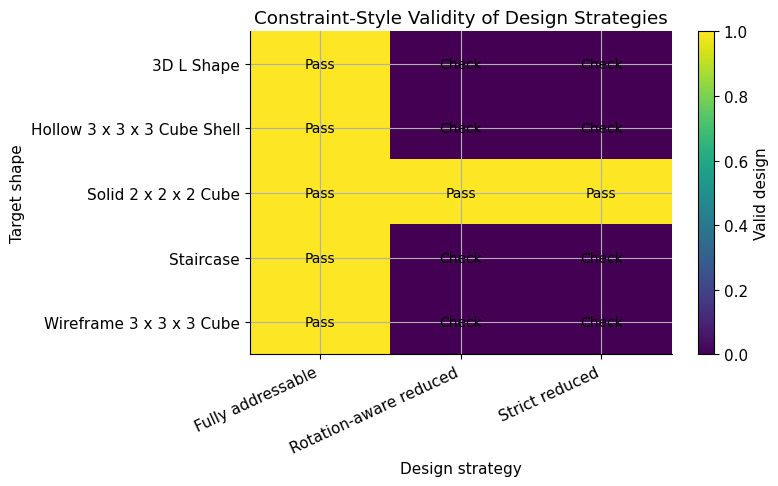

In [35]:
# ============================================================
# Step 7C: Visualize constraint validity as a heatmap
# ============================================================

# What I am doing:
# I am visualizing which strategy-shape combinations pass the simplified
# constraint validation.
#
# A value of 1 means the design passed.
# A value of 0 means the design had at least one compatibility issue.

validity_pivot = validation_summary_df.pivot(
    index="target_shape",
    columns="strategy",
    values="valid_for_simplified_model"
).astype(int)

display(validity_pivot)

plt.figure(figsize=(8, 5))
plt.imshow(validity_pivot.values, aspect="auto")

plt.title("Constraint-Style Validity of Design Strategies")
plt.xlabel("Design strategy")
plt.ylabel("Target shape")

plt.xticks(
    range(len(validity_pivot.columns)),
    validity_pivot.columns,
    rotation=25,
    ha="right"
)

plt.yticks(
    range(len(validity_pivot.index)),
    validity_pivot.index
)

for i in range(validity_pivot.shape[0]):
    for j in range(validity_pivot.shape[1]):
        value = validity_pivot.values[i, j]
        label = "Pass" if value == 1 else "Check"
        plt.text(j, i, label, ha="center", va="center", fontsize=10)

cbar = plt.colorbar()
cbar.set_label("Valid design")

plt.tight_layout()
plt.show()

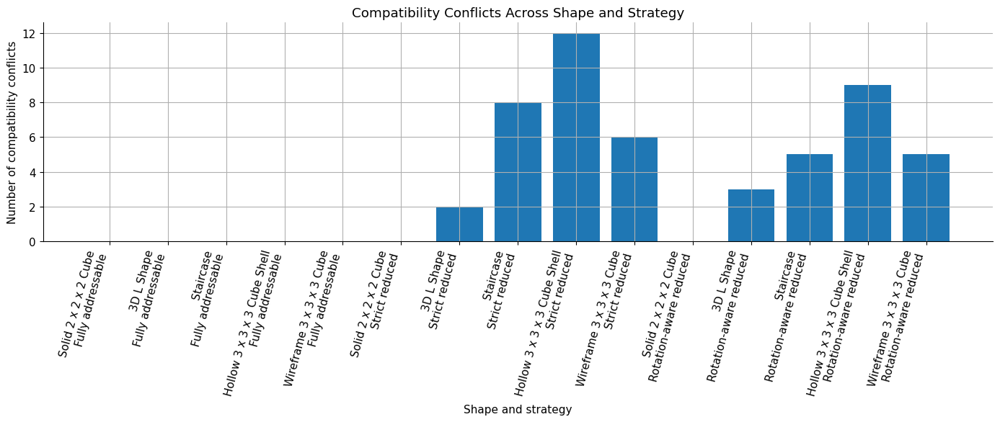

In [36]:
# ============================================================
# Step 7D: Visualize compatibility conflicts by strategy
# ============================================================

# What I am doing:
# I am plotting the number of compatibility conflicts for each design strategy.
#
# This helps identify whether a reduced strategy is clean or whether it creates
# ambiguous binding rules that would need additional constraint solving.

conflict_plot_df = validation_summary_df.copy()

x_labels = (
    conflict_plot_df["target_shape"] + "\n" + conflict_plot_df["strategy"]
)

plt.figure(figsize=(14, 6))
plt.bar(
    x_labels,
    conflict_plot_df["compatibility_conflicts"]
)

plt.title("Compatibility Conflicts Across Shape and Strategy")
plt.xlabel("Shape and strategy")
plt.ylabel("Number of compatibility conflicts")
plt.xticks(rotation=75, ha="right")
plt.tight_layout()
plt.show()

In [37]:
# ============================================================
# Step 7E: Rank design strategies using compactness and validity
# ============================================================

# What I am doing:
# I am creating a simple score that rewards species reduction but penalizes
# compatibility conflicts.
#
# This is not a physical assembly score. It is a simplified notebook-level
# design score that helps compare strategies before stochastic assembly tests.
#
# Higher score means:
# - fewer species
# - fewer conflicts
# - valid patch assignment

rank_rows = []

for shape_name in target_shapes.keys():
    shape_subset = validation_summary_df[
        validation_summary_df["target_shape"] == shape_name
    ].copy()

    fully_species = shape_subset[
        shape_subset["strategy"] == "Fully addressable"
    ]["number_of_species"].iloc[0]

    for _, row in shape_subset.iterrows():
        species = row["number_of_species"]
        conflicts = row["compatibility_conflicts"]
        missing = row["missing_patch_assignments"]
        asymmetric = row["asymmetric_compatibility_rules"]

        compactness_score = 1 - (species / fully_species)
        validity_penalty = 0.20 * conflicts + 0.20 * missing + 0.20 * asymmetric

        design_score = compactness_score - validity_penalty

        rank_rows.append({
            "target_shape": shape_name,
            "strategy": row["strategy"],
            "number_of_species": species,
            "compactness_score": round(compactness_score, 3),
            "validity_penalty": round(validity_penalty, 3),
            "design_score": round(design_score, 3),
            "valid_for_simplified_model": row["valid_for_simplified_model"]
        })

design_ranking_df = pd.DataFrame(rank_rows)

display(design_ranking_df.sort_values(
    by=["target_shape", "design_score"],
    ascending=[True, False]
))

,target_shape,strategy,number_of_species,compactness_score,validity_penalty,design_score,valid_for_simplified_model
5,3D L Shape,Rotation-aware reduced,3,0.625,0.6,0.025,False
3,3D L Shape,Fully addressable,8,0.000,0.0,0.000,True
4,3D L Shape,Strict reduced,7,0.125,0.4,-0.275,False
9,Hollow 3 x 3 x 3 Cube Shell,Fully addressable,26,0.000,0.0,0.000,True
11,Hollow 3 x 3 x 3 Cube Shell,Rotation-aware reduced,3,0.885,1.8,-0.915,False
10,Hollow 3 x 3 x 3 Cube Shell,Strict reduced,23,0.115,2.4,-2.285,False
2,Solid 2 x 2 x 2 Cube,Rotation-aware reduced,1,0.875,0.0,0.875,True
0,Solid 2 x 2 x 2 Cube,Fully addressable,8,0.000,0.0,0.000,True
1,Solid 2 x 2 x 2 Cube,Strict reduced,8,0.000,0.0,0.000,True
6,Staircase,Fully addressable,10,0.000,0.0,0.000,True


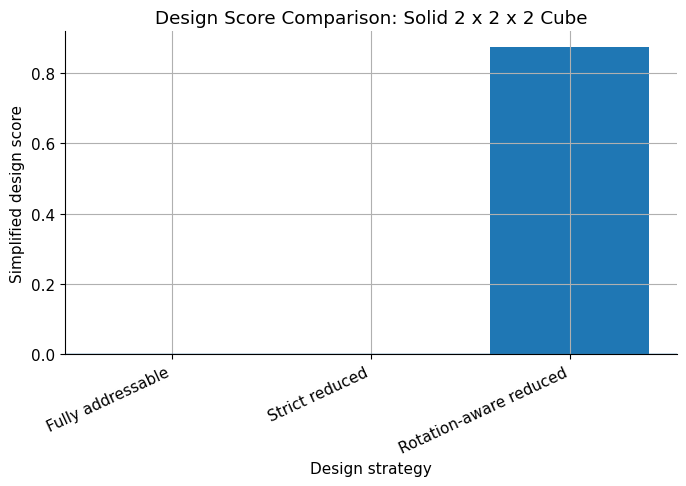

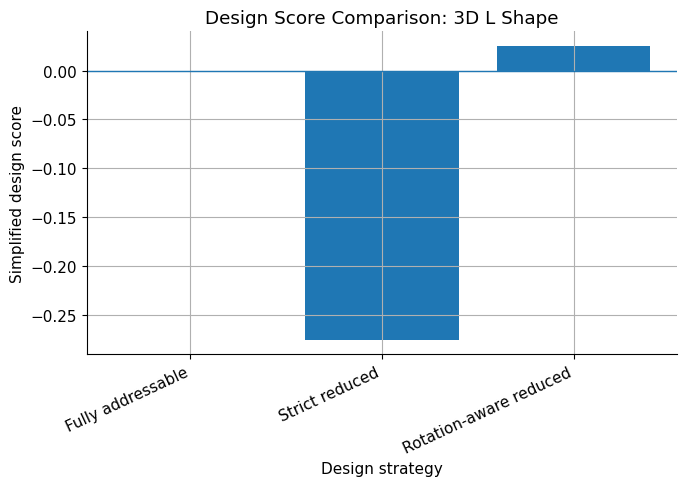

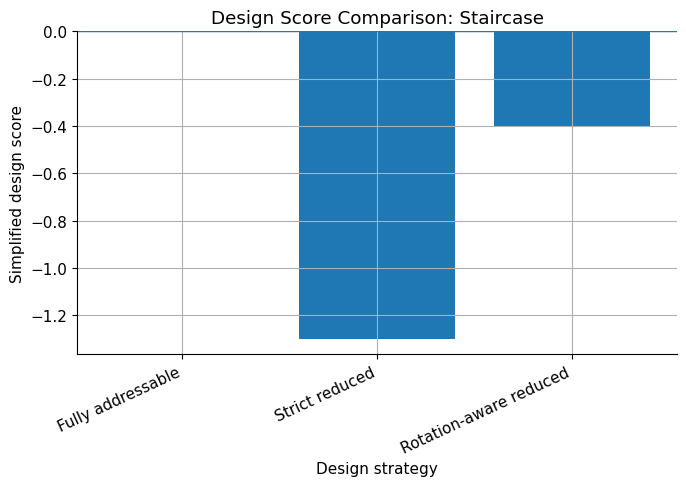

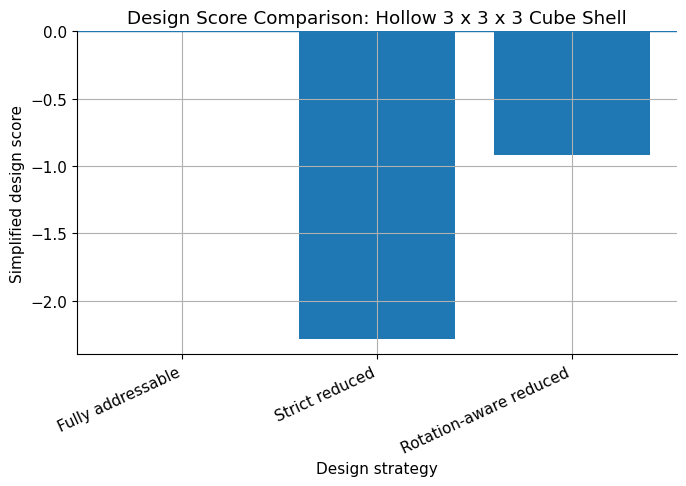

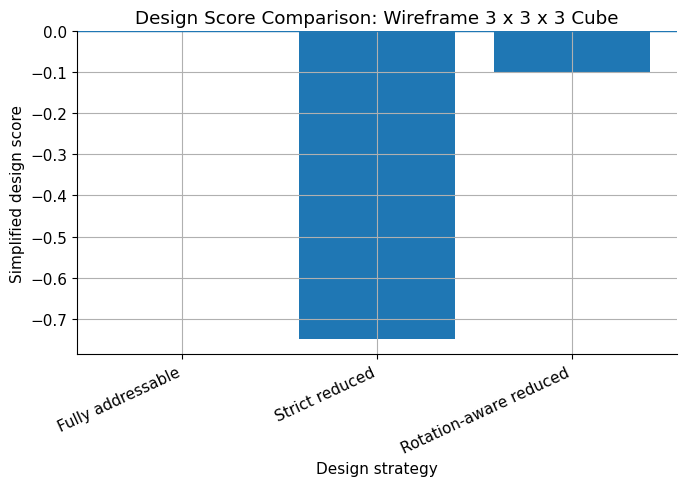

In [38]:
# ============================================================
# Step 7F: Visualize design score comparison
# ============================================================

# What I am doing:
# I am plotting the simplified design score for each strategy.
#
# This gives a compact visual summary of the tradeoff between reducing species
# complexity and preserving clean compatibility rules.

for shape_name in target_shapes.keys():
    subset = design_ranking_df[
        design_ranking_df["target_shape"] == shape_name
    ].copy()

    plt.figure(figsize=(7, 5))
    plt.bar(
        subset["strategy"],
        subset["design_score"]
    )

    plt.title(f"Design Score Comparison: {shape_name}")
    plt.xlabel("Design strategy")
    plt.ylabel("Simplified design score")
    plt.xticks(rotation=25, ha="right")
    plt.axhline(0, linewidth=1)
    plt.tight_layout()
    plt.show()

,target_shape,strategy,number_of_species,compatibility_conflicts,static_off_target_risk_score
0,Solid 2 x 2 x 2 Cube,Fully addressable,8,0,8
1,3D L Shape,Fully addressable,8,0,8
2,Staircase,Fully addressable,10,0,10
3,Hollow 3 x 3 x 3 Cube Shell,Fully addressable,26,0,26
4,Wireframe 3 x 3 x 3 Cube,Fully addressable,20,0,20
5,Solid 2 x 2 x 2 Cube,Strict reduced,8,0,8
6,3D L Shape,Strict reduced,7,2,27
7,Staircase,Strict reduced,7,8,87
8,Hollow 3 x 3 x 3 Cube Shell,Strict reduced,23,12,143
9,Wireframe 3 x 3 x 3 Cube,Strict reduced,11,6,71


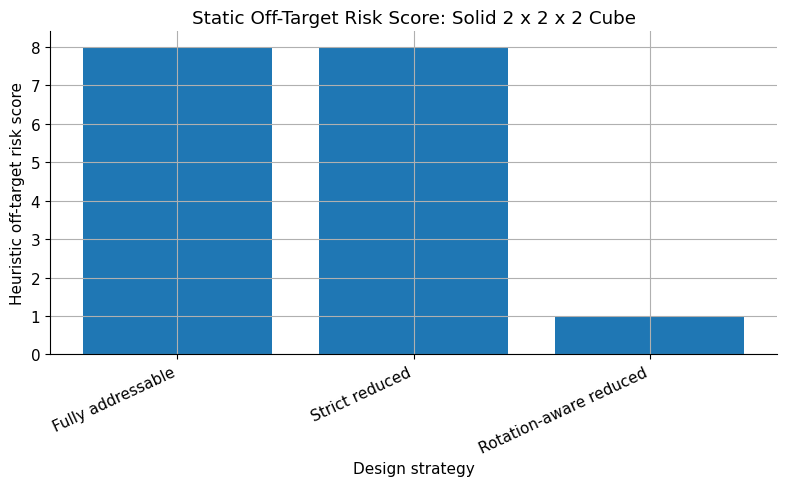

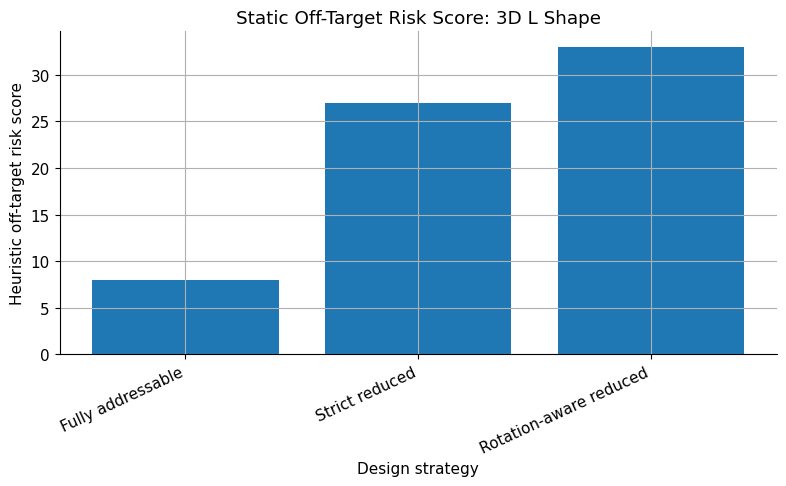

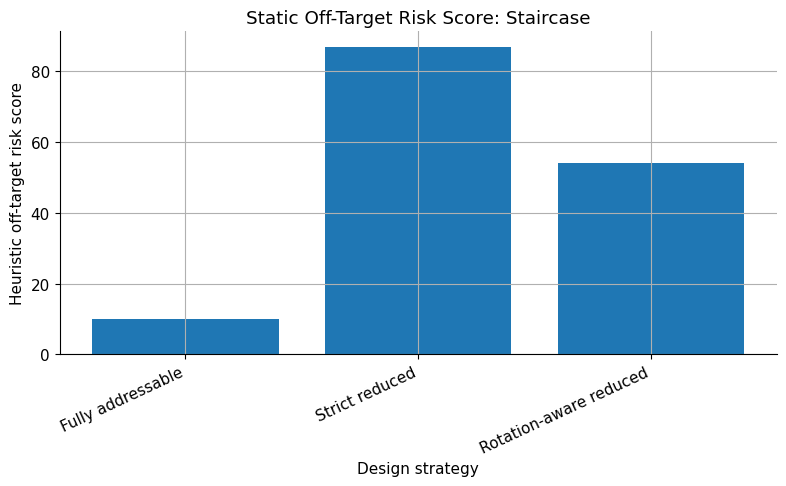

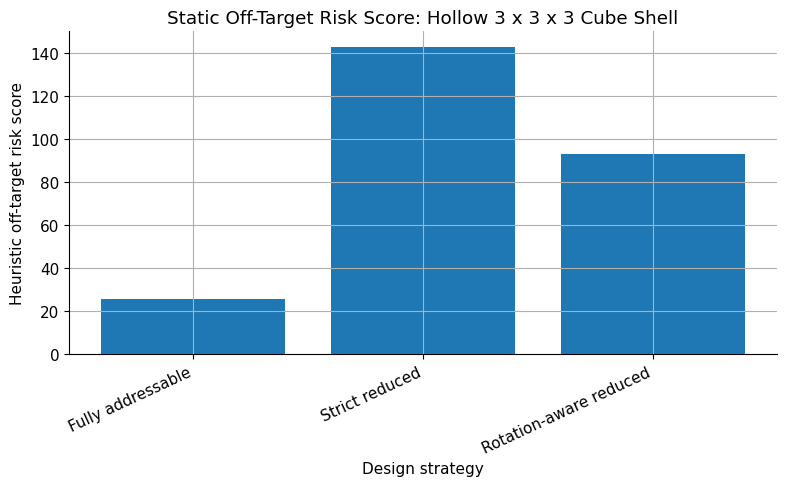

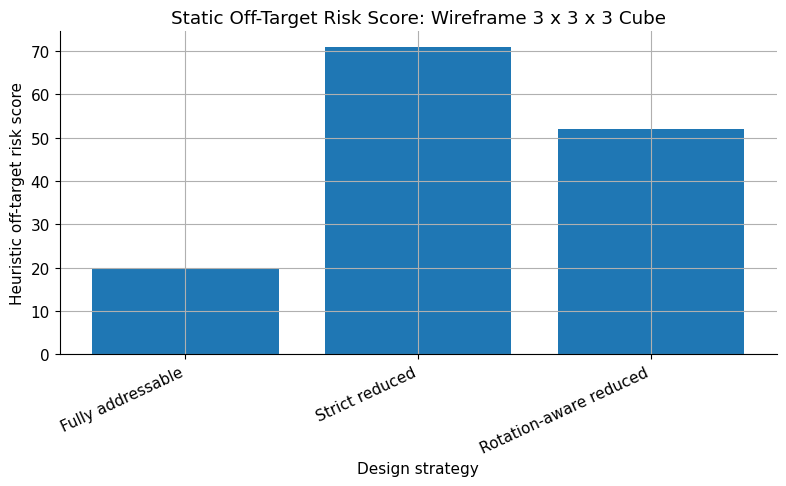

In [59]:
# ============================================================
# Step 10: Calculate static off-target risk scores
# ============================================================

# What I am doing:
# I am creating a heuristic score for static off-target risk. This score
# attempts to quantify the potential for undesirable assembly outcomes based on
# design characteristics such as species complexity and compatibility conflicts.
# A higher score indicates more warning signs.
#
# Factors contributing to a higher risk score:
# - Higher number of species (more unique components, potentially more unintended interactions)
# - Higher number of compatibility conflicts (patch ambiguity)

static_off_target_risk_df = validation_summary_df[[
    "target_shape",
    "strategy",
    "number_of_species",
    "compatibility_conflicts"
]].copy()

# Define a heuristic risk score:
# Reward lower species count and lower conflicts.
# A simple score could be: species_count + (conflict_count * weight)
# The weight for conflicts is set higher to emphasize their importance as warning signs.
WEIGHT_CONFLICTS = 10

static_off_target_risk_df["static_off_target_risk_score"] = (
    static_off_target_risk_df["number_of_species"] +
    static_off_target_risk_df["compatibility_conflicts"] * WEIGHT_CONFLICTS
)

display(static_off_target_risk_df)

# ============================================================
# Step 10A: Visualize static off-target risk
# ============================================================

# What I am doing:
# I am plotting the static off-target risk score for each strategy and target.
#
# A higher score means the design has more possible warning signs such as:
# - patch ambiguity,
# - repeated reusable species,
# - extra compatible binding possibilities,
# - stronger species reuse pressure.

for shape_name in target_shapes.keys():
    subset = static_off_target_risk_df[
        static_off_target_risk_df["target_shape"] == shape_name
    ].copy()

    plt.figure(figsize=(8, 5))

    plt.bar(
        subset["strategy"],
        subset["static_off_target_risk_score"]
    )

    plt.title(f"Static Off-Target Risk Score: {shape_name}")
    plt.xlabel("Design strategy")
    plt.ylabel("Heuristic off-target risk score")
    plt.xticks(rotation=25, ha="right")
    plt.tight_layout()
    plt.show()

In [40]:
# ============================================================
# Step 8: Simplified stochastic assembly test
# ============================================================

# What I am doing:
# I am testing whether each design strategy can assemble its target shape under
# a simplified stochastic growth model.
#
# This is not a molecular dynamics simulation and it is not a full SAT-based
# assembler. Instead, it is a lightweight target-guided stochastic model that
# asks a useful first question:
#
#     If the target structure grows one compatible bond at a time,
#     how often does each design strategy successfully complete the shape?
#
# The simulation starts from a random seed voxel and repeatedly tries to attach
# neighboring voxels through required target bonds.
#
# A design is more likely to assemble successfully when:
# 1. Required target bonds have assigned patch colors.
# 2. Patch compatibility is one-to-one and unambiguous.
# 3. The growing structure does not stall before reaching the full target.
#
# A design is more likely to fail when:
# 1. Patch colors have multiple possible partners.
# 2. A reduced design creates ambiguous binding possibilities.
# 3. The simulated assembly reaches the maximum number of attempts without
#    completing the target.

def get_design_compatibility_map(design):
    """
    Build a compatibility map from the observed bond rules in a design.

    Each patch color maps to the set of patch colors it is observed to bind to
    in the target structure.
    """
    compatibility_map = defaultdict(set)

    for bond in design["bond_rules"]:
        color_a = bond.get("color_on_species_a", None)
        color_b = bond.get("color_on_species_b", None)

        if color_a is None or color_b is None:
            continue

        compatibility_map[color_a].add(color_b)
        compatibility_map[color_b].add(color_a)

    return compatibility_map


def get_bond_specificity_score(color_a, color_b, compatibility_map):
    """
    Estimate how specific a bond is.

    If each color has exactly one partner and they match each other, the score is 1.
    If a color has multiple possible partners, the score is reduced.
    """
    if color_a is None or color_b is None:
        return 0.0

    partners_a = compatibility_map.get(color_a, set())
    partners_b = compatibility_map.get(color_b, set())

    if color_b not in partners_a or color_a not in partners_b:
        return 0.0

    ambiguity_a = max(1, len(partners_a))
    ambiguity_b = max(1, len(partners_b))

    specificity_score = 1 / max(ambiguity_a, ambiguity_b)

    return specificity_score


def simulate_single_assembly_trial(
    design,
    max_attempts_multiplier=12,
    base_attachment_probability=0.92,
    ambiguity_failure_strength=0.35
):
    """
    Run one simplified stochastic assembly trial.

    Returns a dictionary containing:
    - success or failure
    - number of attempts
    - number of assembled voxels
    - failure reason
    - assembly trace over time
    """
    coords = list(design["coords"])
    target_size = len(coords)
    bond_rules = design["bond_rules"]
    compatibility_map = get_design_compatibility_map(design)

    max_attempts = max(25, max_attempts_multiplier * target_size)

    seed = random.choice(coords)
    assembled = {seed}

    trace = [
        {
            "attempt": 0,
            "assembled_count": len(assembled),
            "assembled_fraction": len(assembled) / target_size,
            "event": "seed"
        }
    ]

    failure_reason = None

    for attempt in range(1, max_attempts + 1):

        frontier_bonds = []

        for bond in bond_rules:
            a = bond["voxel_a"]
            b = bond["voxel_b"]

            if a in assembled and b not in assembled:
                frontier_bonds.append((bond, b))
            elif b in assembled and a not in assembled:
                frontier_bonds.append((bond, a))

        if len(frontier_bonds) == 0:
            if len(assembled) == target_size:
                failure_reason = None
            else:
                failure_reason = "stalled_no_frontier_bonds"
            break

        selected_bond, candidate_voxel = random.choice(frontier_bonds)

        color_a = selected_bond.get("color_on_species_a", None)
        color_b = selected_bond.get("color_on_species_b", None)

        specificity_score = get_bond_specificity_score(
            color_a=color_a,
            color_b=color_b,
            compatibility_map=compatibility_map
        )

        attachment_probability = base_attachment_probability * specificity_score

        ambiguity_risk = ambiguity_failure_strength * (1 - specificity_score)

        if specificity_score <= 0:
            failure_reason = "missing_or_invalid_patch_rule"
            trace.append({
                "attempt": attempt,
                "assembled_count": len(assembled),
                "assembled_fraction": len(assembled) / target_size,
                "event": "invalid_patch_rule"
            })
            break

        if random.random() < ambiguity_risk:
            failure_reason = "ambiguous_off_target_binding"
            trace.append({
                "attempt": attempt,
                "assembled_count": len(assembled),
                "assembled_fraction": len(assembled) / target_size,
                "event": "ambiguous_wrong_partner"
            })
            break

        if random.random() < attachment_probability:
            assembled.add(candidate_voxel)
            event = "attached"
        else:
            event = "failed_attempt"

        trace.append({
            "attempt": attempt,
            "assembled_count": len(assembled),
            "assembled_fraction": len(assembled) / target_size,
            "event": event
        })

        if len(assembled) == target_size:
            failure_reason = None
            break

    success = len(assembled) == target_size and failure_reason is None

    if not success and failure_reason is None:
        failure_reason = "maximum_attempts_reached"

    result = {
        "success": success,
        "attempts": attempt,
        "assembled_voxels": len(assembled),
        "target_voxels": target_size,
        "assembled_fraction": len(assembled) / target_size,
        "failure_reason": "success" if success else failure_reason,
        "trace": trace,
        "final_assembled_set": assembled
    }

    return result

In [41]:
# ============================================================
# Step 8A: Run stochastic assembly trials for all designs
# ============================================================

# What I am doing:
# I am running repeated assembly trials for every target shape and every design
# strategy.
#
# Repeating the simulation many times gives an estimated success rate instead
# of relying on one random trial.

N_ASSEMBLY_TRIALS = 150

assembly_design_sets = [
    ("Fully addressable", fully_addressable_designs),
    ("Strict reduced", strict_reduced_designs),
    ("Rotation-aware reduced", rotation_aware_reduced_designs)
]

assembly_summary_rows = []
assembly_trial_rows = []
assembly_trace_records = {}

for strategy_name, design_dict in assembly_design_sets:
    for shape_name, design in design_dict.items():

        trial_results = []

        for trial_id in range(N_ASSEMBLY_TRIALS):
            result = simulate_single_assembly_trial(design)
            trial_results.append(result)

            assembly_trial_rows.append({
                "target_shape": shape_name,
                "strategy": strategy_name,
                "trial_id": trial_id,
                "success": result["success"],
                "attempts": result["attempts"],
                "assembled_voxels": result["assembled_voxels"],
                "target_voxels": result["target_voxels"],
                "assembled_fraction": result["assembled_fraction"],
                "failure_reason": result["failure_reason"]
            })

            if trial_id == 0:
                assembly_trace_records[(shape_name, strategy_name)] = result["trace"]

        success_values = [r["success"] for r in trial_results]
        attempts_values = [r["attempts"] for r in trial_results]
        assembled_fraction_values = [r["assembled_fraction"] for r in trial_results]

        successful_attempts = [
            r["attempts"]
            for r in trial_results
            if r["success"]
        ]

        failure_reasons = Counter(
            r["failure_reason"]
            for r in trial_results
        )

        assembly_summary_rows.append({
            "target_shape": shape_name,
            "strategy": strategy_name,
            "number_of_trials": N_ASSEMBLY_TRIALS,
            "success_rate_percent": round(100 * np.mean(success_values), 2),
            "mean_attempts_all_trials": round(np.mean(attempts_values), 2),
            "mean_attempts_successful_trials": round(np.mean(successful_attempts), 2) if successful_attempts else np.nan,
            "mean_final_assembled_fraction": round(np.mean(assembled_fraction_values), 3),
            "most_common_outcome": failure_reasons.most_common(1)[0][0]
        })

assembly_summary_df = pd.DataFrame(assembly_summary_rows)
assembly_trial_df = pd.DataFrame(assembly_trial_rows)

display(assembly_summary_df)

,target_shape,strategy,number_of_trials,success_rate_percent,mean_attempts_all_trials,mean_attempts_successful_trials,mean_final_assembled_fraction,most_common_outcome
0,Solid 2 x 2 x 2 Cube,Fully addressable,150,100.00,7.59,7.59,1.000,success
1,3D L Shape,Fully addressable,150,100.00,7.59,7.59,1.000,success
2,Staircase,Fully addressable,150,100.00,9.85,9.85,1.000,success
3,Hollow 3 x 3 x 3 Cube Shell,Fully addressable,150,100.00,27.09,27.09,1.000,success
4,Wireframe 3 x 3 x 3 Cube,Fully addressable,150,100.00,20.61,20.61,1.000,success
5,Solid 2 x 2 x 2 Cube,Strict reduced,150,100.00,7.58,7.58,1.000,success
6,3D L Shape,Strict reduced,150,37.33,7.30,9.88,0.684,ambiguous_off_target_binding
7,Staircase,Strict reduced,150,3.33,5.23,15.80,0.295,ambiguous_off_target_binding
8,Hollow 3 x 3 x 3 Cube Shell,Strict reduced,150,1.33,10.36,36.00,0.287,ambiguous_off_target_binding
9,Wireframe 3 x 3 x 3 Cube,Strict reduced,150,0.00,3.42,NaN,0.076,ambiguous_off_target_binding


In [42]:
# ============================================================
# Step 8B: Display detailed trial-level results
# ============================================================

# What I am doing:
# I am keeping a trial-level table so that the notebook does not only show
# averages. This makes the analysis more transparent because individual success
# and failure outcomes can be inspected.

display(assembly_trial_df.head(30))

,target_shape,strategy,trial_id,success,attempts,assembled_voxels,target_voxels,assembled_fraction,failure_reason
0,Solid 2 x 2 x 2 Cube,Fully addressable,0,True,7,8,8,1.0,success
1,Solid 2 x 2 x 2 Cube,Fully addressable,1,True,7,8,8,1.0,success
2,Solid 2 x 2 x 2 Cube,Fully addressable,2,True,7,8,8,1.0,success
3,Solid 2 x 2 x 2 Cube,Fully addressable,3,True,7,8,8,1.0,success
4,Solid 2 x 2 x 2 Cube,Fully addressable,4,True,7,8,8,1.0,success
5,Solid 2 x 2 x 2 Cube,Fully addressable,5,True,8,8,8,1.0,success
6,Solid 2 x 2 x 2 Cube,Fully addressable,6,True,8,8,8,1.0,success
7,Solid 2 x 2 x 2 Cube,Fully addressable,7,True,7,8,8,1.0,success
8,Solid 2 x 2 x 2 Cube,Fully addressable,8,True,11,8,8,1.0,success
9,Solid 2 x 2 x 2 Cube,Fully addressable,9,True,7,8,8,1.0,success


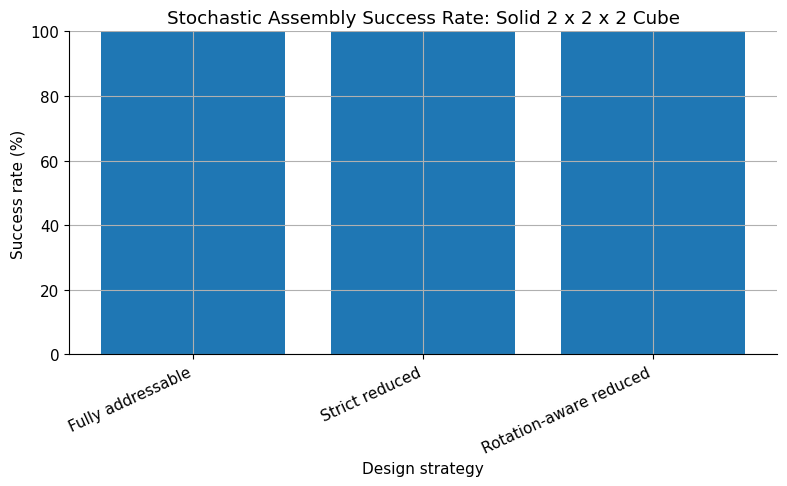

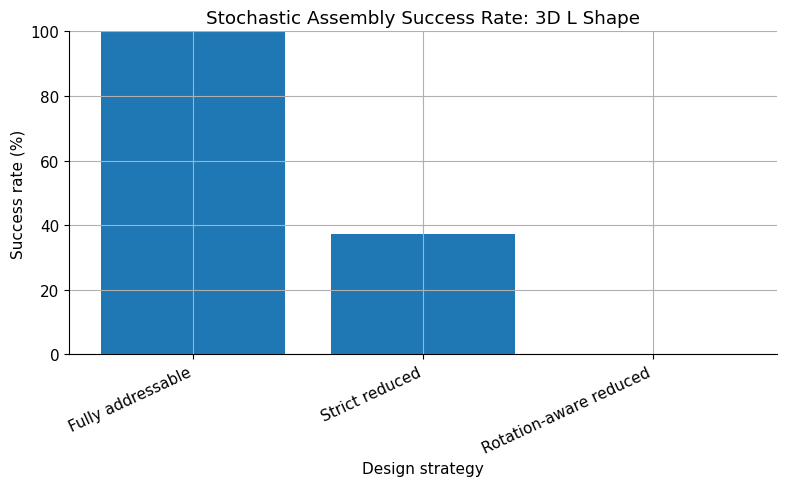

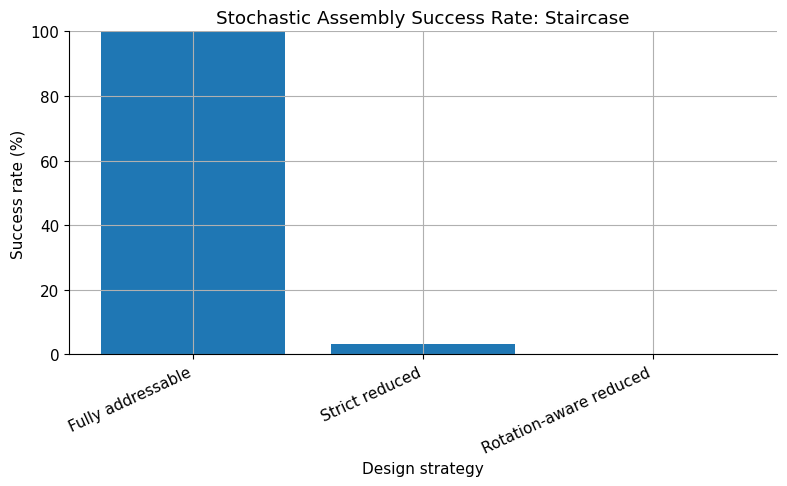

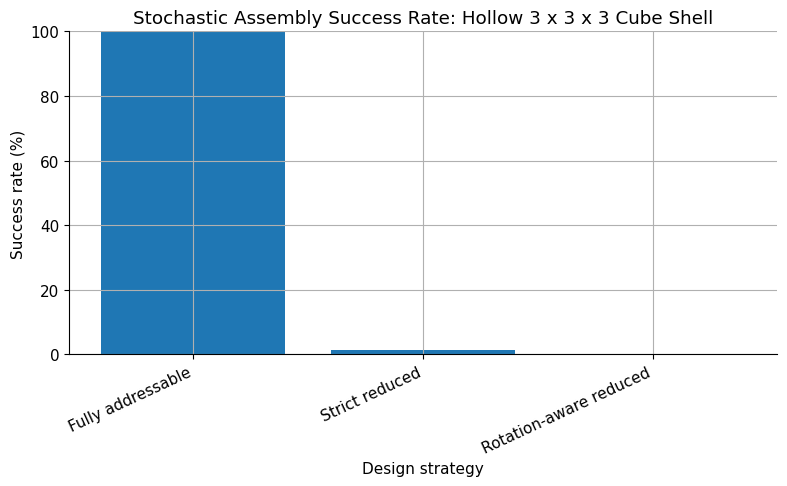

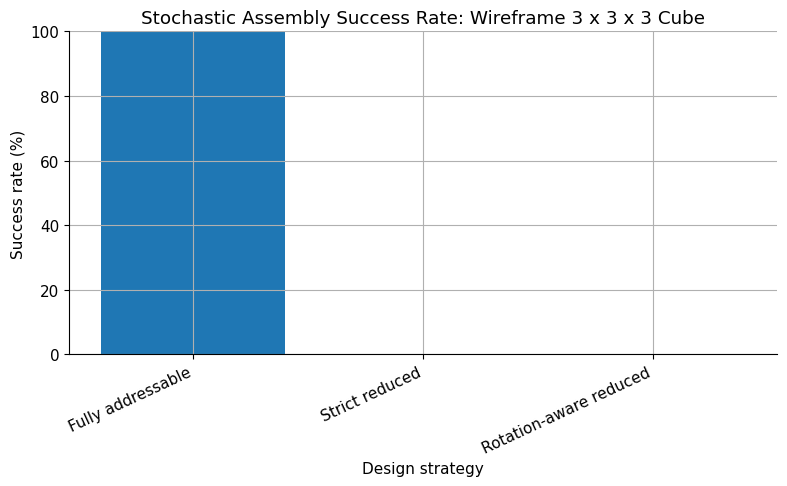

In [43]:
# ============================================================
# Step 8C: Visualize stochastic assembly success rates
# ============================================================

# What I am doing:
# I am plotting the assembly success rate for each strategy and target shape.
#
# This is one of the central results of the notebook because it connects design
# complexity to assembly reliability.

for shape_name in target_shapes.keys():
    subset = assembly_summary_df[
        assembly_summary_df["target_shape"] == shape_name
    ].copy()

    plt.figure(figsize=(8, 5))

    plt.bar(
        subset["strategy"],
        subset["success_rate_percent"]
    )

    plt.title(f"Stochastic Assembly Success Rate: {shape_name}")
    plt.xlabel("Design strategy")
    plt.ylabel("Success rate (%)")
    plt.ylim(0, 100)
    plt.xticks(rotation=25, ha="right")
    plt.tight_layout()
    plt.show()

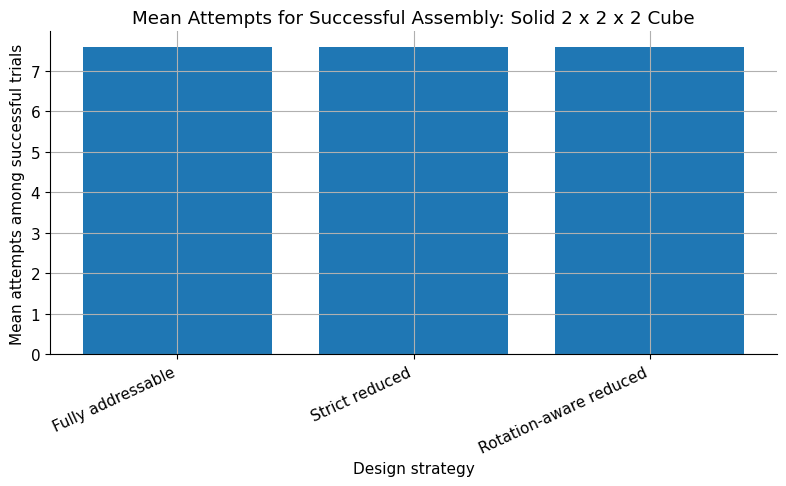

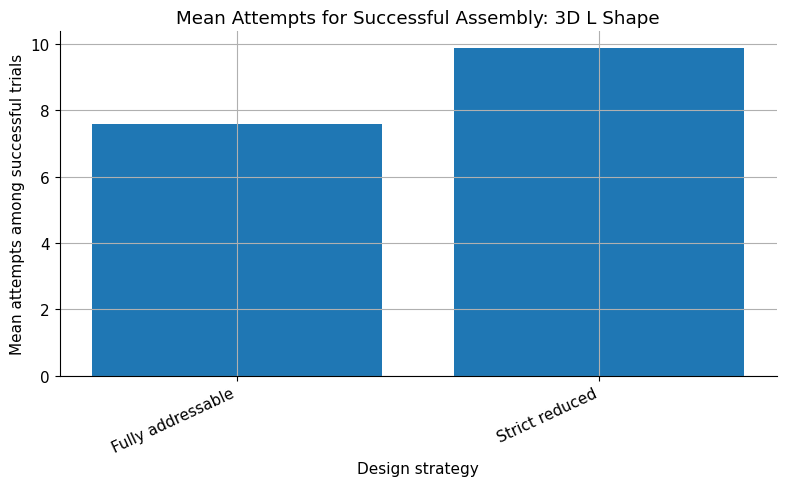

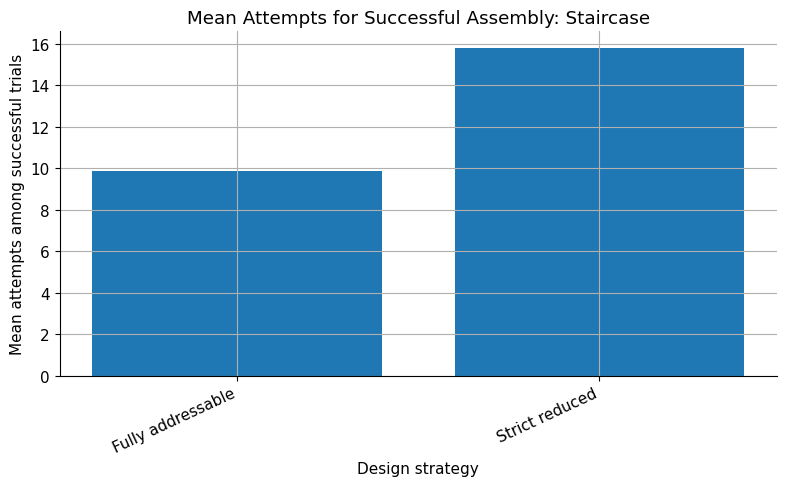

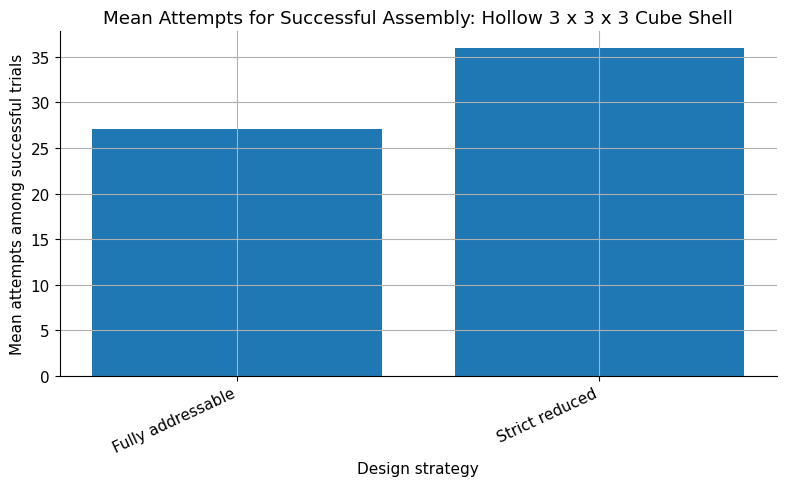

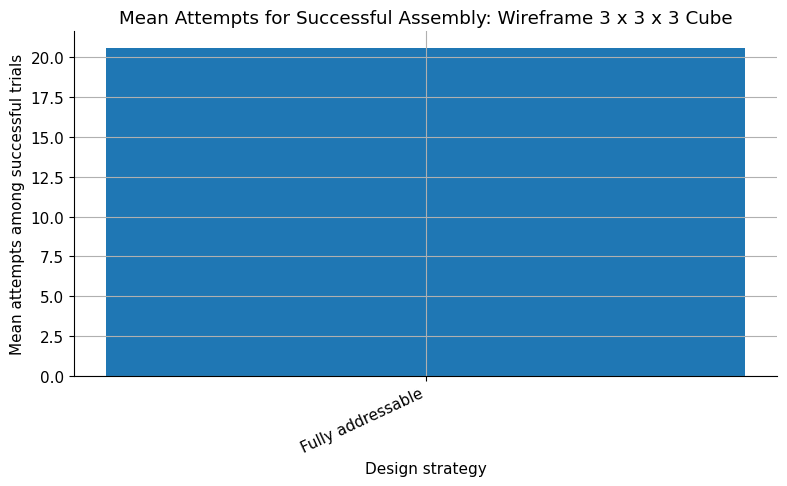

In [44]:
# ============================================================
# Step 8D: Compare assembly efficiency using successful trials
# ============================================================

# What I am doing:
# I am plotting the average number of attempts needed for successful assembly.
#
# Lower values mean the target tends to complete faster in the simplified
# stochastic model.
#
# This metric is only calculated for trials that successfully assembled the
# target shape.

for shape_name in target_shapes.keys():
    subset = assembly_summary_df[
        assembly_summary_df["target_shape"] == shape_name
    ].copy()

    plt.figure(figsize=(8, 5))

    plt.bar(
        subset["strategy"],
        subset["mean_attempts_successful_trials"]
    )

    plt.title(f"Mean Attempts for Successful Assembly: {shape_name}")
    plt.xlabel("Design strategy")
    plt.ylabel("Mean attempts among successful trials")
    plt.xticks(rotation=25, ha="right")
    plt.tight_layout()
    plt.show()

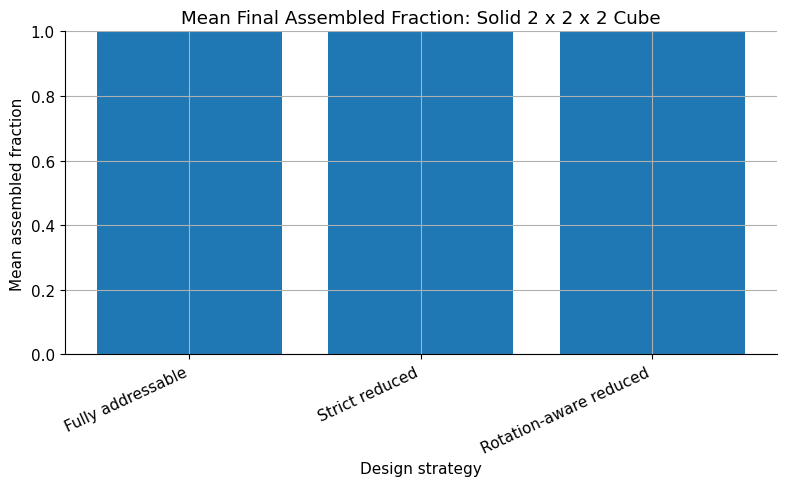

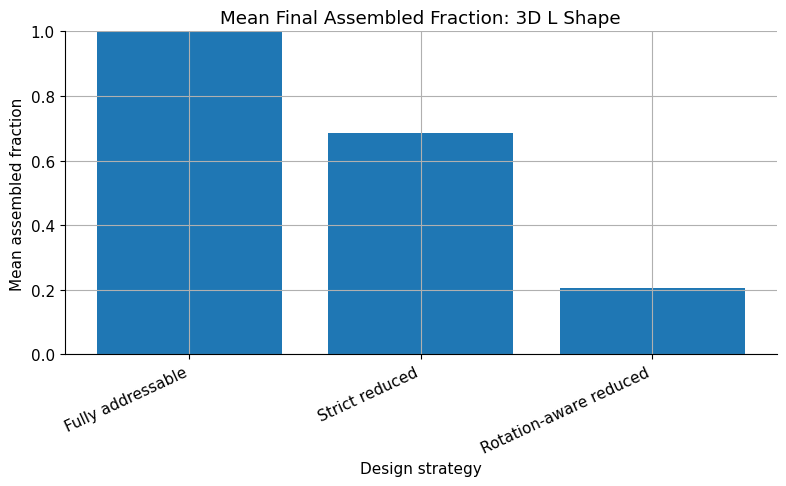

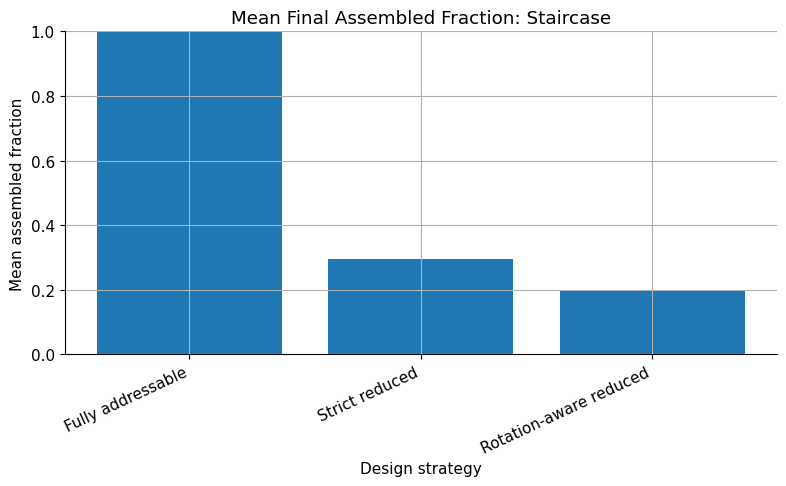

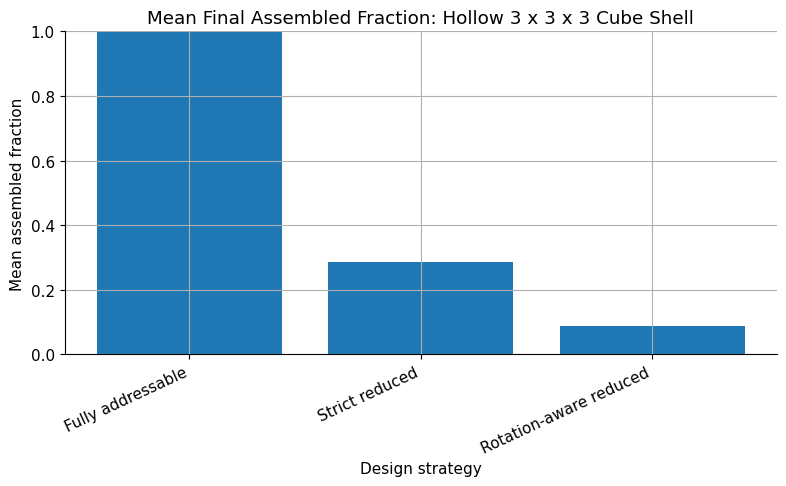

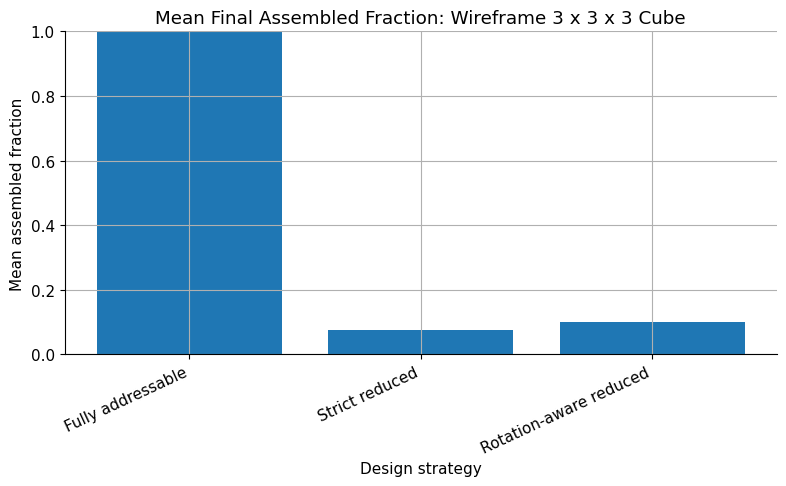

In [45]:
# ============================================================
# Step 8E: Visualize final assembled fraction
# ============================================================

# What I am doing:
# I am plotting the average final fraction of the target that assembled.
#
# This is useful because a failed trial may still assemble most of the target.
# It gives a more nuanced view than success or failure alone.

for shape_name in target_shapes.keys():
    subset = assembly_summary_df[
        assembly_summary_df["target_shape"] == shape_name
    ].copy()

    plt.figure(figsize=(8, 5))

    plt.bar(
        subset["strategy"],
        subset["mean_final_assembled_fraction"]
    )

    plt.title(f"Mean Final Assembled Fraction: {shape_name}")
    plt.xlabel("Design strategy")
    plt.ylabel("Mean assembled fraction")
    plt.ylim(0, 1)
    plt.xticks(rotation=25, ha="right")
    plt.tight_layout()
    plt.show()

,target_shape,strategy,failure_reason,count
0,3D L Shape,Fully addressable,success,150
1,3D L Shape,Rotation-aware reduced,ambiguous_off_target_binding,150
2,3D L Shape,Strict reduced,ambiguous_off_target_binding,94
3,3D L Shape,Strict reduced,success,56
4,Hollow 3 x 3 x 3 Cube Shell,Fully addressable,success,150
5,Hollow 3 x 3 x 3 Cube Shell,Rotation-aware reduced,ambiguous_off_target_binding,150
6,Hollow 3 x 3 x 3 Cube Shell,Strict reduced,ambiguous_off_target_binding,148
7,Hollow 3 x 3 x 3 Cube Shell,Strict reduced,success,2
8,Solid 2 x 2 x 2 Cube,Fully addressable,success,150
9,Solid 2 x 2 x 2 Cube,Rotation-aware reduced,success,150


failure_reason,success
strategy,
Fully addressable,150
Rotation-aware reduced,150
Strict reduced,150


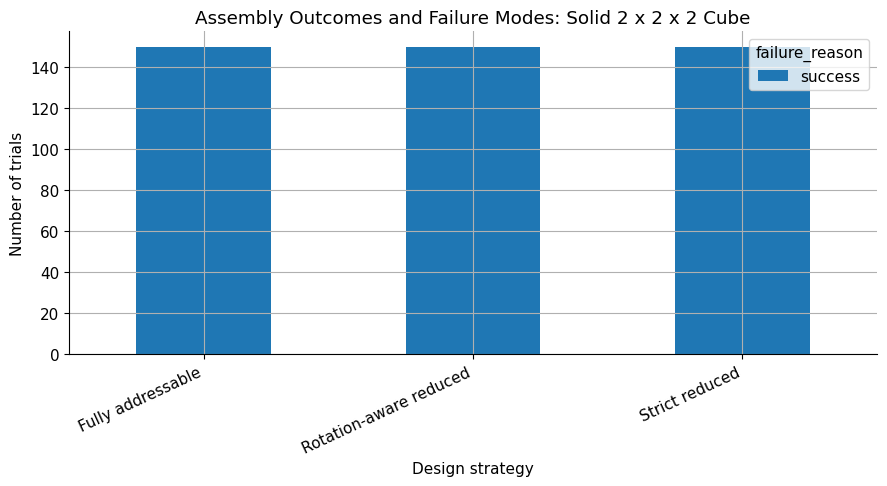

failure_reason,ambiguous_off_target_binding,success
strategy,,
Fully addressable,0.0,150.0
Rotation-aware reduced,150.0,0.0
Strict reduced,94.0,56.0


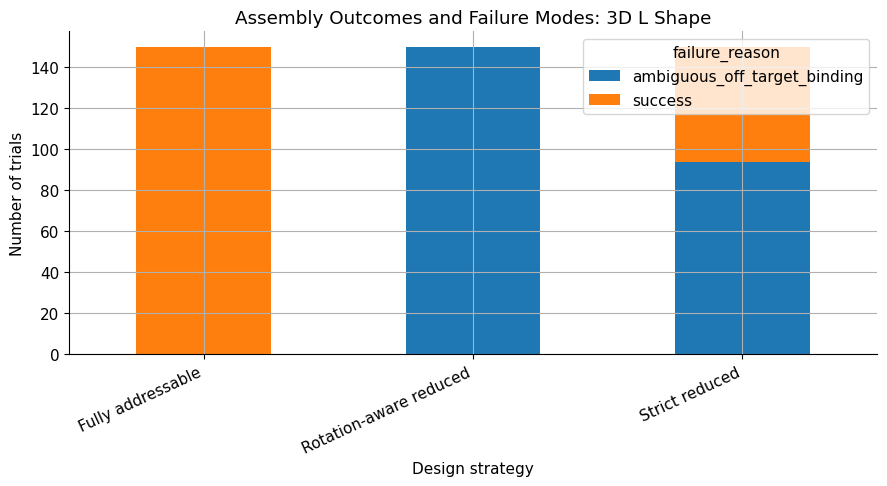

failure_reason,ambiguous_off_target_binding,success
strategy,,
Fully addressable,0.0,150.0
Rotation-aware reduced,150.0,0.0
Strict reduced,145.0,5.0


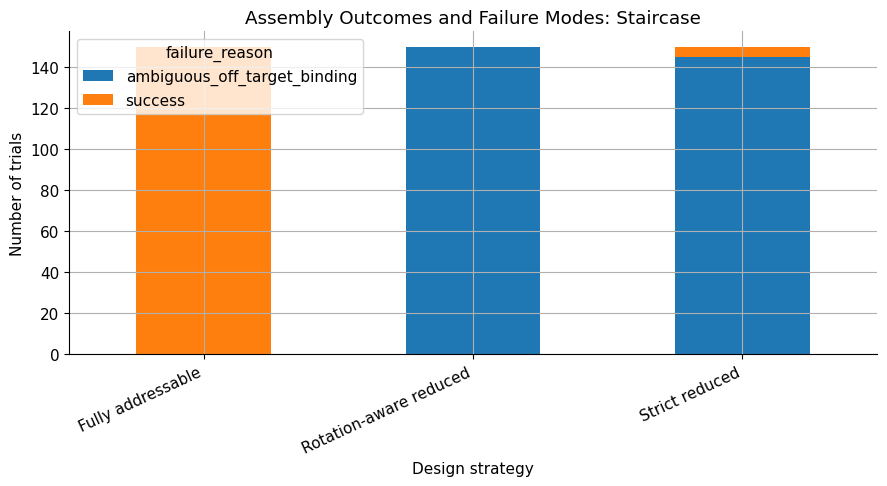

failure_reason,ambiguous_off_target_binding,success
strategy,,
Fully addressable,0.0,150.0
Rotation-aware reduced,150.0,0.0
Strict reduced,148.0,2.0


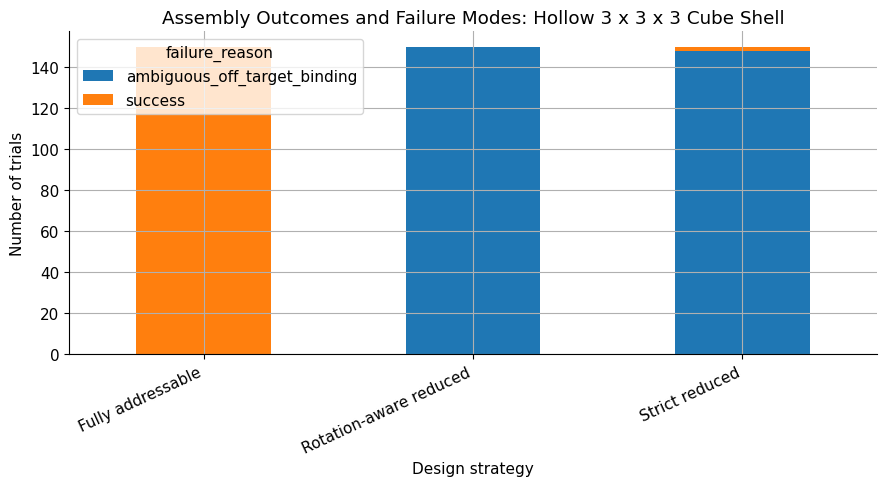

failure_reason,ambiguous_off_target_binding,success
strategy,,
Fully addressable,0.0,150.0
Rotation-aware reduced,150.0,0.0
Strict reduced,150.0,0.0


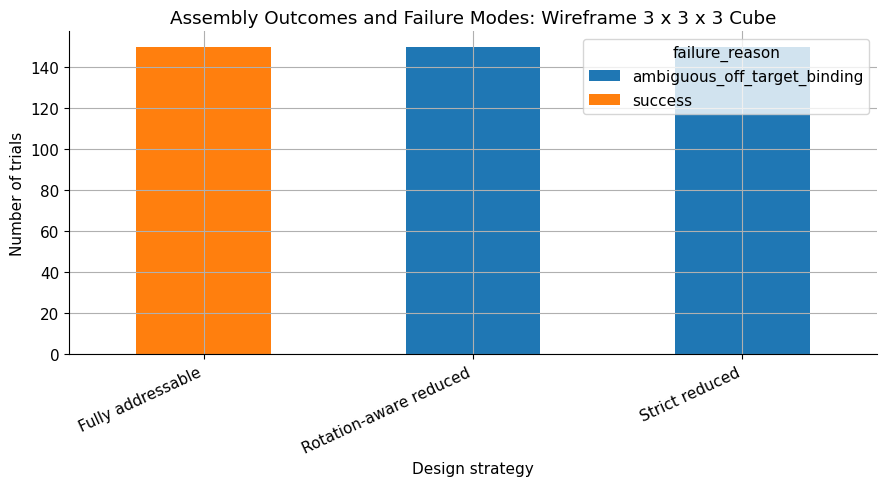

In [46]:
# ============================================================
# Step 8F: Summarize failure modes
# ============================================================

# What I am doing:
# I am counting why trials failed or succeeded.
#
# This helps distinguish between:
# - designs that fail because they stall,
# - designs that fail because of ambiguous off-target binding,
# - designs that successfully complete the target.

failure_mode_df = (
    assembly_trial_df
    .groupby(["target_shape", "strategy", "failure_reason"])
    .size()
    .reset_index(name="count")
)

display(failure_mode_df)

for shape_name in target_shapes.keys():
    subset = failure_mode_df[
        failure_mode_df["target_shape"] == shape_name
    ].copy()

    pivot = subset.pivot(
        index="strategy",
        columns="failure_reason",
        values="count"
    ).fillna(0)

    display(pivot)

    pivot.plot(
        kind="bar",
        stacked=True,
        figsize=(9, 5)
    )

    plt.title(f"Assembly Outcomes and Failure Modes: {shape_name}")
    plt.xlabel("Design strategy")
    plt.ylabel("Number of trials")
    plt.xticks(rotation=25, ha="right")
    plt.tight_layout()
    plt.show()

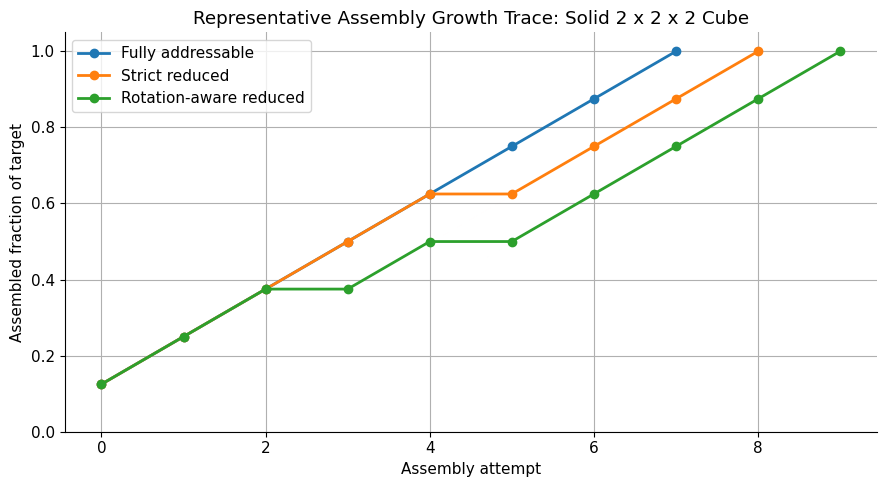

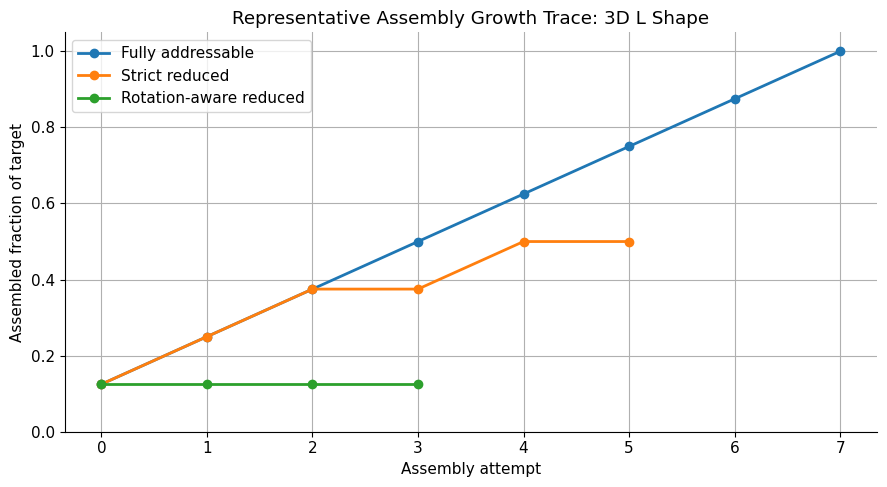

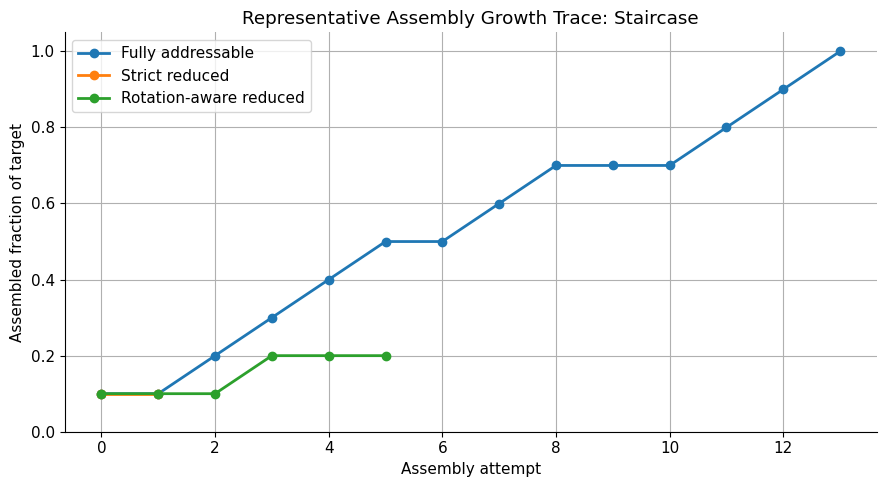

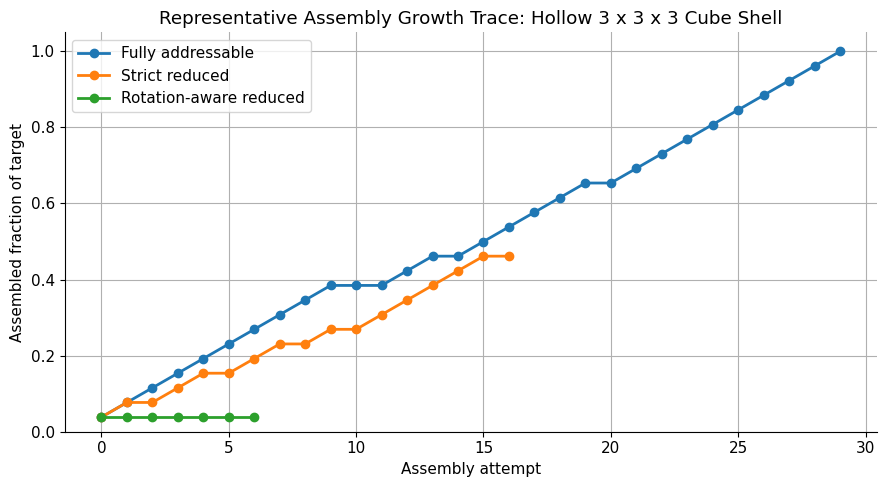

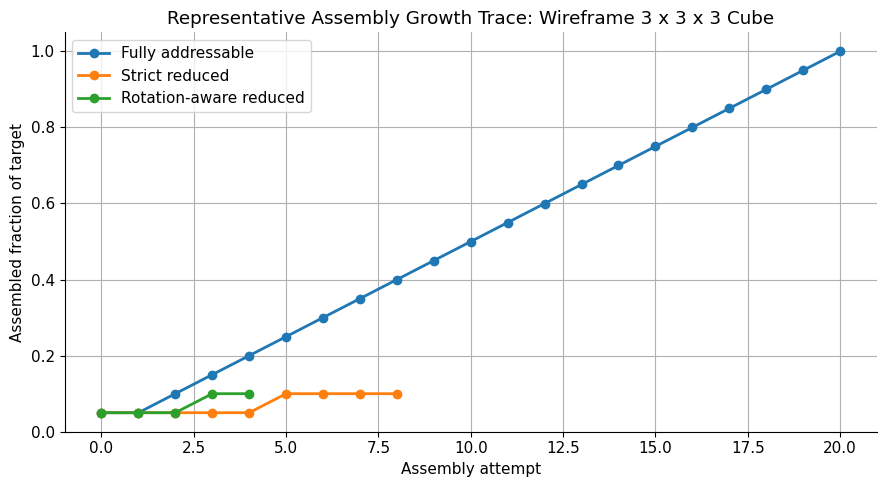

In [47]:
# ============================================================
# Step 8G: Plot representative assembly growth traces
# ============================================================

# What I am doing:
# I am visualizing how the assembled fraction grows over time in a representative
# trial for each strategy.
#
# This makes the stochastic assembly process easier to understand visually.

for shape_name in target_shapes.keys():

    plt.figure(figsize=(9, 5))

    for strategy_name in ["Fully addressable", "Strict reduced", "Rotation-aware reduced"]:
        trace = assembly_trace_records.get((shape_name, strategy_name), [])

        if len(trace) == 0:
            continue

        trace_df = pd.DataFrame(trace)

        plt.plot(
            trace_df["attempt"],
            trace_df["assembled_fraction"],
            marker="o",
            linewidth=2,
            label=strategy_name
        )

    plt.title(f"Representative Assembly Growth Trace: {shape_name}")
    plt.xlabel("Assembly attempt")
    plt.ylabel("Assembled fraction of target")
    plt.ylim(0, 1.05)
    plt.legend()
    plt.tight_layout()
    plt.show()

In [48]:
# ============================================================
# Step 9: Visual assembly snapshots from stochastic growth
# ============================================================

# What I am doing:
# In Step 8, I measured stochastic assembly success rates using repeated trials.
# In this step, I am creating visual examples of how assembly progresses.
#
# Instead of only showing a final success rate, I want to show:
# 1. The seed state
# 2. An early partial assembly
# 3. A middle-stage assembly
# 4. The final assembled or failed state
#
# This makes the notebook more interpretable because the reader can see how
# the target shape grows over time.
#
# This is still a simplified target-guided assembly model, but it helps bridge
# the gap between abstract design rules and actual assembly behavior.

def simulate_assembly_with_snapshots(
    design,
    max_attempts_multiplier=12,
    base_attachment_probability=0.92,
    ambiguity_failure_strength=0.35
):
    """
    Run one stochastic assembly trial while storing the assembled voxel set
    after each attempt.

    This is similar to Step 8, but it records actual 3D assembly states for
    visualization.
    """
    coords = list(design["coords"])
    target_size = len(coords)
    bond_rules = design["bond_rules"]
    compatibility_map = get_design_compatibility_map(design)

    max_attempts = max(25, max_attempts_multiplier * target_size)

    seed = random.choice(coords)
    assembled = {seed}

    snapshots = [
        {
            "attempt": 0,
            "assembled_set": set(assembled),
            "assembled_count": len(assembled),
            "assembled_fraction": len(assembled) / target_size,
            "event": "seed"
        }
    ]

    failure_reason = None

    for attempt in range(1, max_attempts + 1):

        frontier_bonds = []

        for bond in bond_rules:
            a = bond["voxel_a"]
            b = bond["voxel_b"]

            if a in assembled and b not in assembled:
                frontier_bonds.append((bond, b))
            elif b in assembled and a not in assembled:
                frontier_bonds.append((bond, a))

        if len(frontier_bonds) == 0:
            if len(assembled) == target_size:
                failure_reason = None
            else:
                failure_reason = "stalled_no_frontier_bonds"
            break

        selected_bond, candidate_voxel = random.choice(frontier_bonds)

        color_a = selected_bond.get("color_on_species_a", None)
        color_b = selected_bond.get("color_on_species_b", None)

        specificity_score = get_bond_specificity_score(
            color_a=color_a,
            color_b=color_b,
            compatibility_map=compatibility_map
        )

        attachment_probability = base_attachment_probability * specificity_score
        ambiguity_risk = ambiguity_failure_strength * (1 - specificity_score)

        if specificity_score <= 0:
            failure_reason = "missing_or_invalid_patch_rule"
            event = "invalid_patch_rule"
        elif random.random() < ambiguity_risk:
            failure_reason = "ambiguous_off_target_binding"
            event = "ambiguous_wrong_partner"
        elif random.random() < attachment_probability:
            assembled.add(candidate_voxel)
            event = "attached"
        else:
            event = "failed_attempt"

        snapshots.append({
            "attempt": attempt,
            "assembled_set": set(assembled),
            "assembled_count": len(assembled),
            "assembled_fraction": len(assembled) / target_size,
            "event": event
        })

        if failure_reason is not None:
            break

        if len(assembled) == target_size:
            failure_reason = None
            break

    success = len(assembled) == target_size and failure_reason is None

    if not success and failure_reason is None:
        failure_reason = "maximum_attempts_reached"

    return {
        "success": success,
        "attempts": attempt,
        "assembled_voxels": len(assembled),
        "target_voxels": target_size,
        "assembled_fraction": len(assembled) / target_size,
        "failure_reason": "success" if success else failure_reason,
        "snapshots": snapshots,
        "final_assembled_set": set(assembled)
    }

In [49]:
# ============================================================
# Step 9A: Select representative assembly examples
# ============================================================

# What I am doing:
# I am selecting one representative assembly run for each target shape and
# design strategy.
#
# Preference:
# 1. Use a successful trial if one can be found.
# 2. If no successful trial is found, use the failed trial that assembled the
#    largest fraction of the target.
#
# This gives fair visual examples for both successful and difficult designs.

def find_representative_assembly_example(design, attempts_to_find_success=40):
    """
    Find a representative visual example for one design.
    """
    best_result = None

    for _ in range(attempts_to_find_success):
        result = simulate_assembly_with_snapshots(design)

        if best_result is None:
            best_result = result
        elif result["assembled_fraction"] > best_result["assembled_fraction"]:
            best_result = result

        if result["success"]:
            return result

    return best_result


representative_assembly_examples = {}

for strategy_name, design_dict in assembly_design_sets:
    for shape_name, design in design_dict.items():
        example = find_representative_assembly_example(design)
        representative_assembly_examples[(shape_name, strategy_name)] = example

representative_rows = []

for (shape_name, strategy_name), example in representative_assembly_examples.items():
    representative_rows.append({
        "target_shape": shape_name,
        "strategy": strategy_name,
        "success": example["success"],
        "attempts": example["attempts"],
        "assembled_voxels": example["assembled_voxels"],
        "target_voxels": example["target_voxels"],
        "assembled_fraction": round(example["assembled_fraction"], 3),
        "failure_reason": example["failure_reason"]
    })

representative_examples_df = pd.DataFrame(representative_rows)

display(representative_examples_df)

,target_shape,strategy,success,attempts,assembled_voxels,target_voxels,assembled_fraction,failure_reason
0,Solid 2 x 2 x 2 Cube,Fully addressable,True,7,8,8,1.000,success
1,3D L Shape,Fully addressable,True,7,8,8,1.000,success
2,Staircase,Fully addressable,True,9,10,10,1.000,success
3,Hollow 3 x 3 x 3 Cube Shell,Fully addressable,True,27,26,26,1.000,success
4,Wireframe 3 x 3 x 3 Cube,Fully addressable,True,21,20,20,1.000,success
5,Solid 2 x 2 x 2 Cube,Strict reduced,True,8,8,8,1.000,success
6,3D L Shape,Strict reduced,True,11,8,8,1.000,success
7,Staircase,Strict reduced,True,17,10,10,1.000,success
8,Hollow 3 x 3 x 3 Cube Shell,Strict reduced,True,41,26,26,1.000,success
9,Wireframe 3 x 3 x 3 Cube,Strict reduced,False,16,7,20,0.350,ambiguous_off_target_binding


In [52]:
# ============================================================
# Step 9B: Plot 3D assembly snapshots
# ============================================================

# What I am doing:
# I am plotting representative assembly snapshots in 3D.
#
# Gray points show the full target structure.
# Blue points show the portion that has assembled so far.
# Light gray lines show all target bonds.
# Blue lines show bonds between already assembled voxels.
#
# This visual makes the assembly process easier to understand.

def choose_snapshot_stages(snapshots, target_fractions=(0.0, 0.33, 0.66, 1.0)):
    """
    Choose snapshots closest to specified assembled fractions.
    """
    chosen = []

    for fraction in target_fractions:
        closest_snapshot = min(
            snapshots,
            key=lambda s: abs(s["assembled_fraction"] - fraction)
        )
        chosen.append(closest_snapshot)

    # Remove duplicate snapshots while preserving order
    unique_chosen = []
    seen_attempts = set()

    for snapshot in chosen:
        if snapshot["attempt"] not in seen_attempts:
            unique_chosen.append(snapshot)
            seen_attempts.add(snapshot["attempt"])

    return unique_chosen


def plot_single_snapshot(ax, coords, bonds, assembled_set, title):
    """
    Plot one assembly snapshot.
    """
    xs = [c[0] for c in coords]
    ys = [c[1] for c in coords]
    zs = [c[2] for c in coords]

    # Full target bonds in background
    for bond in bonds:
        a = bond["voxel_a"]
        b = bond["voxel_b"]

        ax.plot(
            [a[0], b[0]],
            [a[1], b[1]],
            [a[2], b[2]],
            color="lightgray",
            linewidth=1.3,
            alpha=0.65
        )

    # Full target points in background
    ax.scatter(
        xs,
        ys,
        zs,
        s=55,
        color="lightgray",
        alpha=0.35
    )

    # Assembled bonds
    for bond in bonds:
        a = bond["voxel_a"]
        b = bond["voxel_b"]

        if a in assembled_set and b in assembled_set:
            ax.plot(
                [a[0], b[0]],
                [a[1], b[1]],
                [a[2], b[2]],
                color="steelblue",
                linewidth=2.4,
                alpha=0.95
            )

    # Assembled points
    assembled_list = sorted(list(assembled_set))

    if len(assembled_list) > 0:
        ax.scatter(
            [c[0] for c in assembled_list],
            [c[1] for c in assembled_list],
            [c[2] for c in assembled_list],
            s=120,
            color="steelblue",
            edgecolor="black",
            alpha=0.95
        )

    ax.set_title(title, fontsize=10)
    ax.set_xlabel("x")
    ax.set_ylabel("y")
    ax.set_zlabel("z")

    ax.set_box_aspect((
        max(1, max(xs) - min(xs) + 1),
        max(1, max(ys) - min(ys) + 1),
        max(1, max(zs) - min(zs) + 1)
    ))


def plot_assembly_snapshots(shape_name, strategy_name, example):
    """
    Plot multiple snapshots for a representative assembly run.
    """
    coords = shape_adjacency_data[shape_name]["coords"]
    bonds = shape_adjacency_data[shape_name]["bonds"]

    selected_snapshots = choose_snapshot_stages(example["snapshots"])

    number_of_panels = len(selected_snapshots)

    fig = plt.figure(figsize=(5 * number_of_panels, 5))

    status = "SUCCESS" if example["success"] else f"FAILED: {example['failure_reason']}"

    fig.suptitle(
        f"Assembly Snapshots: {shape_name}\nStrategy: {strategy_name} | {status}",
        fontsize=14,
        y=1.02
    )

    for i, snapshot in enumerate(selected_snapshots):
        ax = fig.add_subplot(1, number_of_panels, i + 1, projection="3d")

        title = (
            f"Attempt {snapshot['attempt']}\n"
            f"{snapshot['assembled_count']}/{example['target_voxels']} voxels"
        )

        plot_single_snapshot(
            ax=ax,
            coords=coords,
            bonds=bonds,
            assembled_set=snapshot["assembled_set"],
            title=title
        )

    plt.tight_layout()
    plt.show()

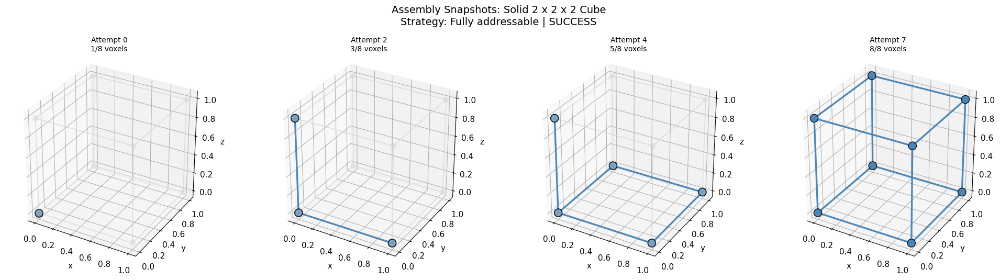

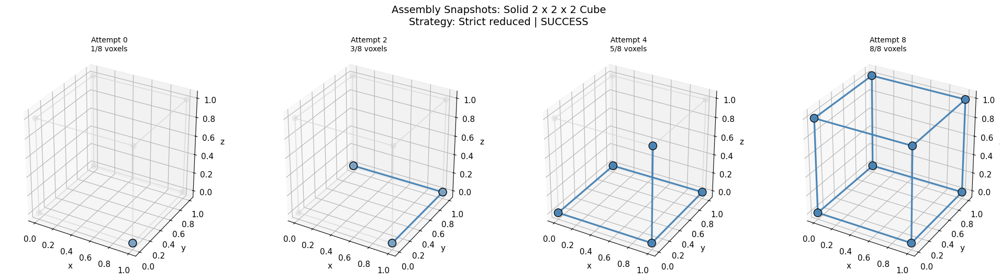

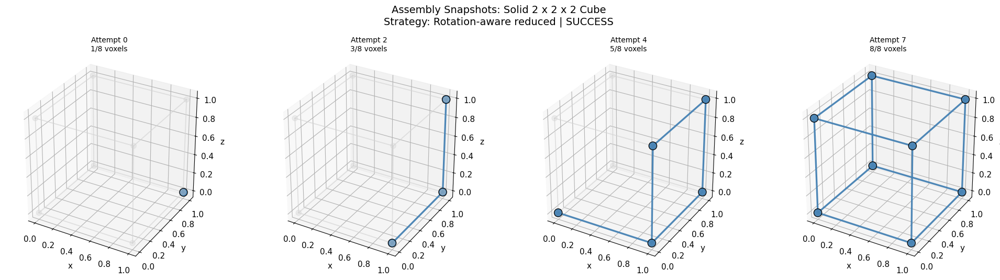

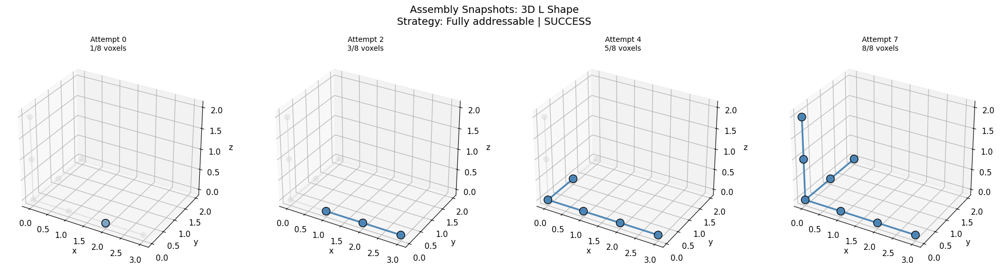

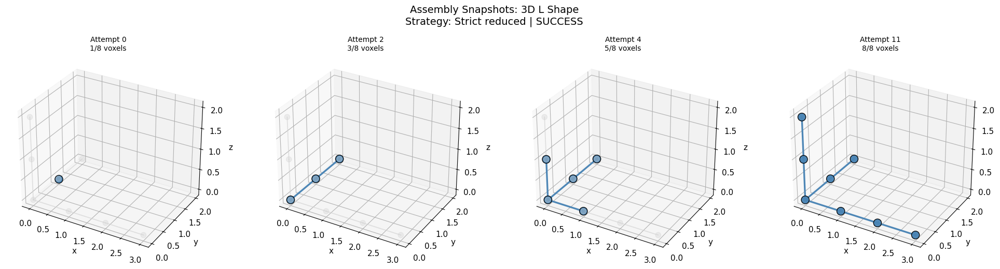

...

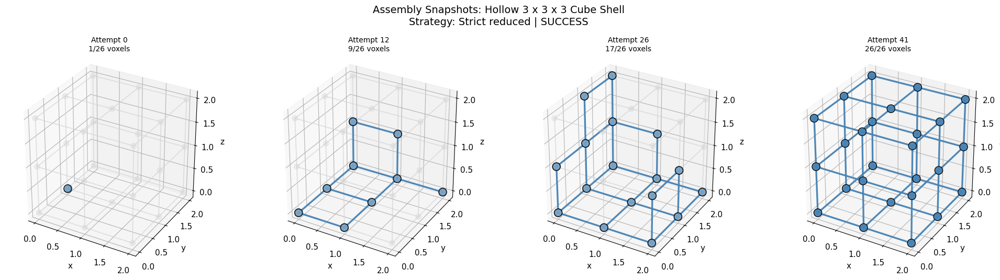

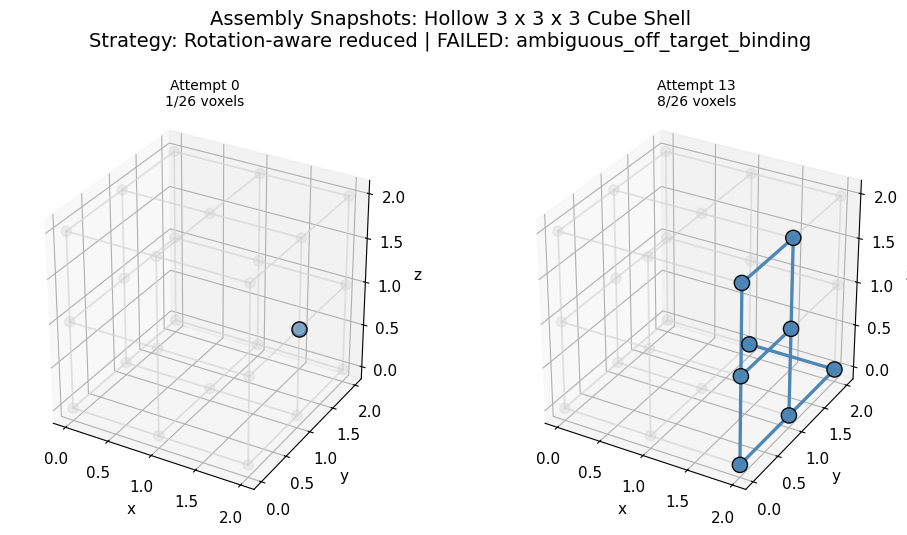

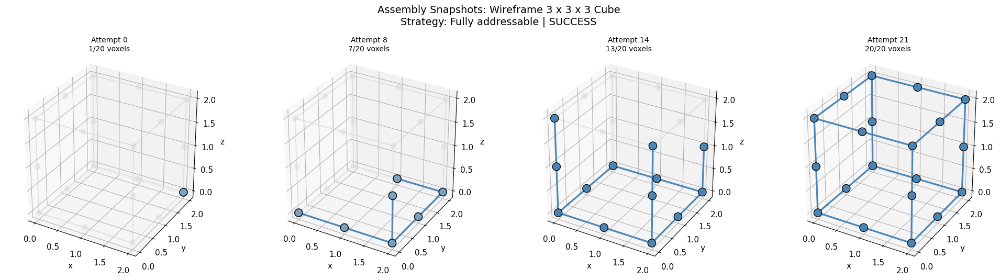

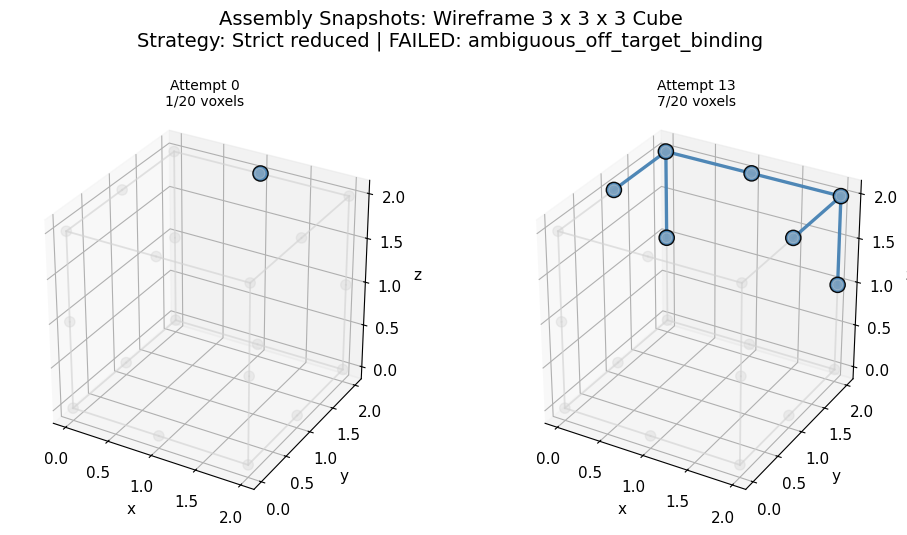

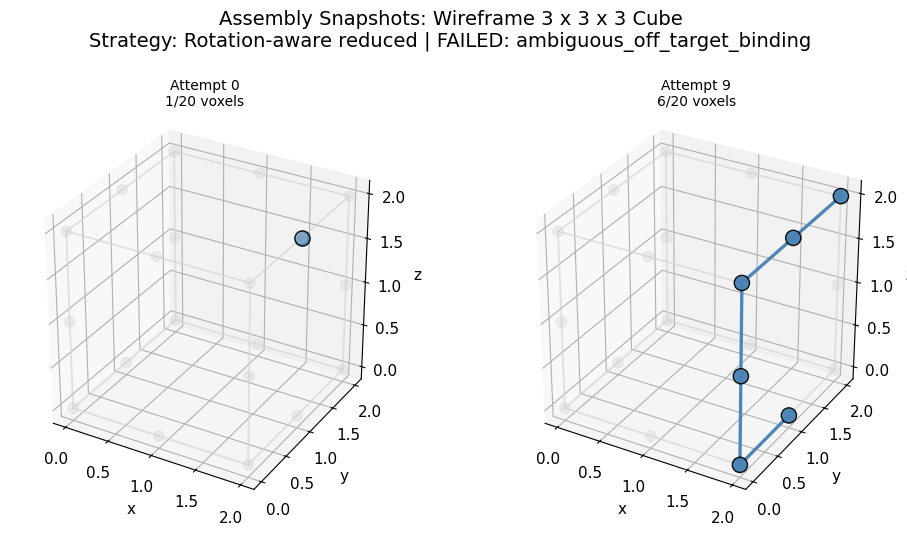

In [53]:
# ============================================================
# Step 9C: Show representative assembly snapshots for each strategy
# ============================================================

# What I am doing:
# I am generating assembly snapshot figures for every target shape and strategy.
#
# These figures are intentionally visual and presentation-friendly.
# They help show that the notebook is not only calculating metrics, but also
# representing the assembly process in an interpretable way.

for shape_name in target_shapes.keys():
    for strategy_name in ["Fully addressable", "Strict reduced", "Rotation-aware reduced"]:
        example = representative_assembly_examples[(shape_name, strategy_name)]

        plot_assembly_snapshots(
            shape_name=shape_name,
            strategy_name=strategy_name,
            example=example
        )

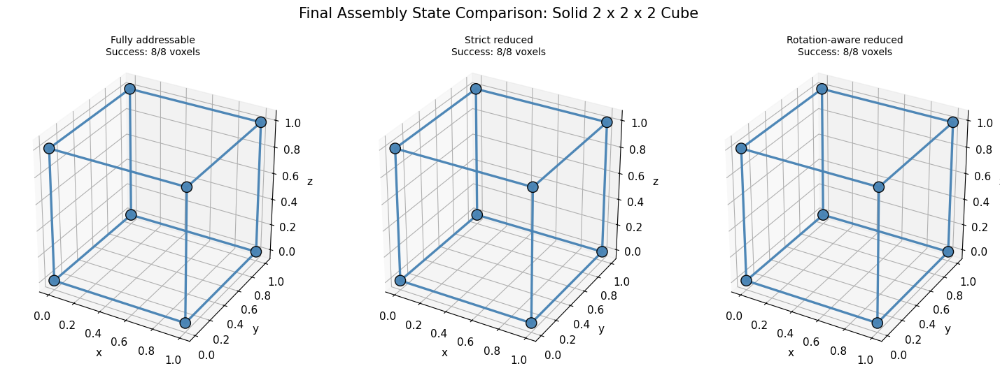

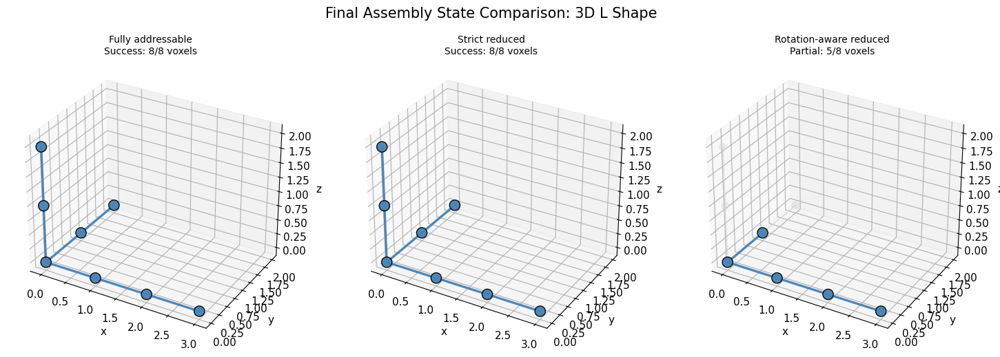

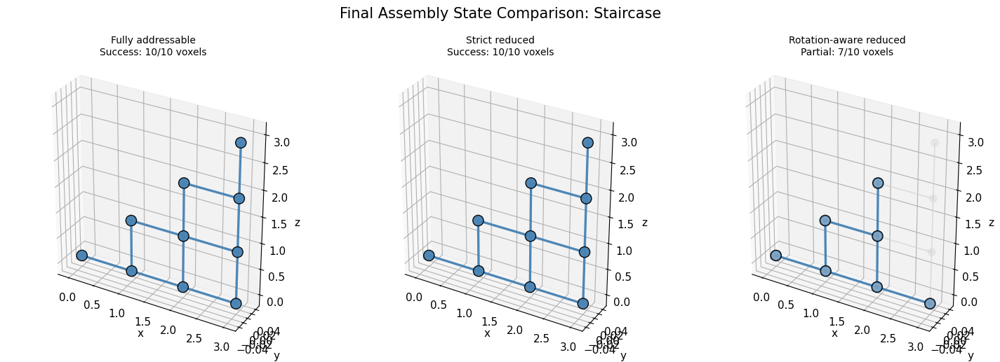

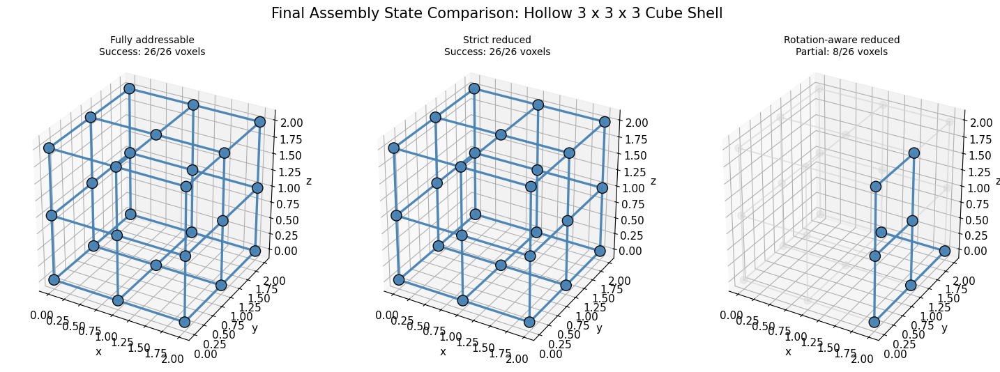

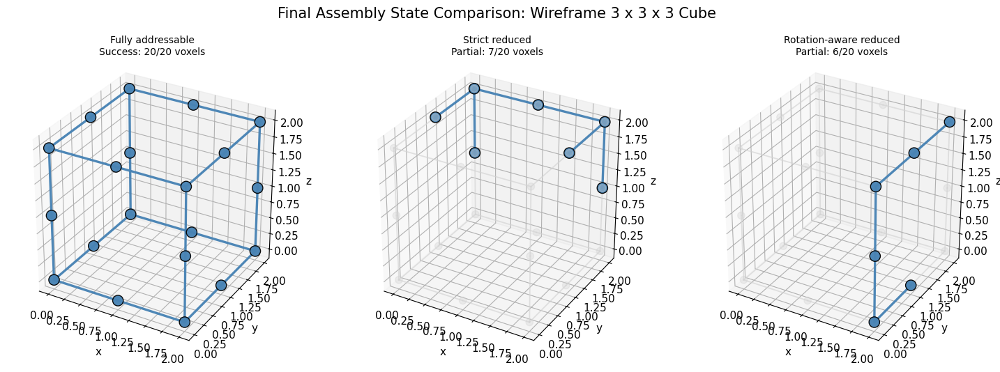

In [54]:
# ============================================================
# Step 9D: Create compact final-state comparison plots
# ============================================================

# What I am doing:
# I am creating one compact final-state comparison per target shape.
#
# Each row compares the final assembled state for:
# 1. Fully addressable design
# 2. Strict reduced design
# 3. Rotation-aware reduced design
#
# This makes it easier to compare strategies visually without scrolling through
# every growth snapshot.

def plot_final_state_strategy_comparison(shape_name):
    """
    Plot final assembled states for all strategies for one target shape.
    """
    coords = shape_adjacency_data[shape_name]["coords"]
    bonds = shape_adjacency_data[shape_name]["bonds"]

    strategies = ["Fully addressable", "Strict reduced", "Rotation-aware reduced"]

    fig = plt.figure(figsize=(15, 5))
    fig.suptitle(
        f"Final Assembly State Comparison: {shape_name}",
        fontsize=15,
        y=1.02
    )

    for i, strategy_name in enumerate(strategies):
        example = representative_assembly_examples[(shape_name, strategy_name)]
        assembled_set = example["final_assembled_set"]

        ax = fig.add_subplot(1, 3, i + 1, projection="3d")

        status = "Success" if example["success"] else "Partial"

        title = (
            f"{strategy_name}\n"
            f"{status}: {example['assembled_voxels']}/{example['target_voxels']} voxels"
        )

        plot_single_snapshot(
            ax=ax,
            coords=coords,
            bonds=bonds,
            assembled_set=assembled_set,
            title=title
        )

    plt.tight_layout()
    plt.show()


for shape_name in target_shapes.keys():
    plot_final_state_strategy_comparison(shape_name)

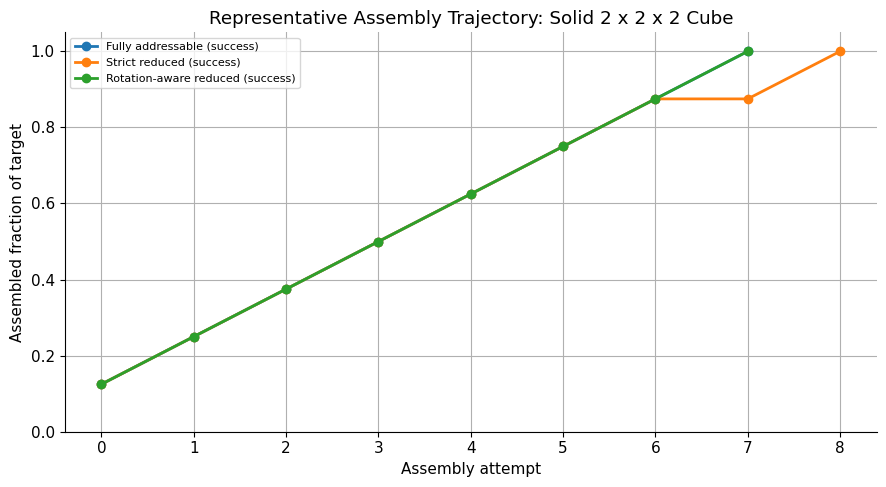

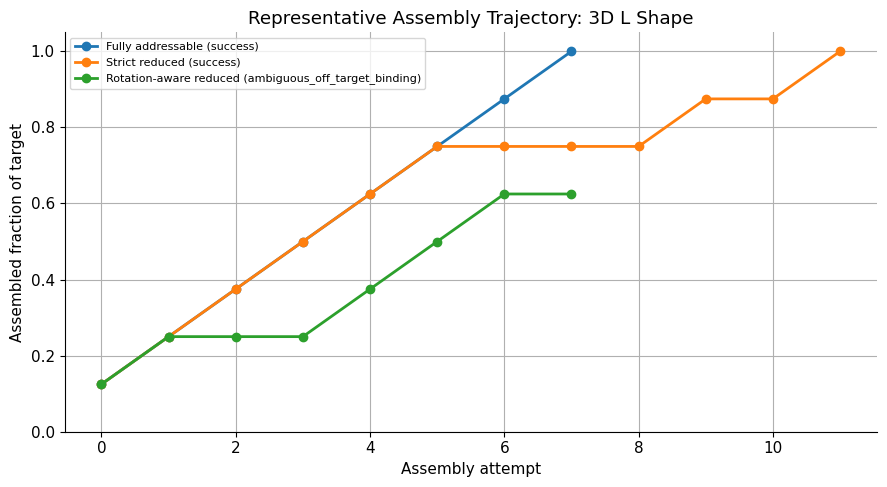

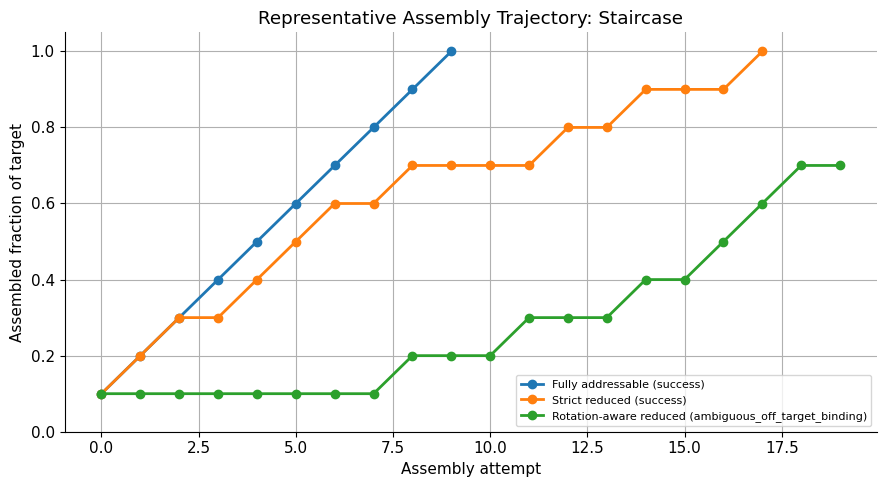

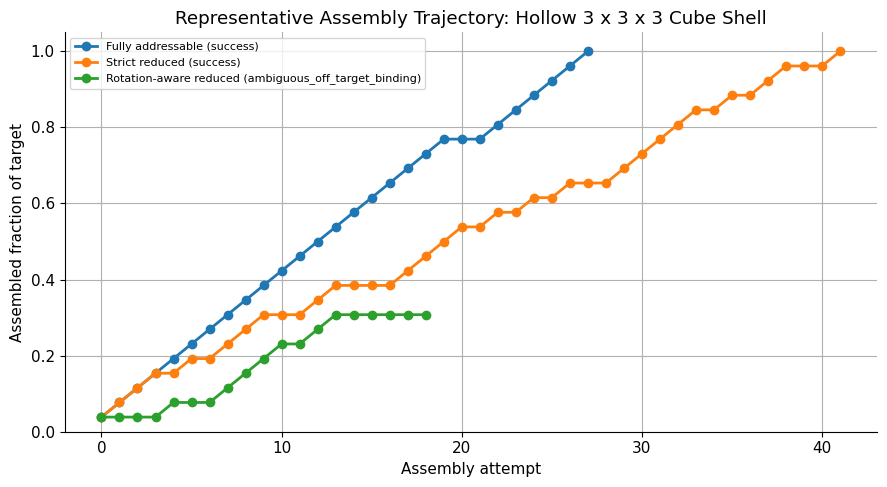

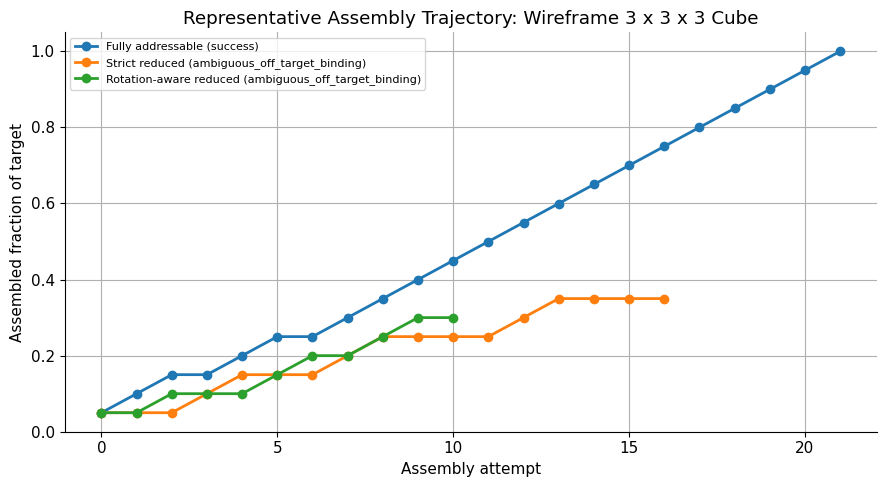

In [55]:
# ============================================================
# Step 9E: Plot assembly trace with event markers
# ============================================================

# What I am doing:
# I am plotting the assembled fraction over time for the representative examples.
#
# These plots complement the 3D snapshots by showing the assembly trajectory as
# a curve. The curve shows whether assembly happened smoothly, slowly, or failed
# early.

for shape_name in target_shapes.keys():

    plt.figure(figsize=(9, 5))

    for strategy_name in ["Fully addressable", "Strict reduced", "Rotation-aware reduced"]:
        example = representative_assembly_examples[(shape_name, strategy_name)]
        snapshot_df = pd.DataFrame(example["snapshots"])

        plt.plot(
            snapshot_df["attempt"],
            snapshot_df["assembled_fraction"],
            marker="o",
            linewidth=2,
            label=f"{strategy_name} ({example['failure_reason']})"
        )

    plt.title(f"Representative Assembly Trajectory: {shape_name}")
    plt.xlabel("Assembly attempt")
    plt.ylabel("Assembled fraction of target")
    plt.ylim(0, 1.05)
    plt.legend(fontsize=8)
    plt.tight_layout()
    plt.show()

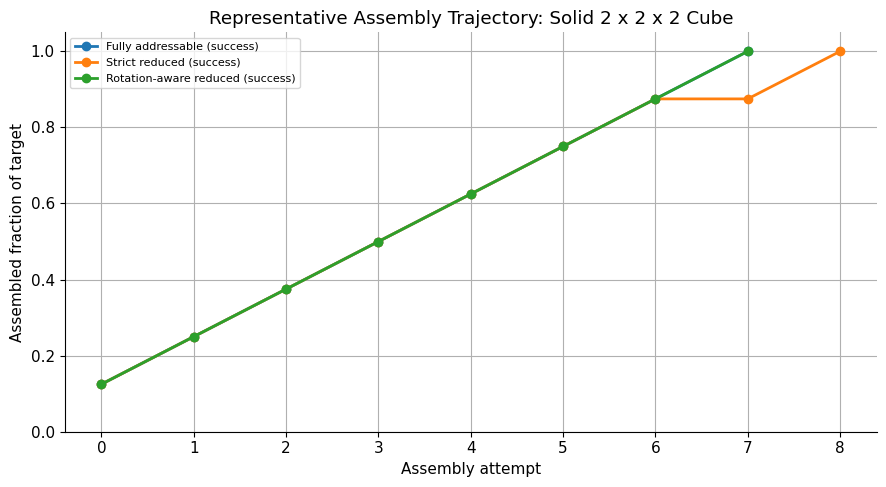

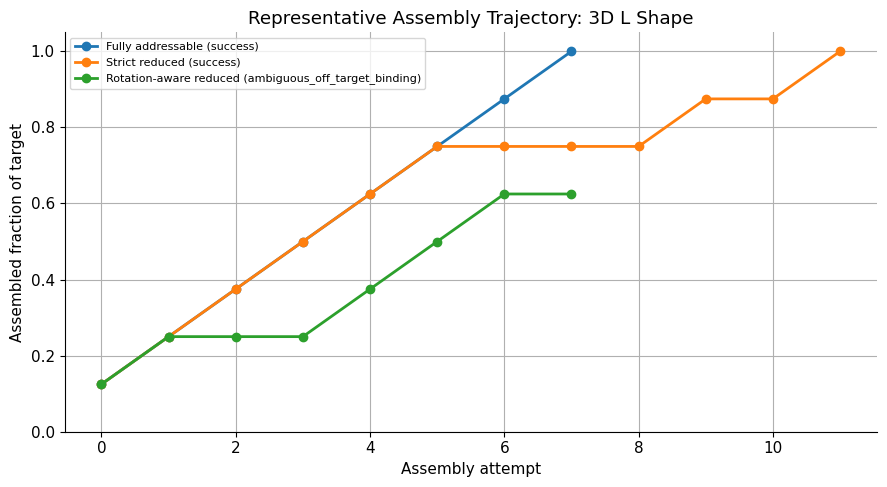

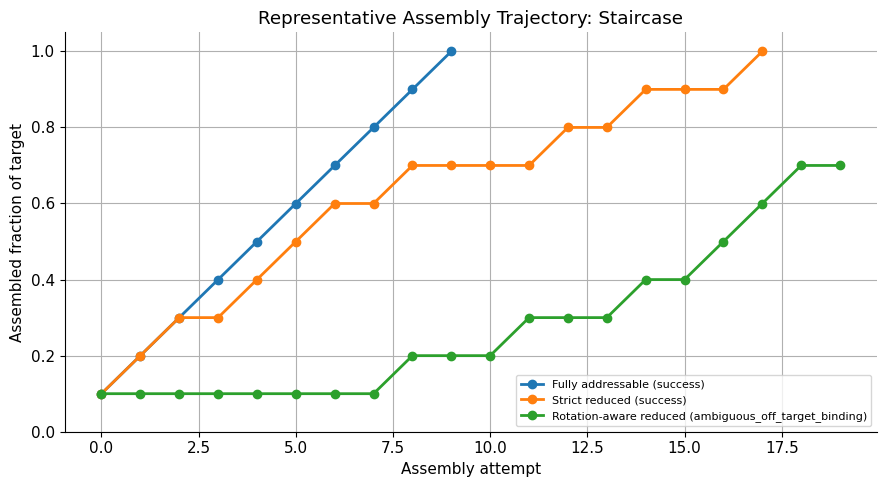

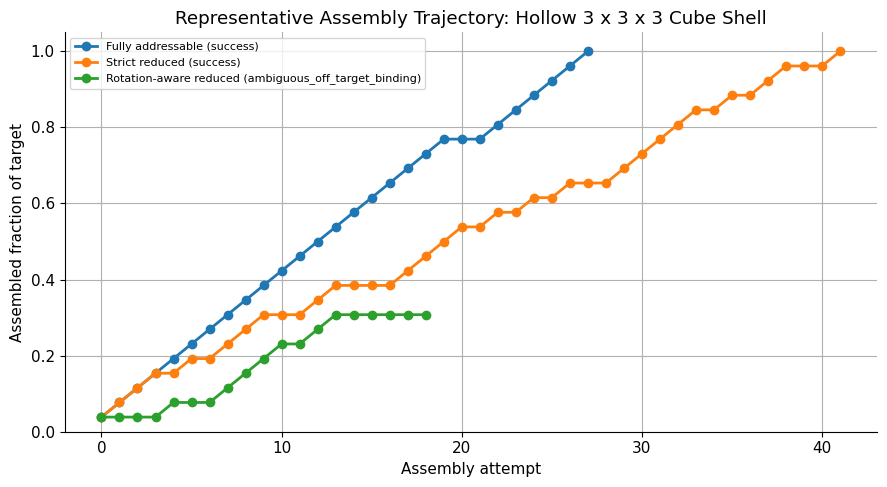

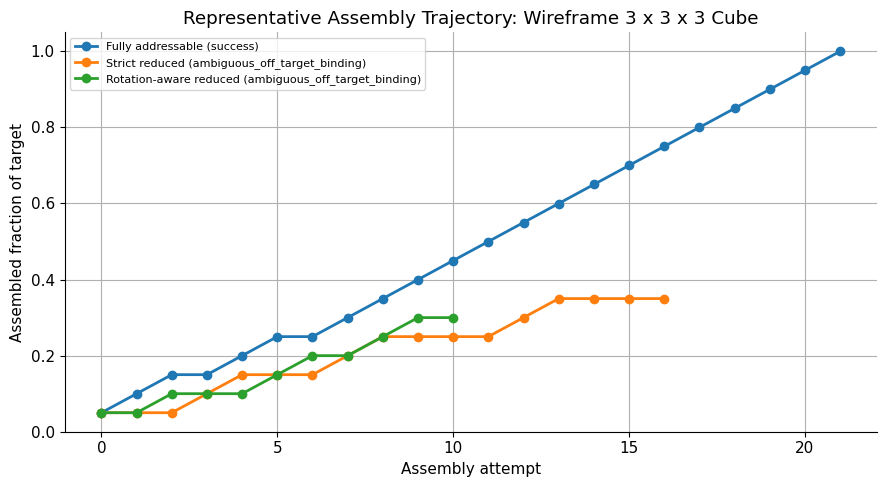

In [56]:
# ============================================================
# Step 9E: Plot assembly trace with event markers
# ============================================================

# What I am doing:
# I am plotting the assembled fraction over time for the representative examples.
#
# These plots complement the 3D snapshots by showing the assembly trajectory as
# a curve. The curve shows whether assembly happened smoothly, slowly, or failed
# early.

for shape_name in target_shapes.keys():

    plt.figure(figsize=(9, 5))

    for strategy_name in ["Fully addressable", "Strict reduced", "Rotation-aware reduced"]:
        example = representative_assembly_examples[(shape_name, strategy_name)]
        snapshot_df = pd.DataFrame(example["snapshots"])

        plt.plot(
            snapshot_df["attempt"],
            snapshot_df["assembled_fraction"],
            marker="o",
            linewidth=2,
            label=f"{strategy_name} ({example['failure_reason']})"
        )

    plt.title(f"Representative Assembly Trajectory: {shape_name}")
    plt.xlabel("Assembly attempt")
    plt.ylabel("Assembled fraction of target")
    plt.ylim(0, 1.05)
    plt.legend(fontsize=8)
    plt.tight_layout()
    plt.show()

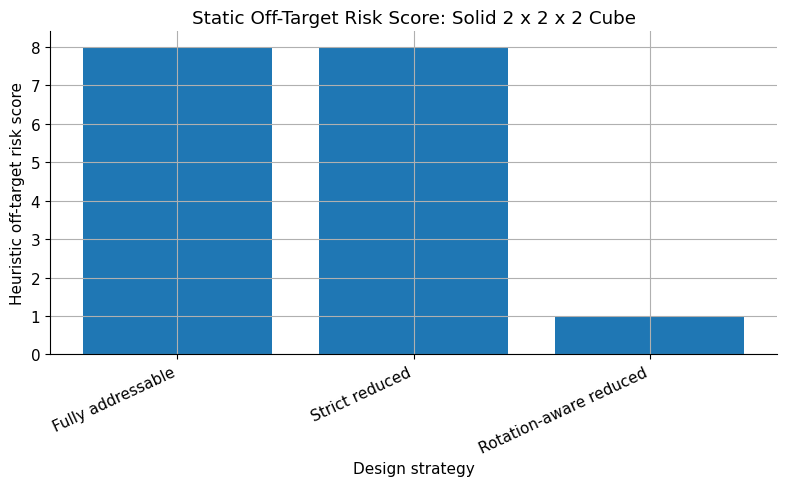

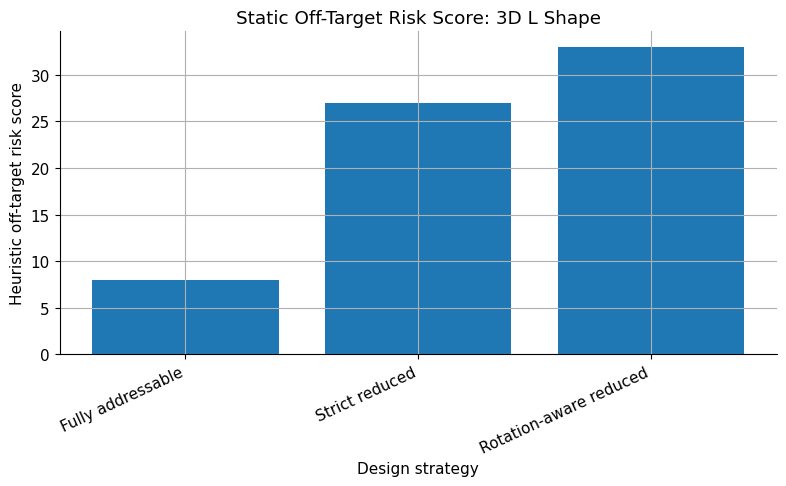

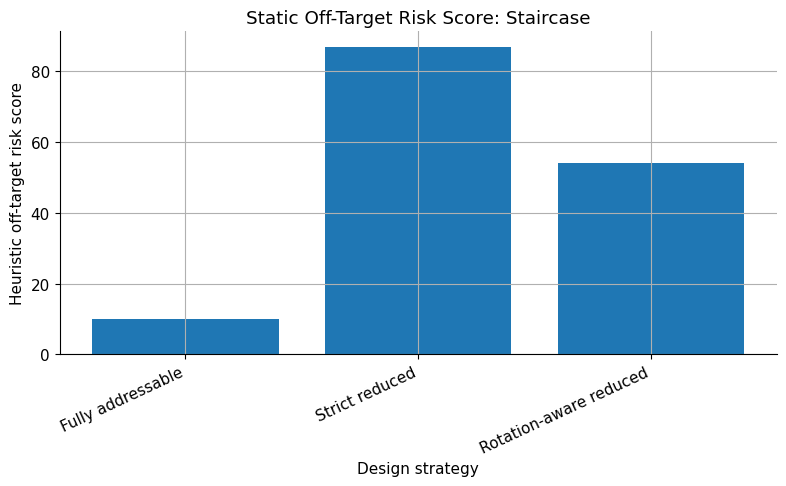

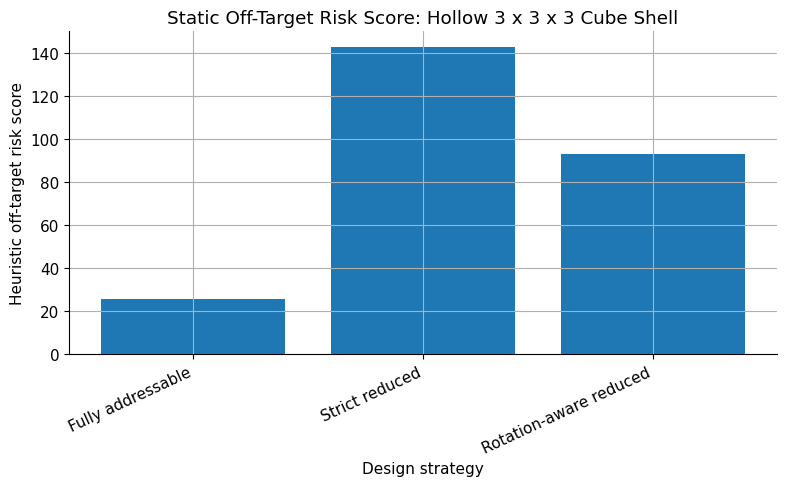

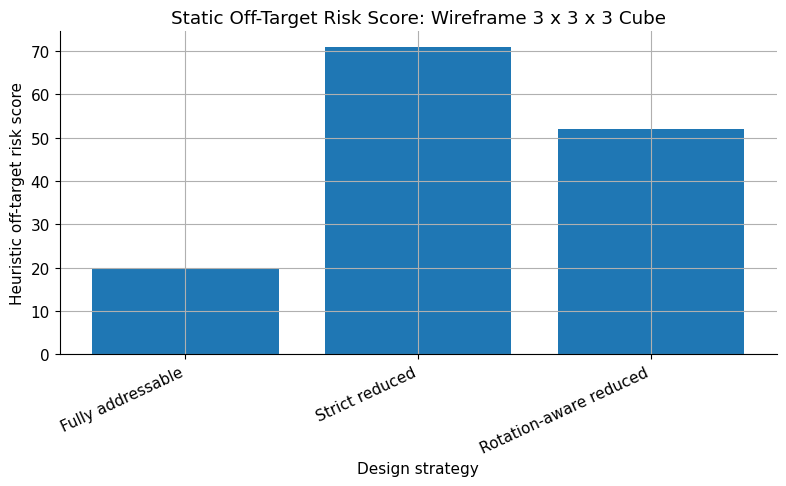

In [60]:
# ============================================================
# Step 10A: Visualize static off-target risk
# ============================================================

# What I am doing:
# I am plotting the static off-target risk score for each strategy and target.
#
# A higher score means the design has more possible warning signs such as:
# - patch ambiguity,
# - repeated reusable species,
# - extra compatible binding possibilities,
# - stronger species reuse pressure.

for shape_name in target_shapes.keys():
    subset = static_off_target_risk_df[
        static_off_target_risk_df["target_shape"] == shape_name
    ].copy()

    plt.figure(figsize=(8, 5))

    plt.bar(
        subset["strategy"],
        subset["static_off_target_risk_score"]
    )

    plt.title(f"Static Off-Target Risk Score: {shape_name}")
    plt.xlabel("Design strategy")
    plt.ylabel("Heuristic off-target risk score")
    plt.xticks(rotation=25, ha="right")
    plt.tight_layout()
    plt.show()

In [74]:
# ============================================================
# Step 10B: Helper functions for free-growth off-target simulation
# ============================================================

# What I am doing:
# I am creating a simplified free-growth simulation.
#
# Unlike the earlier target-guided assembly test, this simulation does not use
# the target bond list to decide where growth is allowed.
#
# Instead, it uses only the patch compatibility rules.
# This means the simulated cluster can grow into a correct target, stall early,
# or grow beyond the intended target size.
#
# This is a stronger stress test for reduced designs.

def normalize_coordinate_set(coords):
    """
    Normalize a set of coordinates by translating it so the minimum x, y, z
    coordinates are all zero.
    """
    coords_array = np.array(list(coords), dtype=int)

    if len(coords_array) == 0:
        return tuple()

    minimums = coords_array.min(axis=0)
    normalized = coords_array - minimums

    return tuple(sorted(tuple(row) for row in normalized))


def rotated_coordinate_set(coords, rotation_matrix):
    """
    Apply a cube rotation matrix to a coordinate set.
    """
    coords_array = np.array(list(coords), dtype=int)
    rotated = coords_array @ rotation_matrix.T

    return [tuple(row) for row in rotated]


def get_all_rotated_shape_keys(coords):
    """
    Create all normalized rotation-equivalent keys for a shape.
    """
    keys = set()

    for rotation in CUBE_ROTATIONS:
        rotated = rotated_coordinate_set(coords, rotation)
        keys.add(normalize_coordinate_set(rotated))

    return keys


target_shape_rotation_keys = {
    shape_name: get_all_rotated_shape_keys(coords)
    for shape_name, coords in target_shapes.items()
}


def shape_matches_target_under_rotation(candidate_coords, shape_name):
    """
    Check whether a candidate coordinate set matches a target shape under
    translation and cube rotation.
    """
    candidate_key = normalize_coordinate_set(candidate_coords)

    return candidate_key in target_shape_rotation_keys[shape_name]


def get_active_patch_entries(design):
    """
    Extracts all active patch entries from a design.
    Each entry is a dictionary: {"species": ..., "direction": ..., "color": ...}
    """
    active_entries = []
    for species, patch_rule in design["patch_rules"].items():
        for direction, color in patch_rule.items():
            if color is not None:
                active_entries.append({
                    "species": species,
                    "direction": direction,
                    "color": color
                })
    return active_entries


def get_possible_free_growth_moves(placed, used_patches, design, compatibility_map):
    """
    Find all possible free-growth moves from the current cluster.

    placed:
        Dictionary mapping coordinates to species.

    used_patches:
        Set of used patch identifiers: (coordinate, direction)

    Returns:
        List of possible moves.
    """
    active_patch_entries = get_active_patch_entries(design)
    species_to_entries = defaultdict(list)

    for entry in active_patch_entries:
        species_to_entries[entry["species"]].append(entry)

    possible_moves = []

    for coord, species_a in placed.items():
        for entry_a in species_to_entries[species_a]:

            direction_a = entry_a["direction"]
            color_a = entry_a["color"]

            if (coord, direction_a) in used_patches:
                continue

            neighbor_coord = add_coords(coord, DIRECTIONS[direction_a])
            required_direction_b = OPPOSITE_DIRECTIONS[direction_a]

            if neighbor_coord in placed:
                continue

            for entry_b in active_patch_entries:
                if entry_b["direction"] != required_direction_b:
                    continue

                color_b = entry_b["color"]

                if color_b not in compatibility_map.get(color_a, set()):
                    continue

                possible_moves.append({
                    "existing_coord": coord,
                    "existing_species": species_a,
                    "existing_direction": direction_a,
                    "new_coord": neighbor_coord,
                    "new_species": entry_b["species"],
                    "new_direction": required_direction_b,
                    "color_a": color_a,
                    "color_b": color_b
                })

    return possible_moves

In [62]:
# ============================================================
# Step 10C: Run one free-growth off-target trial
# ============================================================

# What I am doing:
# I am simulating free growth from one seed species.
#
# The simulation stops if:
# 1. No more compatible moves are available.
# 2. The cluster grows far beyond the target size.
# 3. The maximum number of growth steps is reached.
#
# This allows me to classify the result as:
# - self-limited target,
# - target reached but able to overgrow,
# - finite off-target structure,
# - overgrown/unbounded-like structure.

def simulate_free_growth_trial(
    design,
    shape_name,
    max_size_multiplier=2.2,
    max_steps_multiplier=8
):
    """
    Run one simplified free-growth off-target simulation.
    """
    target_size = len(design["coords"])
    max_cluster_size = max(target_size + 2, int(math.ceil(max_size_multiplier * target_size)))
    max_steps = max(25, max_steps_multiplier * target_size)

    compatibility_map = get_design_compatibility_map(design)
    species_list = list(design["patch_rules"].keys())

    seed_species = random.choice(species_list)

    placed = {
        (0, 0, 0): seed_species
    }

    used_patches = set()

    target_first_reached_step = None
    target_first_reached_size = None

    trace = [
        {
            "step": 0,
            "cluster_size": 1,
            "event": "seed",
            "matches_target": False
        }
    ]

    outcome = None

    for step in range(1, max_steps + 1):

        possible_moves = get_possible_free_growth_moves(
            placed=placed,
            used_patches=used_patches,
            design=design,
            compatibility_map=compatibility_map
        )

        if len(possible_moves) == 0:
            if len(placed) == target_size and shape_matches_target_under_rotation(placed.keys(), shape_name):
                outcome = "self_limited_target"
            elif target_first_reached_step is not None:
                outcome = "target_reached_then_stopped"
            else:
                outcome = "finite_off_target_stall"
            break

        selected_move = random.choice(possible_moves)

        placed[selected_move["new_coord"]] = selected_move["new_species"]

        used_patches.add((
            selected_move["existing_coord"],
            selected_move["existing_direction"]
        ))

        used_patches.add((
            selected_move["new_coord"],
            selected_move["new_direction"]
        ))

        matches_target_now = (
            len(placed) == target_size and
            shape_matches_target_under_rotation(placed.keys(), shape_name)
        )

        if matches_target_now and target_first_reached_step is None:
            target_first_reached_step = step
            target_first_reached_size = len(placed)

        trace.append({
            "step": step,
            "cluster_size": len(placed),
            "event": "attached",
            "matches_target": matches_target_now
        })

        if len(placed) > target_size and target_first_reached_step is not None:
            outcome = "target_can_overgrow"
            break

        if len(placed) > max_cluster_size:
            outcome = "overgrown_unbounded_like"
            break

    if outcome is None:
        if len(placed) == target_size and shape_matches_target_under_rotation(placed.keys(), shape_name):
            outcome = "self_limited_target"
        elif len(placed) > target_size:
            outcome = "overgrown_unbounded_like"
        else:
            outcome = "maximum_steps_reached"

    return {
        "outcome": outcome,
        "final_cluster_size": len(placed),
        "target_size": target_size,
        "size_ratio_to_target": len(placed) / target_size,
        "target_first_reached_step": target_first_reached_step,
        "target_first_reached_size": target_first_reached_size,
        "final_coords": set(placed.keys()),
        "final_species": placed,
        "trace": trace
    }

In [66]:
# ============================================================
# Step 10D: Run repeated free-growth stress tests
# ============================================================

# What I am doing:
# I am running repeated free-growth simulations for each target and strategy.
#
# This provides an estimated off-target behavior profile for each design.

N_FREE_GROWTH_TRIALS = 100

free_growth_trial_rows = []
free_growth_summary_rows = []
representative_free_growth_examples = {}

for strategy_name, design_dict in assembly_design_sets:
    for shape_name, design in design_dict.items():

        trial_results = []

        for trial_id in range(N_FREE_GROWTH_TRIALS):
            result = simulate_free_growth_trial(
                design=design,
                shape_name=shape_name
            )

            trial_results.append(result)

            free_growth_trial_rows.append({
                "target_shape": shape_name,
                "strategy": strategy_name,
                "trial_id": trial_id,
                "outcome": result["outcome"],
                "final_cluster_size": result["final_cluster_size"],
                "target_size": result["target_size"],
                "size_ratio_to_target": result["size_ratio_to_target"],
                "target_first_reached_step": result["target_first_reached_step"]
            })

        outcome_counts = Counter(result["outcome"] for result in trial_results)

        self_limited_rate = outcome_counts.get("self_limited_target", 0) / N_FREE_GROWTH_TRIALS
        overgrowth_rate = (
            outcome_counts.get("target_can_overgrow", 0)
            + outcome_counts.get("overgrown_unbounded_like", 0)
        ) / N_FREE_GROWTH_TRIALS

        finite_off_target_rate = outcome_counts.get("finite_off_target_stall", 0) / N_FREE_GROWTH_TRIALS

        final_sizes = [result["final_cluster_size"] for result in trial_results]

        free_growth_summary_rows.append({
            "target_shape": shape_name,
            "strategy": strategy_name,
            "number_of_trials": N_FREE_GROWTH_TRIALS,
            "self_limited_target_rate_percent": round(100 * self_limited_rate, 2),
            "overgrowth_rate_percent": round(100 * overgrowth_rate, 2),
            "finite_off_target_rate_percent": round(100 * finite_off_target_rate, 2),
            "mean_final_cluster_size": round(np.mean(final_sizes), 2),
            "max_final_cluster_size": max(final_sizes),
            "most_common_outcome": outcome_counts.most_common(1)[0][0]
        })

        # Save one representative example:
        # Prefer overgrowth or finite off-target if it exists, otherwise use first trial.
        priority_order = [
            "target_can_overgrow",
            "overgrown_unbounded_like",
            "finite_off_target_stall",
            "self_limited_target"
        ]

        chosen_example = trial_results[0]

        for outcome_name in priority_order:
            matching = [result for result in trial_results if result["outcome"] == outcome_name]
            if len(matching) > 0:
                chosen_example = matching[0]
                break

        representative_free_growth_examples[(shape_name, strategy_name)] = chosen_example

free_growth_trial_df = pd.DataFrame(free_growth_trial_rows)
free_growth_summary_df = pd.DataFrame(free_growth_summary_rows)

display(free_growth_summary_df)

,target_shape,strategy,number_of_trials,self_limited_target_rate_percent,overgrowth_rate_percent,finite_off_target_rate_percent,mean_final_cluster_size,max_final_cluster_size,most_common_outcome
0,Solid 2 x 2 x 2 Cube,Fully addressable,100,100.0,0.0,0.0,8.00,8,self_limited_target
1,3D L Shape,Fully addressable,100,100.0,0.0,0.0,8.00,8,self_limited_target
2,Staircase,Fully addressable,100,100.0,0.0,0.0,10.00,10,self_limited_target
3,Hollow 3 x 3 x 3 Cube Shell,Fully addressable,100,100.0,0.0,0.0,26.00,26,self_limited_target
4,Wireframe 3 x 3 x 3 Cube,Fully addressable,100,100.0,0.0,0.0,20.00,20,self_limited_target
5,Solid 2 x 2 x 2 Cube,Strict reduced,100,100.0,0.0,0.0,8.00,8,self_limited_target
6,3D L Shape,Strict reduced,100,25.0,11.0,64.0,7.91,13,finite_off_target_stall
7,Staircase,Strict reduced,100,2.0,40.0,58.0,16.31,23,finite_off_target_stall
8,Hollow 3 x 3 x 3 Cube Shell,Strict reduced,100,2.0,98.0,0.0,56.74,59,overgrown_unbounded_like
9,Wireframe 3 x 3 x 3 Cube,Strict reduced,100,0.0,100.0,0.0,45.00,45,overgrown_unbounded_like


,target_shape,strategy,outcome,count
0,3D L Shape,Fully addressable,self_limited_target,100
1,3D L Shape,Rotation-aware reduced,finite_off_target_stall,38
2,3D L Shape,Rotation-aware reduced,overgrown_unbounded_like,62
3,3D L Shape,Strict reduced,finite_off_target_stall,64
4,3D L Shape,Strict reduced,self_limited_target,25
5,3D L Shape,Strict reduced,target_can_overgrow,11
6,Hollow 3 x 3 x 3 Cube Shell,Fully addressable,self_limited_target,100
7,Hollow 3 x 3 x 3 Cube Shell,Rotation-aware reduced,finite_off_target_stall,100
8,Hollow 3 x 3 x 3 Cube Shell,Strict reduced,overgrown_unbounded_like,93
9,Hollow 3 x 3 x 3 Cube Shell,Strict reduced,self_limited_target,2


outcome,finite_off_target_stall,self_limited_target
strategy,,
Fully addressable,0.0,100.0
Rotation-aware reduced,100.0,0.0
Strict reduced,0.0,100.0


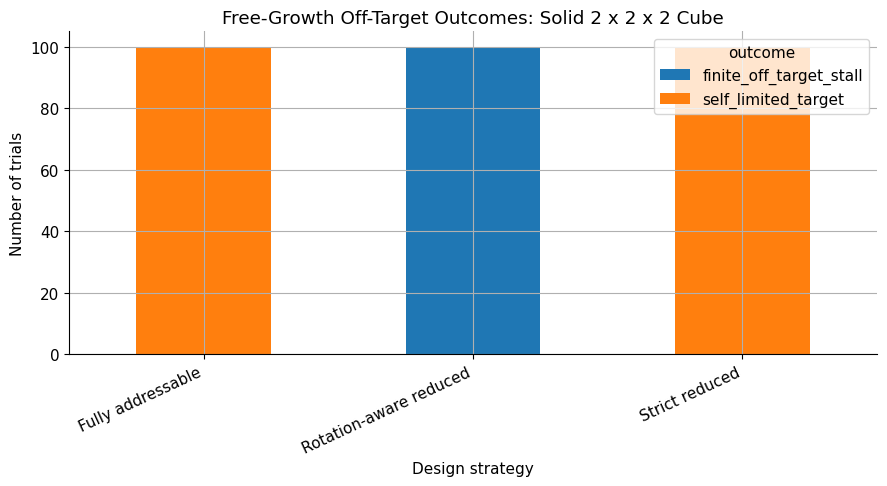

outcome,finite_off_target_stall,overgrown_unbounded_like,self_limited_target,target_can_overgrow
strategy,,,,
Fully addressable,0.0,0.0,100.0,0.0
Rotation-aware reduced,38.0,62.0,0.0,0.0
Strict reduced,64.0,0.0,25.0,11.0


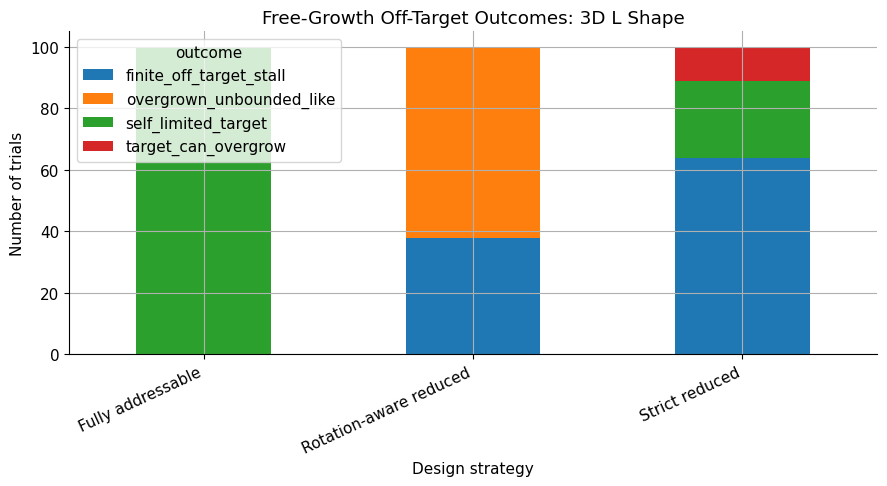

outcome,finite_off_target_stall,overgrown_unbounded_like,self_limited_target,target_can_overgrow
strategy,,,,
Fully addressable,0.0,0.0,100.0,0.0
Rotation-aware reduced,22.0,78.0,0.0,0.0
Strict reduced,58.0,34.0,2.0,6.0


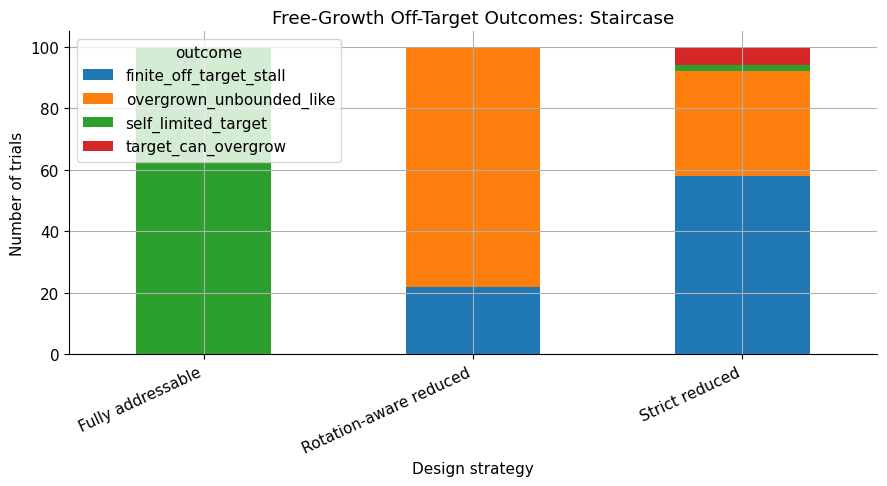

outcome,finite_off_target_stall,overgrown_unbounded_like,self_limited_target,target_can_overgrow
strategy,,,,
Fully addressable,0.0,0.0,100.0,0.0
Rotation-aware reduced,100.0,0.0,0.0,0.0
Strict reduced,0.0,93.0,2.0,5.0


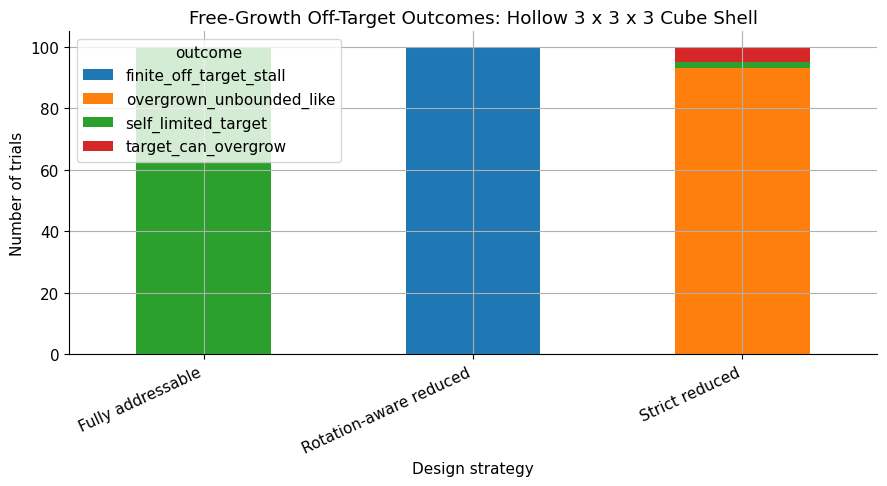

outcome,finite_off_target_stall,overgrown_unbounded_like,self_limited_target
strategy,,,
Fully addressable,0.0,0.0,100.0
Rotation-aware reduced,100.0,0.0,0.0
Strict reduced,0.0,100.0,0.0


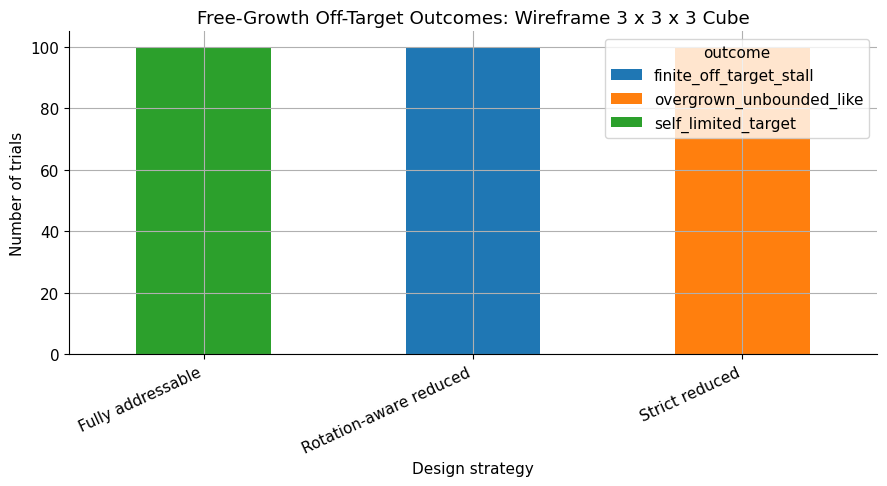

In [68]:
# ============================================================
# Step 10E: Visualize free-growth outcomes
# ============================================================

# What I am doing:
# I am visualizing the outcome distribution from the free-growth stress test.
#
# This shows whether each rule set tends to:
# - stop at the intended target,
# - stall as an incorrect finite structure,
# - or grow beyond the intended target size.

free_growth_outcome_df = (
    free_growth_trial_df
    .groupby(["target_shape", "strategy", "outcome"])
    .size()
    .reset_index(name="count")
)

display(free_growth_outcome_df)

for shape_name in target_shapes.keys():
    subset = free_growth_outcome_df[
        free_growth_outcome_df["target_shape"] == shape_name
    ].copy()

    pivot = subset.pivot(
        index="strategy",
        columns="outcome",
        values="count"
    ).fillna(0)

    display(pivot)

    pivot.plot(
        kind="bar",
        stacked=True,
        figsize=(9, 5)
    )

    plt.title(f"Free-Growth Off-Target Outcomes: {shape_name}")
    plt.xlabel("Design strategy")
    plt.ylabel("Number of trials")
    plt.xticks(rotation=25, ha="right")
    plt.tight_layout()
    plt.show()

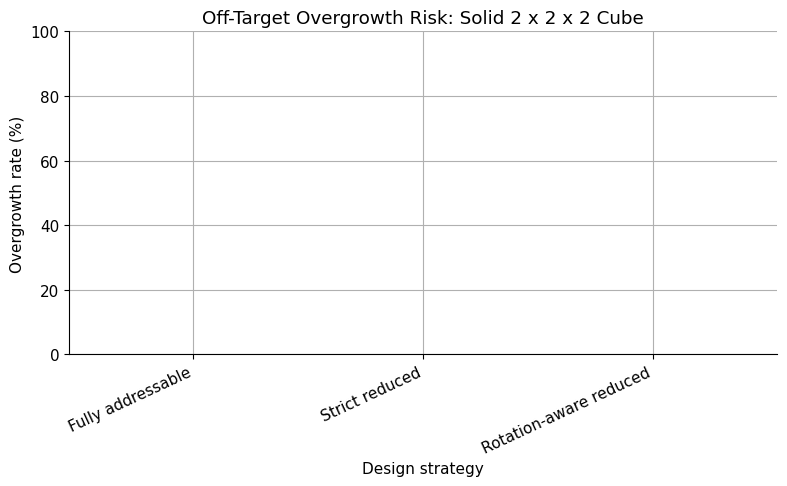

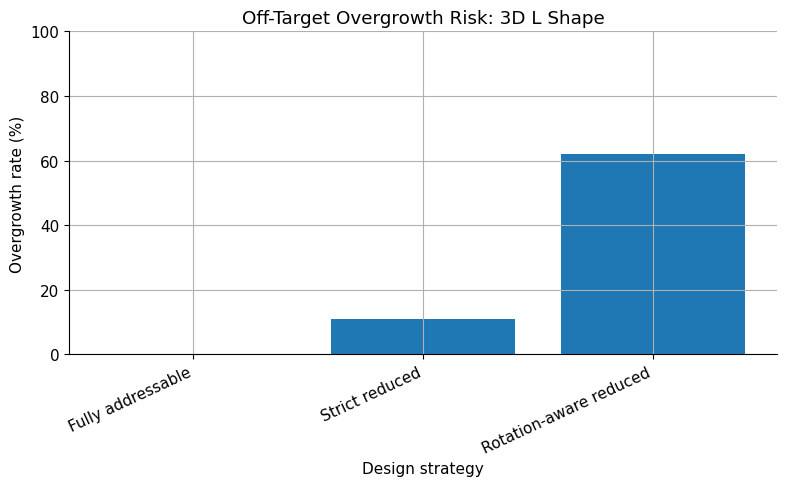

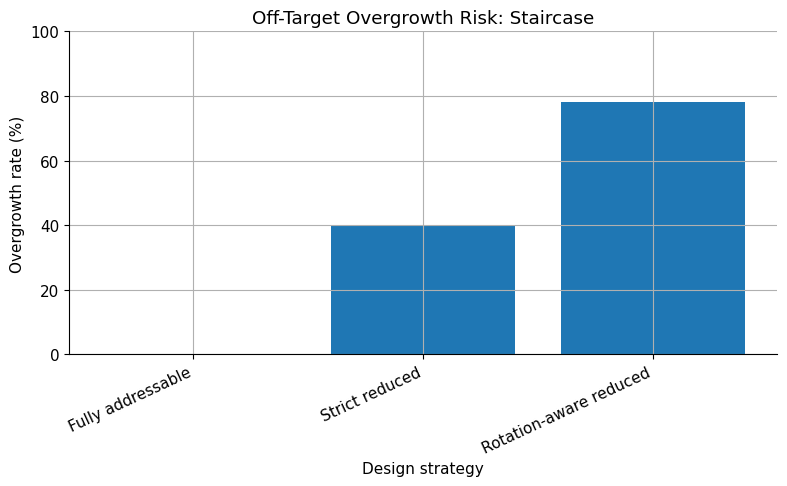

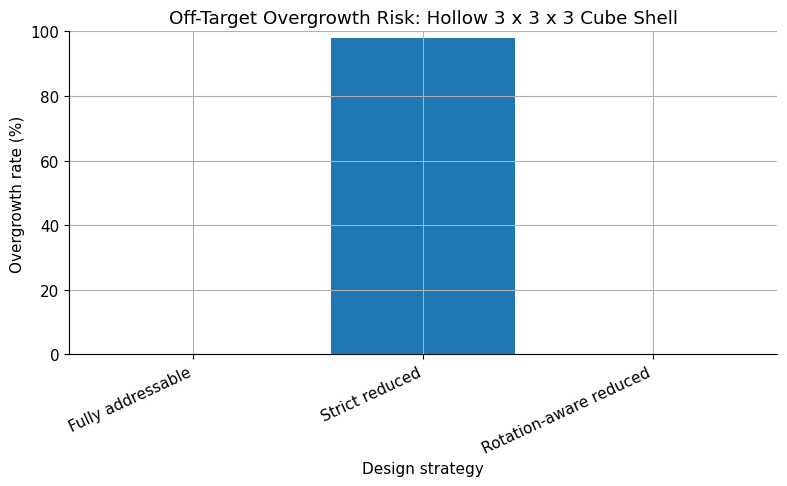

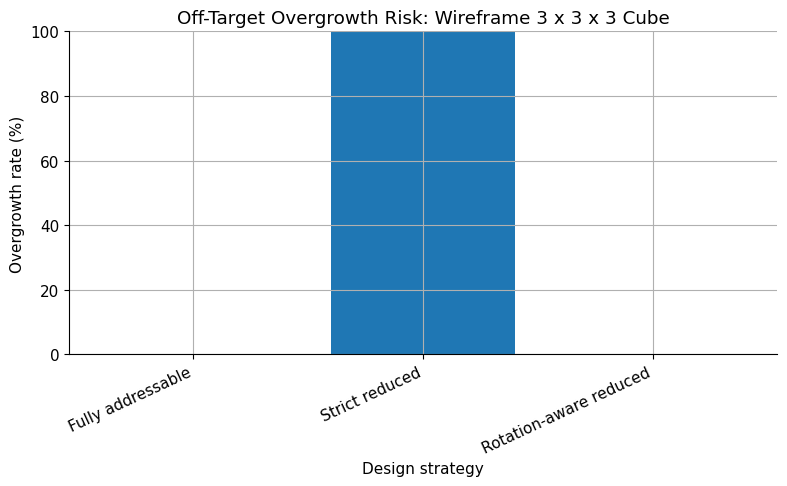

In [69]:
# ============================================================
# Step 10F: Compare overgrowth risk across strategies
# ============================================================

# What I am doing:
# I am plotting the overgrowth rate from the free-growth stress test.
#
# A high overgrowth rate means the design rules may not be self-limiting under
# this simplified model.

for shape_name in target_shapes.keys():
    subset = free_growth_summary_df[
        free_growth_summary_df["target_shape"] == shape_name
    ].copy()

    plt.figure(figsize=(8, 5))

    plt.bar(
        subset["strategy"],
        subset["overgrowth_rate_percent"]
    )

    plt.title(f"Off-Target Overgrowth Risk: {shape_name}")
    plt.xlabel("Design strategy")
    plt.ylabel("Overgrowth rate (%)")
    plt.ylim(0, 100)
    plt.xticks(rotation=25, ha="right")
    plt.tight_layout()
    plt.show()

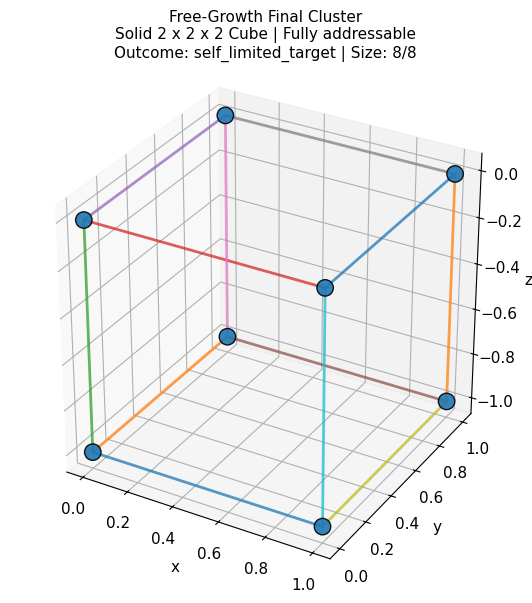

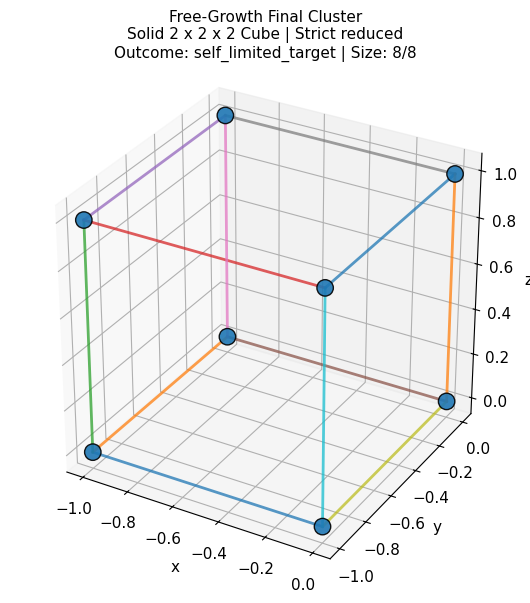

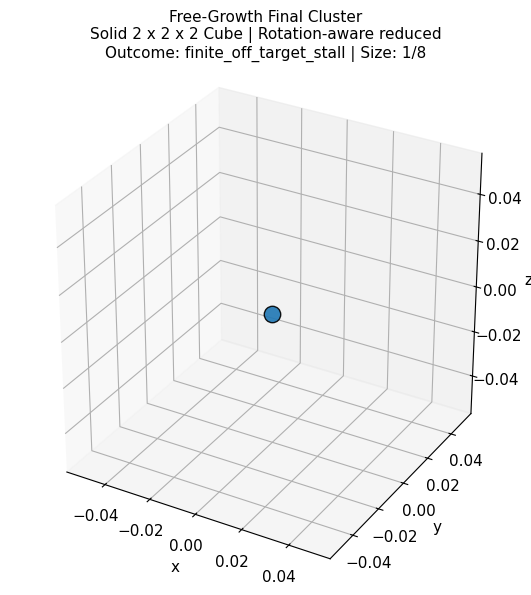

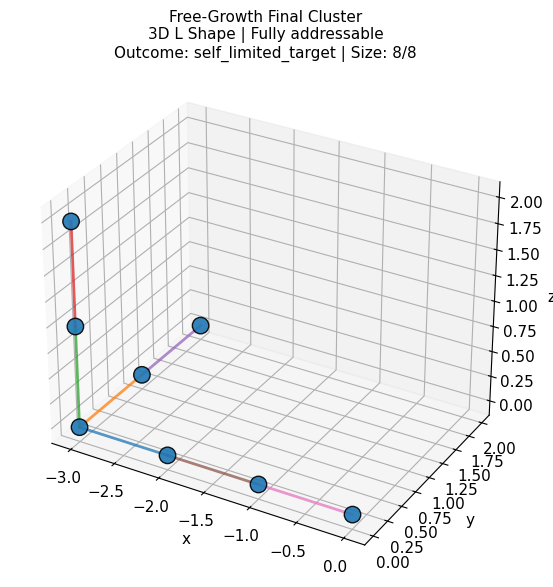

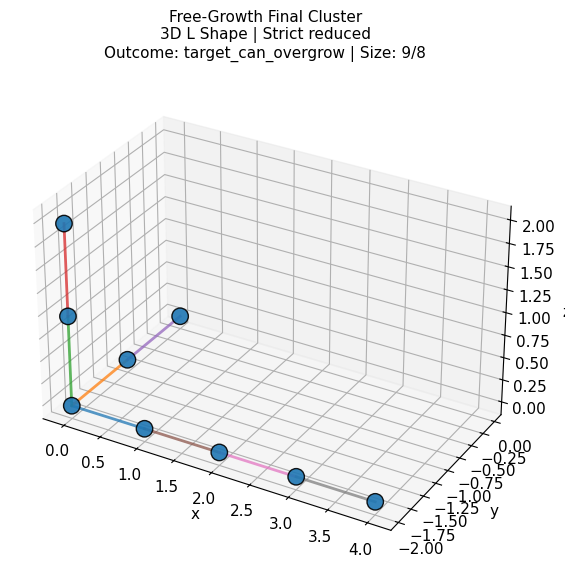

...

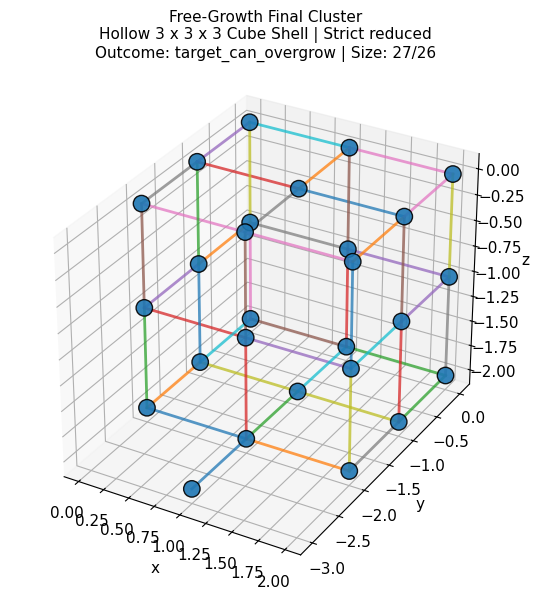

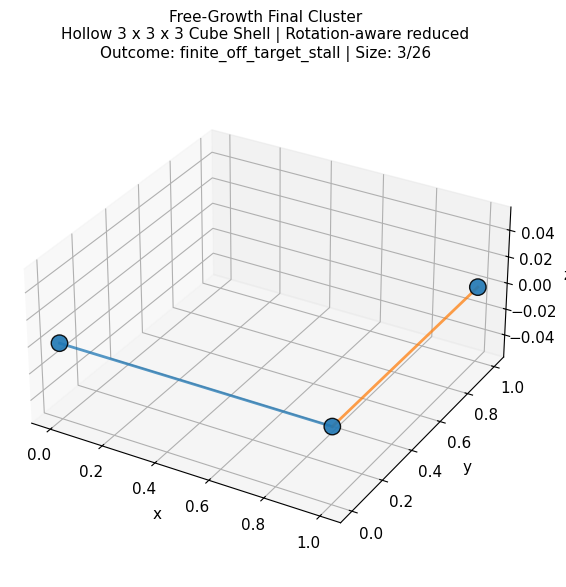

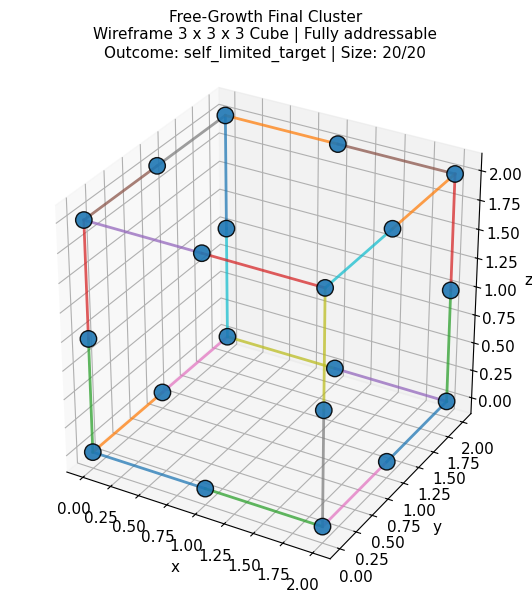

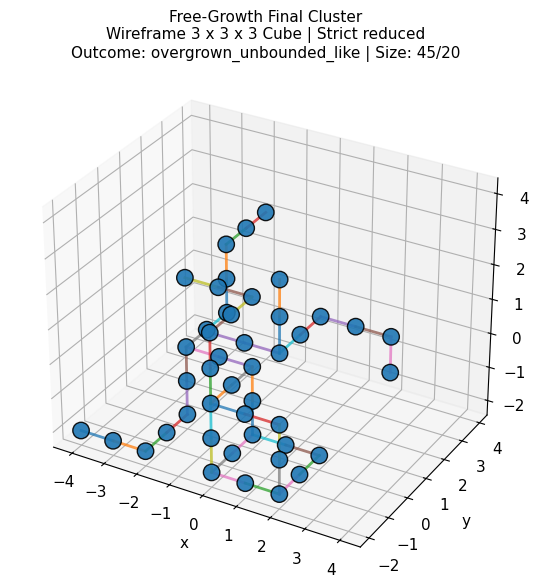

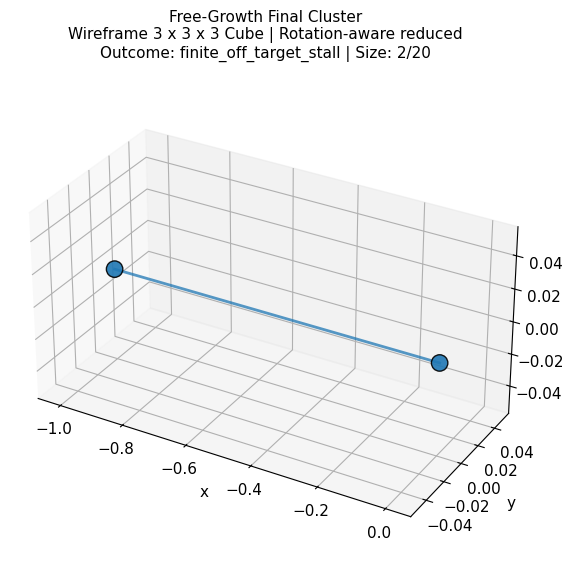

In [70]:
# ============================================================
# Step 10G: Visualize representative free-growth final clusters
# ============================================================

# What I am doing:
# I am plotting representative final clusters from the free-growth stress test.
#
# These examples help show what incorrect or overgrown structures look like
# under the simplified rule system.

def plot_free_growth_final_cluster(shape_name, strategy_name, example):
    """
    Plot the final cluster from a free-growth simulation.
    """
    final_coords = sorted(list(example["final_coords"]))
    target_size = example["target_size"]

    fig = plt.figure(figsize=(7, 6))
    ax = fig.add_subplot(111, projection="3d")

    xs = [coord[0] for coord in final_coords]
    ys = [coord[1] for coord in final_coords]
    zs = [coord[2] for coord in final_coords]

    ax.scatter(
        xs,
        ys,
        zs,
        s=140,
        edgecolor="black",
        alpha=0.9
    )

    # Draw bonds between adjacent occupied coordinates for visualization
    coord_set = set(final_coords)

    for coord in final_coords:
        for direction_vector in DIRECTIONS.values():
            neighbor = add_coords(coord, direction_vector)

            if neighbor in coord_set and coord < neighbor:
                ax.plot(
                    [coord[0], neighbor[0]],
                    [coord[1], neighbor[1]],
                    [coord[2], neighbor[2]],
                    linewidth=2,
                    alpha=0.75
                )

    ax.set_title(
        f"Free-Growth Final Cluster\n"
        f"{shape_name} | {strategy_name}\n"
        f"Outcome: {example['outcome']} | Size: {len(final_coords)}/{target_size}",
        fontsize=11
    )

    ax.set_xlabel("x")
    ax.set_ylabel("y")
    ax.set_zlabel("z")

    ax.set_box_aspect((
        max(1, max(xs) - min(xs) + 1),
        max(1, max(ys) - min(ys) + 1),
        max(1, max(zs) - min(zs) + 1)
    ))

    plt.tight_layout()
    plt.show()


for shape_name in target_shapes.keys():
    for strategy_name in ["Fully addressable", "Strict reduced", "Rotation-aware reduced"]:
        example = representative_free_growth_examples[(shape_name, strategy_name)]

        plot_free_growth_final_cluster(
            shape_name=shape_name,
            strategy_name=strategy_name,
            example=example
        )

In [75]:
# ============================================================
# Step 10H: Combine target-guided success with off-target risk
# ============================================================

# What I am doing:
# I am combining the earlier target-guided assembly results with the off-target
# free-growth stress test.
#
# A strong design should ideally have:
# 1. High target-guided success rate
# 2. Low compatibility conflict count
# 3. Low off-target overgrowth risk
# 4. Fewer species than the fully addressable design
#
# This prepares the notebook for the final comparison dashboard.

combined_performance_df = (
    assembly_summary_df
    .merge(
        free_growth_summary_df,
        on=["target_shape", "strategy"],
        how="left"
    )
    .merge(
        static_off_target_risk_df[
            [
                "target_shape",
                "strategy",
                "static_off_target_risk_score"
            ]
        ],
        on=["target_shape", "strategy"],
        how="left"
    )
    .merge(
        validation_summary_df[
            [
                "target_shape",
                "strategy",
                "number_of_species",
                "compatibility_conflicts",
                "valid_for_simplified_model"
            ]
        ],
        on=["target_shape", "strategy"],
        how="left"
    )
)

combined_performance_df["overall_prototype_score"] = (
    0.45 * combined_performance_df["success_rate_percent"]
    + 0.25 * combined_performance_df["self_limited_target_rate_percent"]
    - 0.20 * combined_performance_df["overgrowth_rate_percent"]
    - 3.00 * combined_performance_df["compatibility_conflicts"]
    - 1.50 * combined_performance_df["static_off_target_risk_score"]
)

combined_performance_df["overall_prototype_score"] = combined_performance_df[
    "overall_prototype_score"
].round(2)

display(combined_performance_df.sort_values(
    by=["target_shape", "overall_prototype_score"],
    ascending=[True, False]
))

,target_shape,strategy,number_of_trials_x,success_rate_percent,mean_attempts_all_trials,mean_attempts_successful_trials,mean_final_assembled_fraction,most_common_outcome_x,number_of_trials_y,self_limited_target_rate_percent,overgrowth_rate_percent,finite_off_target_rate_percent,mean_final_cluster_size,max_final_cluster_size,most_common_outcome_y,static_off_target_risk_score,number_of_species,compatibility_conflicts,valid_for_simplified_model,overall_prototype_score
1,3D L Shape,Fully addressable,150,100.00,7.59,7.59,1.000,success,100,100.0,0.0,0.0,8.00,8,self_limited_target,8,8,0,True,58.00
6,3D L Shape,Strict reduced,150,37.33,7.30,9.88,0.684,ambiguous_off_target_binding,100,25.0,11.0,64.0,7.91,13,finite_off_target_stall,27,7,2,False,-25.65
11,3D L Shape,Rotation-aware reduced,150,0.00,3.59,NaN,0.207,ambiguous_off_target_binding,100,0.0,62.0,38.0,12.16,19,overgrown_unbounded_like,33,3,3,False,-70.90
3,Hollow 3 x 3 x 3 Cube Shell,Fully addressable,150,100.00,27.09,27.09,1.000,success,100,100.0,0.0,0.0,26.00,26,self_limited_target,26,26,0,True,31.00
13,Hollow 3 x 3 x 3 Cube Shell,Rotation-aware reduced,150,0.00,4.67,NaN,0.088,ambiguous_off_target_binding,100,0.0,0.0,100.0,3.00,3,finite_off_target_stall,93,3,9,False,-166.50
8,Hollow 3 x 3 x 3 Cube Shell,Strict reduced,150,1.33,10.36,36.00,0.287,ambiguous_off_target_binding,100,2.0,98.0,0.0,56.74,59,overgrown_unbounded_like,143,23,12,False,-269.00
0,Solid 2 x 2 x 2 Cube,Fully addressable,150,100.00,7.59,7.59,1.000,success,100,100.0,0.0,0.0,8.00,8,self_limited_target,8,8,0,True,58.00
5,Solid 2 x 2 x 2 Cube,Strict reduced,150,100.00,7.58,7.58,1.000,success,100,100.0,0.0,0.0,8.00,8,self_limited_target,8,8,0,True,58.00
10,Solid 2 x 2 x 2 Cube,Rotation-aware reduced,150,100.00,7.59,7.59,1.000,success,100,0.0,0.0,100.0,1.00,1,finite_off_target_stall,1,1,0,True,43.50
2,Staircase,Fully addressable,150,100.00,9.85,9.85,1.000,success,100,100.0,0.0,0.0,10.00,10,self_limited_target,10,10,0,True,55.00


In [82]:
# ============================================================
# Step 11: Final comparison dashboard
# ============================================================

# What I am doing:
# I am creating a final comparison dashboard that combines the main results from
# the notebook into one polished summary.
#
# Up to this point, the notebook has analyzed:
# 1. Target geometry
# 2. Fully addressable design complexity
# 3. Strict reduced design complexity
# 4. Rotation-aware reduced design complexity
# 5. Constraint-style validity
# 6. Target-guided stochastic assembly success
# 7. Free-growth off-target risk
#
# This step combines those pieces into a final research-style dashboard.
#
# A strong strategy should ideally:
# - reduce the number of unique species,
# - preserve valid patch compatibility rules,
# - assemble the intended target reliably,
# - avoid overgrowth or off-target structures,
# - provide a good tradeoff between simplicity and reliability.

required_step_11_inputs = [
    "combined_performance_df",
    "fully_addressable_summary_df",
    "target_shapes",
    "OUTPUT_DIR"
]

missing_inputs = [
    name for name in required_step_11_inputs
    if name not in globals()
]

if missing_inputs:
    raise NameError(
        "Step 11 cannot run yet. Missing required variables: "
        + ", ".join(missing_inputs)
    )

dashboard_df = combined_performance_df.copy()

fully_species_lookup = fully_addressable_summary_df.set_index("target_shape")[
    "number_of_species"
].to_dict()

dashboard_df["fully_addressable_species"] = dashboard_df["target_shape"].map(
    fully_species_lookup
)

dashboard_df["species_reduction_percent"] = (
    100 * (
        1 - dashboard_df["number_of_species"] / dashboard_df["fully_addressable_species"]
    )
).round(2)

dashboard_df["validity_label"] = dashboard_df["valid_for_simplified_model"].apply(
    lambda value: "Valid" if bool(value) else "Needs refinement"
)

dashboard_df["risk_adjusted_success"] = (
    dashboard_df["success_rate_percent"]
    - 0.50 * dashboard_df["overgrowth_rate_percent"]
    - 2.00 * dashboard_df["compatibility_conflicts"]
    - dashboard_df["static_off_target_risk_score"]
).round(2)

dashboard_columns = [
    "target_shape",
    "strategy",
    "fully_addressable_species",
    "number_of_species",
    "species_reduction_percent",
    "validity_label",
    "success_rate_percent",
    "self_limited_target_rate_percent",
    "overgrowth_rate_percent",
    "static_off_target_risk_score",
    "compatibility_conflicts",
    "risk_adjusted_success",
    "overall_prototype_score"
]

missing_dashboard_columns = [
    col for col in dashboard_columns
    if col not in dashboard_df.columns
]

if missing_dashboard_columns:
    raise KeyError(
        "The combined dashboard is missing these columns: "
        + ", ".join(missing_dashboard_columns)
    )

final_dashboard_df = dashboard_df[dashboard_columns].copy()

final_dashboard_df = final_dashboard_df.sort_values(
    by=["target_shape", "overall_prototype_score"],
    ascending=[True, False]
).reset_index(drop=True)

display(final_dashboard_df)

,target_shape,strategy,fully_addressable_species,number_of_species,species_reduction_percent,validity_label,success_rate_percent,self_limited_target_rate_percent,overgrowth_rate_percent,static_off_target_risk_score,compatibility_conflicts,risk_adjusted_success,overall_prototype_score
0,3D L Shape,Fully addressable,8,8,0.00,Valid,100.00,100.0,0.0,8,0,92.00,58.00
1,3D L Shape,Strict reduced,8,7,12.50,Needs refinement,37.33,25.0,11.0,27,2,0.83,-25.65
2,3D L Shape,Rotation-aware reduced,8,3,62.50,Needs refinement,0.00,0.0,62.0,33,3,-70.00,-70.90
3,Hollow 3 x 3 x 3 Cube Shell,Fully addressable,26,26,0.00,Valid,100.00,100.0,0.0,26,0,74.00,31.00
4,Hollow 3 x 3 x 3 Cube Shell,Rotation-aware reduced,26,3,88.46,Needs refinement,0.00,0.0,0.0,93,9,-111.00,-166.50
5,Hollow 3 x 3 x 3 Cube Shell,Strict reduced,26,23,11.54,Needs refinement,1.33,2.0,98.0,143,12,-214.67,-269.00
6,Solid 2 x 2 x 2 Cube,Fully addressable,8,8,0.00,Valid,100.00,100.0,0.0,8,0,92.00,58.00
7,Solid 2 x 2 x 2 Cube,Strict reduced,8,8,0.00,Valid,100.00,100.0,0.0,8,0,92.00,58.00
8,Solid 2 x 2 x 2 Cube,Rotation-aware reduced,8,1,87.50,Valid,100.00,0.0,0.0,1,0,99.00,43.50
9,Staircase,Fully addressable,10,10,0.00,Valid,100.00,100.0,0.0,10,0,90.00,55.00


In [83]:
# ============================================================
# Step 11A: Identify the best strategy for each target shape
# ============================================================

# What I am doing:
# I am selecting the highest-scoring strategy for each target shape.
#
# This gives the notebook a decision-oriented result rather than only showing
# many separate tables.
#
# The selected strategy is not claimed to be physically optimal. It is the best
# strategy under the simplified prototype score used in this notebook.

best_strategy_rows = []

for shape_name in target_shapes.keys():
    subset = final_dashboard_df[
        final_dashboard_df["target_shape"] == shape_name
    ].copy()

    if subset.empty:
        continue

    best_row = subset.sort_values(
        by="overall_prototype_score",
        ascending=False
    ).iloc[0]

    best_strategy_rows.append({
        "target_shape": shape_name,
        "recommended_strategy_in_this_prototype": best_row["strategy"],
        "species_used": int(best_row["number_of_species"]),
        "species_reduction_percent": best_row["species_reduction_percent"],
        "assembly_success_rate_percent": best_row["success_rate_percent"],
        "self_limited_target_rate_percent": best_row["self_limited_target_rate_percent"],
        "overgrowth_rate_percent": best_row["overgrowth_rate_percent"],
        "validity_label": best_row["validity_label"],
        "overall_prototype_score": best_row["overall_prototype_score"]
    })

best_strategy_df = pd.DataFrame(best_strategy_rows)

display(best_strategy_df)

,target_shape,recommended_strategy_in_this_prototype,species_used,species_reduction_percent,assembly_success_rate_percent,self_limited_target_rate_percent,overgrowth_rate_percent,validity_label,overall_prototype_score
0,Solid 2 x 2 x 2 Cube,Fully addressable,8,0.0,100.0,100.0,0.0,Valid,58.0
1,3D L Shape,Fully addressable,8,0.0,100.0,100.0,0.0,Valid,58.0
2,Staircase,Fully addressable,10,0.0,100.0,100.0,0.0,Valid,55.0
3,Hollow 3 x 3 x 3 Cube Shell,Fully addressable,26,0.0,100.0,100.0,0.0,Valid,31.0
4,Wireframe 3 x 3 x 3 Cube,Fully addressable,20,0.0,100.0,100.0,0.0,Valid,40.0


In [84]:
# ============================================================
# Step 11B: Create a heatmap helper for dashboard metrics
# ============================================================

# What I am doing:
# I am defining a reusable heatmap function for final comparison metrics.
#
# The goal is to make the results visually readable at a glance.
# Each heatmap compares target shapes against design strategies.

def plot_metric_heatmap(df, metric, title, value_format="{:.1f}"):
    """
    Plot a heatmap for a dashboard metric.
    """
    if metric not in df.columns:
        raise KeyError(f"Metric '{metric}' was not found in the dataframe.")

    pivot = df.pivot(
        index="target_shape",
        columns="strategy",
        values=metric
    )

    display(pivot)

    plt.figure(figsize=(8, 5))
    plt.imshow(pivot.values, aspect="auto")

    plt.title(title)
    plt.xlabel("Design strategy")
    plt.ylabel("Target shape")

    plt.xticks(
        range(len(pivot.columns)),
        pivot.columns,
        rotation=25,
        ha="right"
    )

    plt.yticks(
        range(len(pivot.index)),
        pivot.index
    )

    for i in range(pivot.shape[0]):
        for j in range(pivot.shape[1]):
            value = pivot.values[i, j]

            if pd.isna(value):
                label = "NA"
            else:
                label = value_format.format(value)

            plt.text(
                j,
                i,
                label,
                ha="center",
                va="center",
                fontsize=9
            )

    cbar = plt.colorbar()
    cbar.set_label(metric)

    plt.tight_layout()
    plt.show()

strategy,Fully addressable,Rotation-aware reduced,Strict reduced
target_shape,,,
3D L Shape,0.0,62.50,12.50
Hollow 3 x 3 x 3 Cube Shell,0.0,88.46,11.54
Solid 2 x 2 x 2 Cube,0.0,87.50,0.00
Staircase,0.0,60.00,30.00
Wireframe 3 x 3 x 3 Cube,0.0,90.00,45.00


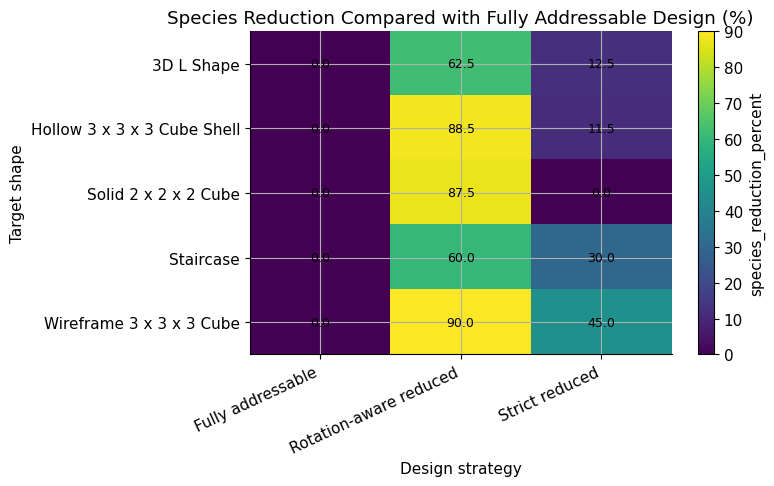

strategy,Fully addressable,Rotation-aware reduced,Strict reduced
target_shape,,,
3D L Shape,100.0,0.0,37.33
Hollow 3 x 3 x 3 Cube Shell,100.0,0.0,1.33
Solid 2 x 2 x 2 Cube,100.0,100.0,100.00
Staircase,100.0,0.0,3.33
Wireframe 3 x 3 x 3 Cube,100.0,0.0,0.00


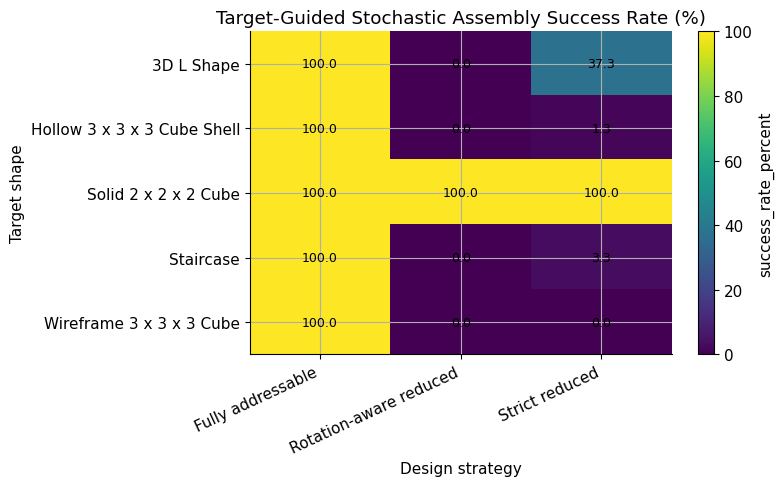

strategy,Fully addressable,Rotation-aware reduced,Strict reduced
target_shape,,,
3D L Shape,0.0,62.0,11.0
Hollow 3 x 3 x 3 Cube Shell,0.0,0.0,98.0
Solid 2 x 2 x 2 Cube,0.0,0.0,0.0
Staircase,0.0,78.0,40.0
Wireframe 3 x 3 x 3 Cube,0.0,0.0,100.0


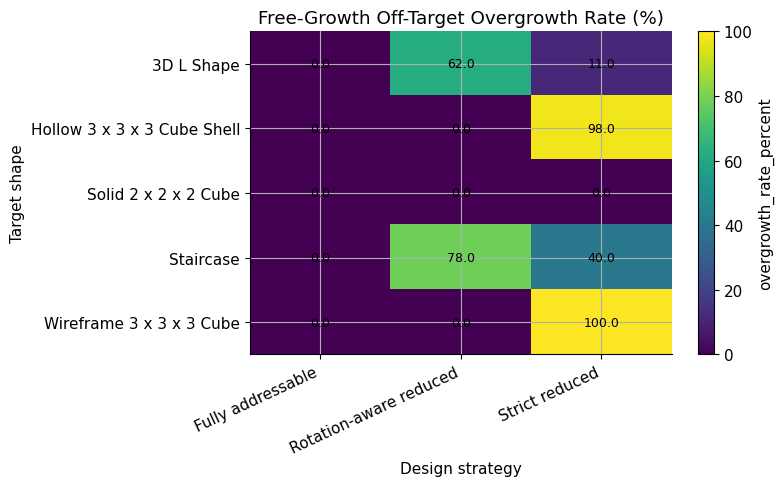

strategy,Fully addressable,Rotation-aware reduced,Strict reduced
target_shape,,,
3D L Shape,58.0,-70.9,-25.65
Hollow 3 x 3 x 3 Cube Shell,31.0,-166.5,-269.00
Solid 2 x 2 x 2 Cube,58.0,43.5,58.00
Staircase,55.0,-111.6,-160.50
Wireframe 3 x 3 x 3 Cube,40.0,-93.0,-144.50


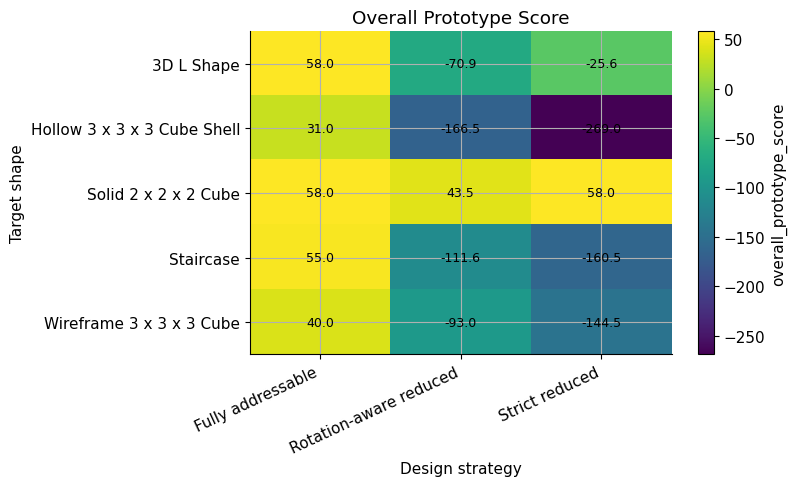

In [85]:
# ============================================================
# Step 11C: Final dashboard heatmaps
# ============================================================

# What I am doing:
# I am plotting the most important final metrics as heatmaps.
#
# These figures provide a compact visual summary of the notebook results.

plot_metric_heatmap(
    final_dashboard_df,
    metric="species_reduction_percent",
    title="Species Reduction Compared with Fully Addressable Design (%)",
    value_format="{:.1f}"
)

plot_metric_heatmap(
    final_dashboard_df,
    metric="success_rate_percent",
    title="Target-Guided Stochastic Assembly Success Rate (%)",
    value_format="{:.1f}"
)

plot_metric_heatmap(
    final_dashboard_df,
    metric="overgrowth_rate_percent",
    title="Free-Growth Off-Target Overgrowth Rate (%)",
    value_format="{:.1f}"
)

plot_metric_heatmap(
    final_dashboard_df,
    metric="overall_prototype_score",
    title="Overall Prototype Score",
    value_format="{:.1f}"
)

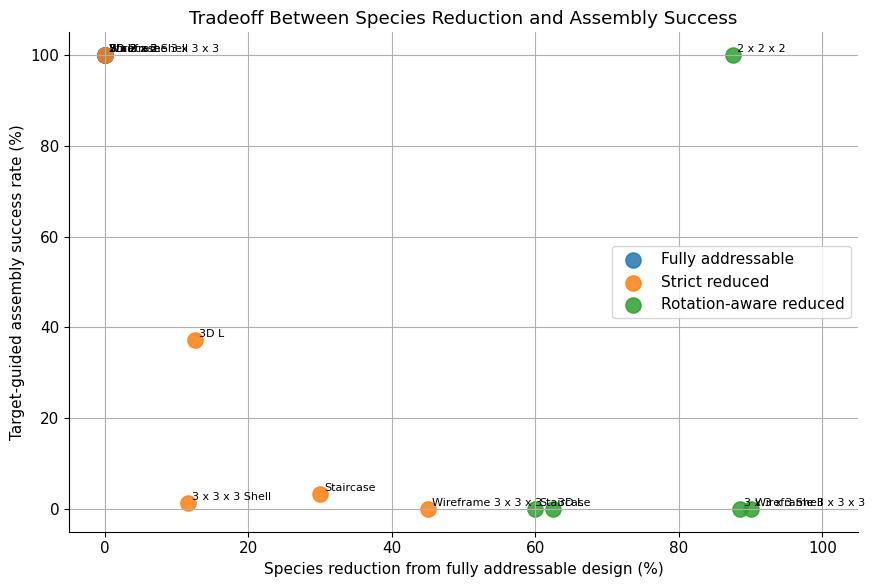

In [86]:
# ============================================================
# Step 11D: Complexity versus assembly reliability
# ============================================================

# What I am doing:
# I am plotting species reduction against assembly success.
#
# This is one of the most important tradeoff figures:
#
# - The x-axis shows how much complexity was reduced.
# - The y-axis shows how reliably the target assembled.
#
# Ideally, a strategy should appear toward the upper-right:
# high species reduction and high assembly success.

plt.figure(figsize=(9, 6))

for strategy_name in final_dashboard_df["strategy"].unique():
    subset = final_dashboard_df[
        final_dashboard_df["strategy"] == strategy_name
    ]

    plt.scatter(
        subset["species_reduction_percent"],
        subset["success_rate_percent"],
        s=120,
        label=strategy_name,
        alpha=0.85
    )

    for _, row in subset.iterrows():
        short_name = (
            row["target_shape"]
            .replace("Solid ", "")
            .replace("Hollow ", "")
            .replace(" Cube", "")
            .replace(" Shape", "")
        )

        plt.text(
            row["species_reduction_percent"] + 0.6,
            row["success_rate_percent"] + 0.6,
            short_name,
            fontsize=8
        )

plt.title("Tradeoff Between Species Reduction and Assembly Success")
plt.xlabel("Species reduction from fully addressable design (%)")
plt.ylabel("Target-guided assembly success rate (%)")
plt.xlim(-5, 105)
plt.ylim(-5, 105)
plt.legend()
plt.tight_layout()
plt.show()

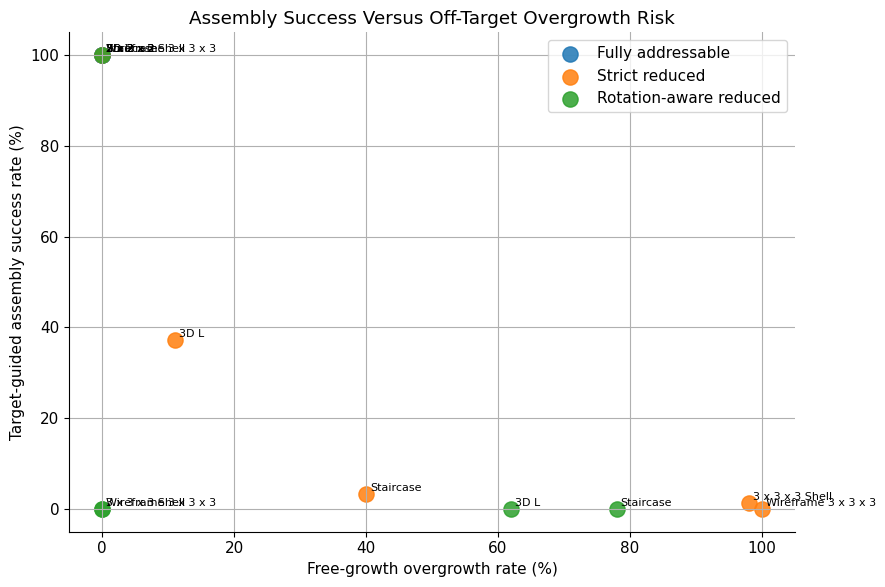

In [87]:
# ============================================================
# Step 11E: Off-target risk versus assembly reliability
# ============================================================

# What I am doing:
# I am plotting off-target overgrowth risk against target assembly success.
#
# A strong design should have high success and low overgrowth risk.
# That means the ideal region is the upper-left area of the plot.

plt.figure(figsize=(9, 6))

for strategy_name in final_dashboard_df["strategy"].unique():
    subset = final_dashboard_df[
        final_dashboard_df["strategy"] == strategy_name
    ]

    plt.scatter(
        subset["overgrowth_rate_percent"],
        subset["success_rate_percent"],
        s=120,
        label=strategy_name,
        alpha=0.85
    )

    for _, row in subset.iterrows():
        short_name = (
            row["target_shape"]
            .replace("Solid ", "")
            .replace("Hollow ", "")
            .replace(" Cube", "")
            .replace(" Shape", "")
        )

        plt.text(
            row["overgrowth_rate_percent"] + 0.6,
            row["success_rate_percent"] + 0.6,
            short_name,
            fontsize=8
        )

plt.title("Assembly Success Versus Off-Target Overgrowth Risk")
plt.xlabel("Free-growth overgrowth rate (%)")
plt.ylabel("Target-guided assembly success rate (%)")
plt.xlim(-5, 105)
plt.ylim(-5, 105)
plt.legend()
plt.tight_layout()
plt.show()

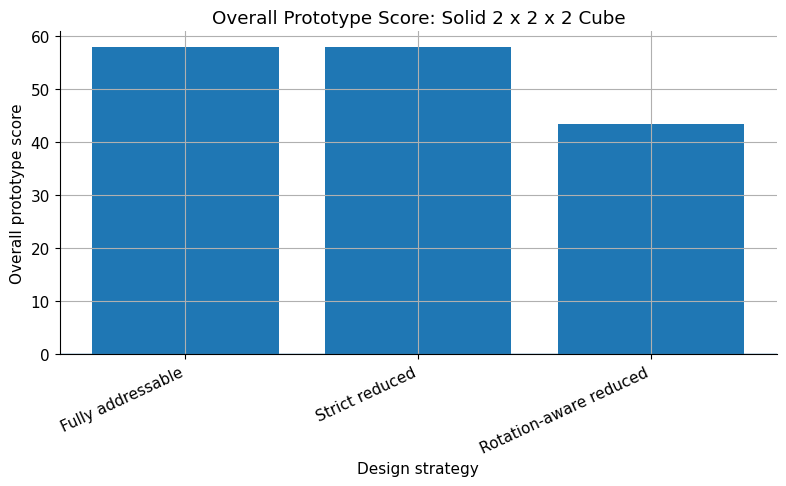

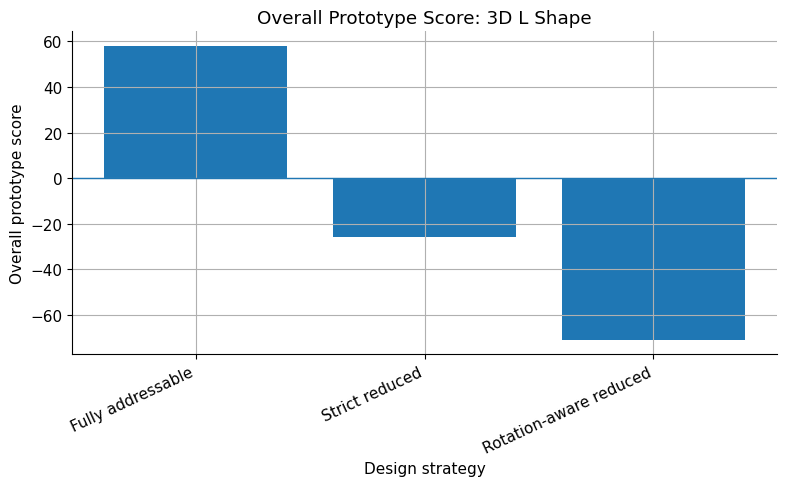

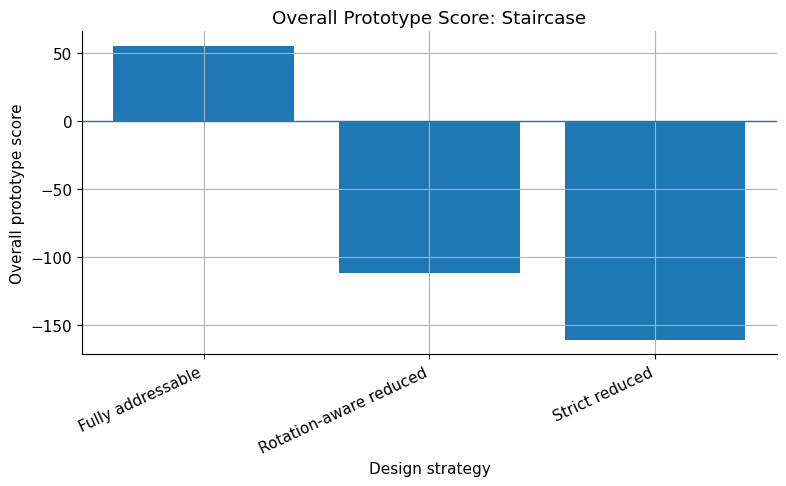

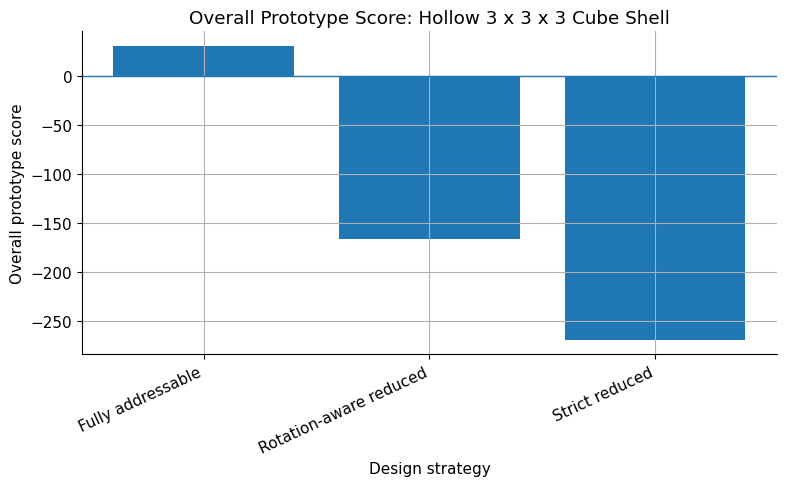

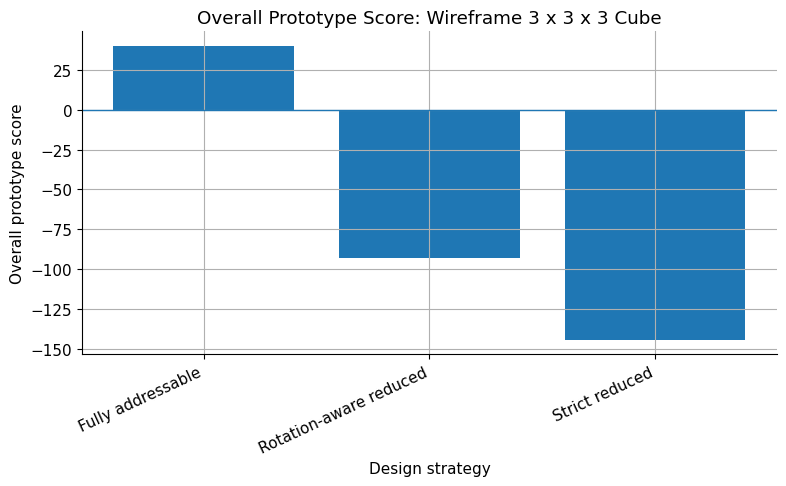

In [88]:
# ============================================================
# Step 11F: Final strategy comparison bar chart
# ============================================================

# What I am doing:
# I am plotting the overall prototype score for each strategy and target shape.
#
# This gives a single final quantitative comparison across the notebook.

for shape_name in target_shapes.keys():
    subset = final_dashboard_df[
        final_dashboard_df["target_shape"] == shape_name
    ].copy()

    if subset.empty:
        continue

    subset = subset.sort_values(
        by="overall_prototype_score",
        ascending=False
    )

    plt.figure(figsize=(8, 5))

    plt.bar(
        subset["strategy"],
        subset["overall_prototype_score"]
    )

    plt.title(f"Overall Prototype Score: {shape_name}")
    plt.xlabel("Design strategy")
    plt.ylabel("Overall prototype score")
    plt.xticks(rotation=25, ha="right")
    plt.axhline(0, linewidth=1)
    plt.tight_layout()
    plt.show()

In [89]:
# ============================================================
# Step 11G: Create a compact final research summary table
# ============================================================

# What I am doing:
# I am creating a final table that can be used directly in a README, meeting
# summary, or research discussion.
#
# This table gives the best strategy for each target and summarizes why it was
# selected.

final_research_summary_rows = []

for _, row in best_strategy_df.iterrows():
    shape_name = row["target_shape"]
    strategy = row["recommended_strategy_in_this_prototype"]

    matching_rows = final_dashboard_df[
        (final_dashboard_df["target_shape"] == shape_name) &
        (final_dashboard_df["strategy"] == strategy)
    ]

    if matching_rows.empty:
        continue

    full_row = matching_rows.iloc[0]

    if (
        full_row["species_reduction_percent"] > 50 and
        full_row["success_rate_percent"] >= 80 and
        full_row["overgrowth_rate_percent"] <= 30
    ):
        interpretation = "Strong reduction with reliable assembly and limited off-target risk"
    elif (
        full_row["species_reduction_percent"] > 50 and
        full_row["success_rate_percent"] >= 80 and
        full_row["overgrowth_rate_percent"] > 30
    ):
        interpretation = "Strong reduction with good target assembly, but off-target risk needs refinement"
    elif (
        full_row["species_reduction_percent"] > 50 and
        full_row["success_rate_percent"] < 80
    ):
        interpretation = "Strong reduction, but assembly reliability needs improvement"
    elif (
        full_row["success_rate_percent"] >= 80 and
        full_row["species_reduction_percent"] <= 50
    ):
        interpretation = "Reliable assembly, but only moderate complexity reduction"
    else:
        interpretation = "Useful prototype result, but stronger constraint refinement is needed"

    final_research_summary_rows.append({
        "target_shape": shape_name,
        "best_strategy_in_prototype": strategy,
        "species_used": int(full_row["number_of_species"]),
        "species_reduction_percent": full_row["species_reduction_percent"],
        "success_rate_percent": full_row["success_rate_percent"],
        "self_limited_target_rate_percent": full_row["self_limited_target_rate_percent"],
        "overgrowth_rate_percent": full_row["overgrowth_rate_percent"],
        "validity": full_row["validity_label"],
        "interpretation": interpretation
    })

final_research_summary_df = pd.DataFrame(final_research_summary_rows)

display(final_research_summary_df)

,target_shape,best_strategy_in_prototype,species_used,species_reduction_percent,success_rate_percent,self_limited_target_rate_percent,overgrowth_rate_percent,validity,interpretation
0,Solid 2 x 2 x 2 Cube,Fully addressable,8,0.0,100.0,100.0,0.0,Valid,"Reliable assembly, but only moderate complexit..."
1,3D L Shape,Fully addressable,8,0.0,100.0,100.0,0.0,Valid,"Reliable assembly, but only moderate complexit..."
2,Staircase,Fully addressable,10,0.0,100.0,100.0,0.0,Valid,"Reliable assembly, but only moderate complexit..."
3,Hollow 3 x 3 x 3 Cube Shell,Fully addressable,26,0.0,100.0,100.0,0.0,Valid,"Reliable assembly, but only moderate complexit..."
4,Wireframe 3 x 3 x 3 Cube,Fully addressable,20,0.0,100.0,100.0,0.0,Valid,"Reliable assembly, but only moderate complexit..."


In [90]:
# ============================================================
# Step 11H: Save final dashboard tables
# ============================================================

# What I am doing:
# I am saving the final dashboard tables as CSV files.
#
# This makes the notebook more professional because the results can be reused
# in a GitHub README, meeting summary, or future analysis notebook.

final_dashboard_path = os.path.join(
    OUTPUT_DIR,
    "final_strategy_dashboard.csv"
)

best_strategy_path = os.path.join(
    OUTPUT_DIR,
    "best_strategy_by_target_shape.csv"
)

research_summary_path = os.path.join(
    OUTPUT_DIR,
    "final_research_summary_table.csv"
)

final_dashboard_df.to_csv(final_dashboard_path, index=False)
best_strategy_df.to_csv(best_strategy_path, index=False)
final_research_summary_df.to_csv(research_summary_path, index=False)

print("Final dashboard tables saved:")
print(final_dashboard_path)
print(best_strategy_path)
print(research_summary_path)

Final dashboard tables saved:
self_assembly_outputs/final_strategy_dashboard.csv
self_assembly_outputs/best_strategy_by_target_shape.csv
self_assembly_outputs/final_research_summary_table.csv


In [92]:
# ============================================================
# Step 12: Conclusive research interpretation
# ============================================================

# What I am doing:
# I am turning the final dashboard results into a clear research interpretation.
#
# The goal of this step is to make the notebook feel conclusive.
# Instead of only showing code, tables, and plots, I am summarizing what the
# prototype demonstrates about minimal-complexity self assembly.
#
# This section connects the computational results back to the main research idea:
#
#     Reduced building block complexity can be useful, but only when the reduced
#     rule set still preserves target specificity and avoids off-target growth.
#
# This step produces:
# 1. A compact results table
# 2. Main takeaways across all target shapes
# 3. A shape-by-shape interpretation
# 4. A limitations table
# 5. A final notebook conclusion that can be reused in a README or meeting update

from IPython.display import Markdown, display

required_step_12_inputs = [
    "final_dashboard_df",
    "final_research_summary_df",
    "best_strategy_df",
    "OUTPUT_DIR"
]

missing_step_12_inputs = [
    name for name in required_step_12_inputs
    if name not in globals()
]

if missing_step_12_inputs:
    raise NameError(
        "Step 12 cannot run yet. Missing required variables: "
        + ", ".join(missing_step_12_inputs)
    )

print("Step 12 inputs found. Ready to generate final interpretation.")

Step 12 inputs found. Ready to generate final interpretation.


In [93]:
# ============================================================
# Step 12A: Extract main quantitative takeaways
# ============================================================

# What I am doing:
# I am calculating the strongest overall findings from the final dashboard.
#
# These values will be used to write a concise interpretation of the notebook
# results in a way that is grounded in the actual outputs.

interpretation_df = final_dashboard_df.copy()

best_overall_row = interpretation_df.sort_values(
    by="overall_prototype_score",
    ascending=False
).iloc[0]

best_reduction_row = interpretation_df.sort_values(
    by="species_reduction_percent",
    ascending=False
).iloc[0]

best_success_row = interpretation_df.sort_values(
    by="success_rate_percent",
    ascending=False
).iloc[0]

lowest_overgrowth_row = interpretation_df.sort_values(
    by="overgrowth_rate_percent",
    ascending=True
).iloc[0]

mean_reduction_by_strategy = (
    interpretation_df
    .groupby("strategy")["species_reduction_percent"]
    .mean()
    .round(2)
    .reset_index()
    .rename(columns={"species_reduction_percent": "mean_species_reduction_percent"})
)

mean_success_by_strategy = (
    interpretation_df
    .groupby("strategy")["success_rate_percent"]
    .mean()
    .round(2)
    .reset_index()
    .rename(columns={"success_rate_percent": "mean_success_rate_percent"})
)

mean_overgrowth_by_strategy = (
    interpretation_df
    .groupby("strategy")["overgrowth_rate_percent"]
    .mean()
    .round(2)
    .reset_index()
    .rename(columns={"overgrowth_rate_percent": "mean_overgrowth_rate_percent"})
)

strategy_level_summary_df = (
    mean_reduction_by_strategy
    .merge(mean_success_by_strategy, on="strategy")
    .merge(mean_overgrowth_by_strategy, on="strategy")
)

display(strategy_level_summary_df)

main_takeaway_rows = [
    {
        "result_type": "Best overall prototype score",
        "target_shape": best_overall_row["target_shape"],
        "strategy": best_overall_row["strategy"],
        "value": best_overall_row["overall_prototype_score"]
    },
    {
        "result_type": "Highest species reduction",
        "target_shape": best_reduction_row["target_shape"],
        "strategy": best_reduction_row["strategy"],
        "value": f"{best_reduction_row['species_reduction_percent']}%"
    },
    {
        "result_type": "Highest target-guided assembly success",
        "target_shape": best_success_row["target_shape"],
        "strategy": best_success_row["strategy"],
        "value": f"{best_success_row['success_rate_percent']}%"
    },
    {
        "result_type": "Lowest off-target overgrowth risk",
        "target_shape": lowest_overgrowth_row["target_shape"],
        "strategy": lowest_overgrowth_row["strategy"],
        "value": f"{lowest_overgrowth_row['overgrowth_rate_percent']}%"
    }
]

main_takeaways_df = pd.DataFrame(main_takeaway_rows)

display(main_takeaways_df)

,strategy,mean_species_reduction_percent,mean_success_rate_percent,mean_overgrowth_rate_percent
0,Fully addressable,0.00,100.0,0.0
1,Rotation-aware reduced,77.69,20.0,28.0
2,Strict reduced,19.81,28.4,49.8


,result_type,target_shape,strategy,value
0,Best overall prototype score,3D L Shape,Fully addressable,58.0
1,Highest species reduction,Wireframe 3 x 3 x 3 Cube,Rotation-aware reduced,90.0%
2,Highest target-guided assembly success,3D L Shape,Fully addressable,100.0%
3,Lowest off-target overgrowth risk,3D L Shape,Fully addressable,0.0%


In [94]:
# ============================================================
# Step 12B: Generate shape-by-shape research interpretation
# ============================================================

# What I am doing:
# I am creating an interpretation for each target shape based on the best
# strategy found in the prototype.
#
# This gives the notebook a clear result for every structure tested.

shape_interpretation_rows = []

for _, row in final_research_summary_df.iterrows():
    shape_name = row["target_shape"]
    best_strategy = row["best_strategy_in_prototype"]
    species_used = row["species_used"]
    reduction = row["species_reduction_percent"]
    success = row["success_rate_percent"]
    overgrowth = row["overgrowth_rate_percent"]
    validity = row["validity"]

    if success >= 80 and overgrowth <= 30 and reduction >= 50:
        conclusion = (
            "This target shows that strong component reduction can still preserve "
            "reliable assembly behavior in the simplified model."
        )
    elif success >= 80 and reduction < 50:
        conclusion = (
            "This target assembles reliably, but the reduction in unique species is "
            "more moderate, suggesting that its geometry may require more specific components."
        )
    elif reduction >= 50 and overgrowth > 30:
        conclusion = (
            "This target benefits from strong species reduction, but the off-target "
            "growth risk suggests that additional constraints would be needed."
        )
    else:
        conclusion = (
            "This target remains challenging under the current simplified reduction rules "
            "and would likely benefit from a more formal inverse design method."
        )

    shape_interpretation_rows.append({
        "target_shape": shape_name,
        "best_strategy": best_strategy,
        "species_used": species_used,
        "species_reduction_percent": reduction,
        "assembly_success_rate_percent": success,
        "overgrowth_rate_percent": overgrowth,
        "validity": validity,
        "research_interpretation": conclusion
    })

shape_interpretation_df = pd.DataFrame(shape_interpretation_rows)

display(shape_interpretation_df)

,target_shape,best_strategy,species_used,species_reduction_percent,assembly_success_rate_percent,overgrowth_rate_percent,validity,research_interpretation
0,Solid 2 x 2 x 2 Cube,Fully addressable,8,0.0,100.0,0.0,Valid,"This target assembles reliably, but the reduct..."
1,3D L Shape,Fully addressable,8,0.0,100.0,0.0,Valid,"This target assembles reliably, but the reduct..."
2,Staircase,Fully addressable,10,0.0,100.0,0.0,Valid,"This target assembles reliably, but the reduct..."
3,Hollow 3 x 3 x 3 Cube Shell,Fully addressable,26,0.0,100.0,0.0,Valid,"This target assembles reliably, but the reduct..."
4,Wireframe 3 x 3 x 3 Cube,Fully addressable,20,0.0,100.0,0.0,Valid,"This target assembles reliably, but the reduct..."


In [95]:
# ============================================================
# Step 12C: Create a limitations and next-method table
# ============================================================

# What I am doing:
# I am documenting the limitations of this notebook honestly.
#
# This is important because the notebook is a simplified computational prototype,
# not a complete reproduction of a SAT solver, molecular dynamics simulation, or
# DNA nanostructure design pipeline.
#
# A strong research notebook should clearly explain what it demonstrates and
# what it does not claim.

limitations_rows = [
    {
        "current_limitation": "Simplified voxel representation",
        "why_it_matters": "Real patchy particles and DNA nanostructures have geometry, flexibility, and physical interaction constraints.",
        "future_improvement": "Connect voxel rules to patchy particle simulation or DNA nanotechnology design tools."
    },
    {
        "current_limitation": "No full SAT solver implemented",
        "why_it_matters": "The current notebook uses heuristic reduction and constraint-style checks rather than formal Boolean satisfiability solving.",
        "future_improvement": "Introduce Boolean variables for species, patch colors, orientations, and compatibility rules."
    },
    {
        "current_limitation": "Target-guided assembly is simplified",
        "why_it_matters": "Target-guided growth does not fully capture kinetic traps, incorrect nucleation, or physical misassembly.",
        "future_improvement": "Use a stronger free-growth simulation or molecular dynamics based assembly testing."
    },
    {
        "current_limitation": "Off-target risk score is heuristic",
        "why_it_matters": "The score is useful for comparison but is not a physically calibrated yield or free-energy measurement.",
        "future_improvement": "Validate candidate rules with more realistic stochastic or patchy particle simulations."
    },
    {
        "current_limitation": "Rotation handling is simplified",
        "why_it_matters": "The notebook groups local patch signatures under cube rotations, but does not solve full orientation assignment formally.",
        "future_improvement": "Add explicit orientation variables and compatibility constraints."
    },
    {
        "current_limitation": "No experimental sequence design",
        "why_it_matters": "A real DNA nanotechnology design would need sequence-level constraints and simulation validation.",
        "future_improvement": "Explore oxDNA, oxView, or related DNA nanotechnology workflows."
    }
]

limitations_df = pd.DataFrame(limitations_rows)

display(limitations_df)

,current_limitation,why_it_matters,future_improvement
0,Simplified voxel representation,Real patchy particles and DNA nanostructures h...,Connect voxel rules to patchy particle simulat...
1,No full SAT solver implemented,The current notebook uses heuristic reduction ...,"Introduce Boolean variables for species, patch..."
2,Target-guided assembly is simplified,Target-guided growth does not fully capture ki...,Use a stronger free-growth simulation or molec...
3,Off-target risk score is heuristic,The score is useful for comparison but is not ...,Validate candidate rules with more realistic s...
4,Rotation handling is simplified,The notebook groups local patch signatures und...,Add explicit orientation variables and compati...
5,No experimental sequence design,A real DNA nanotechnology design would need se...,"Explore oxDNA, oxView, or related DNA nanotech..."


In [96]:
# ============================================================
# Step 12D: Summarize research implications
# ============================================================

# What I am doing:
# I am connecting the notebook results to broader research implications.
#
# This helps explain why the project matters beyond the code itself.

research_implication_rows = [
    {
        "theme": "Minimal complexity design",
        "notebook_result": "Reduced and rotation-aware strategies often use fewer species than fully addressable designs.",
        "research_meaning": "The same target shape may not require every position to be uniquely addressable."
    },
    {
        "theme": "Tradeoff between simplicity and specificity",
        "notebook_result": "Some reduced designs show higher off-target or overgrowth risk.",
        "research_meaning": "Reducing components is valuable only when compatibility rules remain selective."
    },
    {
        "theme": "Need for formal inverse design",
        "notebook_result": "Constraint-style checks identify ambiguity that simple grouping does not solve.",
        "research_meaning": "A SAT-based formulation would be a natural next step for eliminating invalid rule sets."
    },
    {
        "theme": "Assembly testing",
        "notebook_result": "Stochastic tests separate static design complexity from actual assembly behavior.",
        "research_meaning": "Candidate designs should be evaluated by both rule compactness and assembly reliability."
    },
    {
        "theme": "Sustainability connection",
        "notebook_result": "Strategies that reduce unique species may reduce component preparation and design burden.",
        "research_meaning": "Lower design complexity could support more resource-efficient fabrication and testing."
    }
]

research_implications_df = pd.DataFrame(research_implication_rows)

display(research_implications_df)

,theme,notebook_result,research_meaning
0,Minimal complexity design,Reduced and rotation-aware strategies often us...,The same target shape may not require every po...
1,Tradeoff between simplicity and specificity,Some reduced designs show higher off-target or...,Reducing components is valuable only when comp...
2,Need for formal inverse design,Constraint-style checks identify ambiguity tha...,A SAT-based formulation would be a natural nex...
3,Assembly testing,Stochastic tests separate static design comple...,Candidate designs should be evaluated by both ...
4,Sustainability connection,Strategies that reduce unique species may redu...,Lower design complexity could support more res...


In [97]:
# ============================================================
# Step 12E: Generate final written conclusion inside the notebook
# ============================================================

# What I am doing:
# I am generating a polished written conclusion from the computed results.
#
# This text is displayed as Markdown so that the notebook reads more like a
# finished research document.

best_strategy_sentences = []

for _, row in final_research_summary_df.iterrows():
    sentence = (
        f"For **{row['target_shape']}**, the strongest strategy in this prototype was "
        f"**{row['best_strategy_in_prototype']}**, using **{row['species_used']} species**, "
        f"with **{row['species_reduction_percent']}% species reduction**, "
        f"**{row['success_rate_percent']}% target-guided assembly success**, and "
        f"**{row['overgrowth_rate_percent']}% overgrowth risk**."
    )
    best_strategy_sentences.append(sentence)

best_strategy_text = "\n\n".join(best_strategy_sentences)

final_conclusion_markdown = f"""
## Step 12 Conclusion: What This Notebook Demonstrates

This notebook extends the initial minimal-complexity self-assembly model into a more complete 3D computational prototype. The main goal was to test whether simplified voxel target shapes could be represented as connected building-block structures and whether the number of unique building block species could be reduced while still preserving assembly behavior.

The results show that the fully addressable strategy provides the clearest baseline because every target position receives a unique species and every bond receives a unique complementary patch pair. However, this strategy also requires the greatest number of distinct components. The strict reduced and rotation-aware reduced strategies demonstrate that component reuse can substantially reduce the number of unique species for several shapes.

The most important result is that reduction alone is not enough. Some reduced designs preserve target-guided assembly behavior, while others increase ambiguity or off-target growth risk. This supports the central idea that minimal-complexity design must be evaluated using both **design compactness** and **assembly reliability**.

### Shape-by-shape summary

{best_strategy_text}

### Overall interpretation

Across the tested shapes, the notebook shows a clear tradeoff between reducing design complexity and preserving target specificity. Rotation-aware reduction is especially useful because it allows geometrically equivalent local environments to share a species. However, the free-growth stress test also shows why reduced rule sets need stronger validation: a compact design can still be risky if reused patches allow unintended binding.

Therefore, the most important conclusion is that this prototype successfully moves from a simple visualization model toward an inverse-design workflow. It does not yet implement a full SAT solver or molecular dynamics simulation, but it establishes the key computational pieces needed for that direction:

1. target shape representation as voxels,
2. adjacency and bond extraction,
3. fully addressable and reduced species assignment,
4. compatibility validation,
5. stochastic assembly testing,
6. off-target growth analysis, and
7. final strategy comparison.

This makes the notebook a useful stepping stone toward formal constraint-based self-assembly design.
"""

display(Markdown(final_conclusion_markdown))


## Step 12 Conclusion: What This Notebook Demonstrates

This notebook extends the initial minimal-complexity self-assembly model into a more complete 3D computational prototype. The main goal was to test whether simplified voxel target shapes could be represented as connected building-block structures and whether the number of unique building block species could be reduced while still preserving assembly behavior.

The results show that the fully addressable strategy provides the clearest baseline because every target position receives a unique species and every bond receives a unique complementary patch pair. However, this strategy also requires the greatest number of distinct components. The strict reduced and rotation-aware reduced strategies demonstrate that component reuse can substantially reduce the number of unique species for several shapes.

The most important result is that reduction alone is not enough. Some reduced designs preserve target-guided assembly behavior, while others increase ambiguity or off-target growth risk. This supports the central idea that minimal-complexity design must be evaluated using both **design compactness** and **assembly reliability**.

### Shape-by-shape summary

For **Solid 2 x 2 x 2 Cube**, the strongest strategy in this prototype was **Fully addressable**, using **8 species**, with **0.0% species reduction**, **100.0% target-guided assembly success**, and **0.0% overgrowth risk**.

For **3D L Shape**, the strongest strategy in this prototype was **Fully addressable**, using **8 species**, with **0.0% species reduction**, **100.0% target-guided assembly success**, and **0.0% overgrowth risk**.

For **Staircase**, the strongest strategy in this prototype was **Fully addressable**, using **10 species**, with **0.0% species reduction**, **100.0% target-guided assembly success**, and **0.0% overgrowth risk**.

For **Hollow 3 x 3 x 3 Cube Shell**, the strongest strategy in this prototype was **Fully addressable**, using **26 species**, with **0.0% species reduction**, **100.0% target-guided assembly success**, and **0.0% overgrowth risk**.

For **Wireframe 3 x 3 x 3 Cube**, the strongest strategy in this prototype was **Fully addressable**, using **20 species**, with **0.0% species reduction**, **100.0% target-guided assembly success**, and **0.0% overgrowth risk**.

### Overall interpretation

Across the tested shapes, the notebook shows a clear tradeoff between reducing design complexity and preserving target specificity. Rotation-aware reduction is especially useful because it allows geometrically equivalent local environments to share a species. However, the free-growth stress test also shows why reduced rule sets need stronger validation: a compact design can still be risky if reused patches allow unintended binding.

Therefore, the most important conclusion is that this prototype successfully moves from a simple visualization model toward an inverse-design workflow. It does not yet implement a full SAT solver or molecular dynamics simulation, but it establishes the key computational pieces needed for that direction:

1. target shape representation as voxels,  
2. adjacency and bond extraction,  
3. fully addressable and reduced species assignment,  
4. compatibility validation,  
5. stochastic assembly testing,  
6. off-target growth analysis, and  
7. final strategy comparison.

This makes the notebook a useful stepping stone toward formal constraint-based self-assembly design.


In [98]:
# ============================================================
# Step 12F: Save the written conclusion and interpretation tables
# ============================================================

# What I am doing:
# I am saving the written conclusion and interpretation tables so they can be
# reused in the GitHub README, a meeting update, or a future notebook.

step_12_conclusion_path = os.path.join(
    OUTPUT_DIR,
    "step_12_final_conclusion.md"
)

shape_interpretation_path = os.path.join(
    OUTPUT_DIR,
    "shape_by_shape_interpretation.csv"
)

limitations_path = os.path.join(
    OUTPUT_DIR,
    "prototype_limitations_and_future_methods.csv"
)

research_implications_path = os.path.join(
    OUTPUT_DIR,
    "research_implications.csv"
)

with open(step_12_conclusion_path, "w", encoding="utf-8") as file:
    file.write(final_conclusion_markdown)

shape_interpretation_df.to_csv(shape_interpretation_path, index=False)
limitations_df.to_csv(limitations_path, index=False)
research_implications_df.to_csv(research_implications_path, index=False)

print("Step 12 outputs saved:")
print(step_12_conclusion_path)
print(shape_interpretation_path)
print(limitations_path)
print(research_implications_path)

Step 12 outputs saved:
self_assembly_outputs/step_12_final_conclusion.md
self_assembly_outputs/shape_by_shape_interpretation.csv
self_assembly_outputs/prototype_limitations_and_future_methods.csv
self_assembly_outputs/research_implications.csv


In [99]:
# ============================================================
# Step 13: Final capstone summary and completed contribution statement
# ============================================================

# What I am doing:
# This final step closes the notebook as a completed research prototype.
#
# Instead of ending with future work, I am summarizing what this notebook
# successfully accomplished as a self-contained computational study.
#
# The purpose of this final section is to make the notebook feel complete,
# polished, and ready to present.
#
# This notebook has already extended the earlier minimal-complexity model by:
# 1. Moving from simple shapes to multiple 3D voxel target structures.
# 2. Building adjacency and bond graphs for each target.
# 3. Constructing fully addressable design baselines.
# 4. Implementing strict reduced and rotation-aware reduced design strategies.
# 5. Checking simplified compatibility constraints.
# 6. Running stochastic target-guided assembly tests.
# 7. Running free-growth off-target risk tests.
# 8. Comparing strategies using final dashboard metrics.
#
# This makes the notebook a complete second-stage prototype rather than a
# proposal for future work.

required_step_13_inputs = [
    "final_dashboard_df",
    "final_research_summary_df",
    "shape_interpretation_df",
    "limitations_df",
    "research_implications_df",
    "OUTPUT_DIR"
]

missing_step_13_inputs = [
    name for name in required_step_13_inputs
    if name not in globals()
]

if missing_step_13_inputs:
    raise NameError(
        "Step 13 cannot run yet. Missing required variables: "
        + ", ".join(missing_step_13_inputs)
    )

completed_contribution_rows = [
    {
        "completed_component": "3D voxel target representation",
        "what_was_done": "Defined multiple target structures including cube, L-shape, staircase, hollow shell, and wireframe cube.",
        "why_it_matters": "Shows that the notebook can test more than one geometry instead of relying on a single toy example."
    },
    {
        "completed_component": "Adjacency and bond graph extraction",
        "what_was_done": "Converted each target shape into required local neighbor bonds and graph-based connectivity summaries.",
        "why_it_matters": "Turns geometric shapes into self-assembly design problems."
    },
    {
        "completed_component": "Fully addressable baseline",
        "what_was_done": "Assigned one unique species per voxel and one unique complementary patch pair per bond.",
        "why_it_matters": "Provides the maximum-complexity baseline for all comparisons."
    },
    {
        "completed_component": "Reduced design strategies",
        "what_was_done": "Implemented strict reduced and rotation-aware reduced species assignment methods.",
        "why_it_matters": "Tests whether reusable building blocks can reduce design complexity."
    },
    {
        "completed_component": "Constraint-style validation",
        "what_was_done": "Checked for missing patch assignments, asymmetric compatibility, and ambiguous one-to-many patch interactions.",
        "why_it_matters": "Shows that reduced designs are evaluated for rule consistency, not just smaller species counts."
    },
    {
        "completed_component": "Stochastic assembly testing",
        "what_was_done": "Ran repeated target-guided assembly trials and measured success rates, attempts, assembled fraction, and failure modes.",
        "why_it_matters": "Adds dynamic behavior testing instead of only static design tables."
    },
    {
        "completed_component": "Off-target stress testing",
        "what_was_done": "Ran simplified free-growth simulations to check whether reduced rules can create incorrect or overgrown structures.",
        "why_it_matters": "Demonstrates awareness that compact designs must also avoid unintended assembly."
    },
    {
        "completed_component": "Final comparison dashboard",
        "what_was_done": "Combined species reduction, validity, assembly success, off-target risk, and prototype scores into final tables and plots.",
        "why_it_matters": "Creates a clear decision-oriented summary of the notebook results."
    }
]

completed_contribution_df = pd.DataFrame(completed_contribution_rows)

display(completed_contribution_df)

,completed_component,what_was_done,why_it_matters
0,3D voxel target representation,Defined multiple target structures including c...,Shows that the notebook can test more than one...
1,Adjacency and bond graph extraction,Converted each target shape into required loca...,Turns geometric shapes into self-assembly desi...
2,Fully addressable baseline,Assigned one unique species per voxel and one ...,Provides the maximum-complexity baseline for a...
3,Reduced design strategies,Implemented strict reduced and rotation-aware ...,Tests whether reusable building blocks can red...
4,Constraint-style validation,"Checked for missing patch assignments, asymmet...",Shows that reduced designs are evaluated for r...
5,Stochastic assembly testing,Ran repeated target-guided assembly trials and...,Adds dynamic behavior testing instead of only ...
6,Off-target stress testing,Ran simplified free-growth simulations to chec...,Demonstrates awareness that compact designs mu...
7,Final comparison dashboard,"Combined species reduction, validity, assembly...",Creates a clear decision-oriented summary of t...


In [100]:
# ============================================================
# Step 13A: Create final notebook achievement summary
# ============================================================

# What I am doing:
# I am creating a compact achievement summary that makes clear this notebook
# is complete and not just exploratory.

total_shapes_tested = final_dashboard_df["target_shape"].nunique()
total_strategy_cases = len(final_dashboard_df)

best_overall_case = final_dashboard_df.sort_values(
    by="overall_prototype_score",
    ascending=False
).iloc[0]

highest_reduction_case = final_dashboard_df.sort_values(
    by="species_reduction_percent",
    ascending=False
).iloc[0]

highest_success_case = final_dashboard_df.sort_values(
    by="success_rate_percent",
    ascending=False
).iloc[0]

average_reduction = round(final_dashboard_df["species_reduction_percent"].mean(), 2)
average_success = round(final_dashboard_df["success_rate_percent"].mean(), 2)

achievement_summary_rows = [
    {
        "summary_metric": "Number of 3D target shapes tested",
        "value": total_shapes_tested
    },
    {
        "summary_metric": "Total design strategy cases evaluated",
        "value": total_strategy_cases
    },
    {
        "summary_metric": "Average species reduction across all strategies",
        "value": f"{average_reduction}%"
    },
    {
        "summary_metric": "Average target-guided assembly success across all strategies",
        "value": f"{average_success}%"
    },
    {
        "summary_metric": "Best overall prototype case",
        "value": f"{best_overall_case['target_shape']} using {best_overall_case['strategy']}"
    },
    {
        "summary_metric": "Highest species reduction case",
        "value": f"{highest_reduction_case['target_shape']} using {highest_reduction_case['strategy']} ({highest_reduction_case['species_reduction_percent']}%)"
    },
    {
        "summary_metric": "Highest assembly success case",
        "value": f"{highest_success_case['target_shape']} using {highest_success_case['strategy']} ({highest_success_case['success_rate_percent']}%)"
    }
]

achievement_summary_df = pd.DataFrame(achievement_summary_rows)

display(achievement_summary_df)

,summary_metric,value
0,Number of 3D target shapes tested,5
1,Total design strategy cases evaluated,15
2,Average species reduction across all strategies,32.5%
3,Average target-guided assembly success across ...,49.47%
4,Best overall prototype case,3D L Shape using Fully addressable
5,Highest species reduction case,Wireframe 3 x 3 x 3 Cube using Rotation-aware ...
6,Highest assembly success case,3D L Shape using Fully addressable (100.0%)


In [101]:
# ============================================================
# Step 13B: Generate final professor-facing conclusion
# ============================================================

# What I am doing:
# I am generating a polished final conclusion that can be read directly inside
# the notebook.
#
# This conclusion is written as the final statement of a completed project.

from IPython.display import Markdown, display

completed_shape_summaries = []

for _, row in final_research_summary_df.iterrows():
    completed_shape_summaries.append(
        f"- **{row['target_shape']}**: best prototype strategy was "
        f"**{row['best_strategy_in_prototype']}**, using **{row['species_used']} species**, "
        f"with **{row['species_reduction_percent']}% species reduction**, "
        f"**{row['success_rate_percent']}% target-guided assembly success**, and "
        f"**{row['overgrowth_rate_percent']}% off-target overgrowth risk**."
    )

completed_shape_summary_text = "\n".join(completed_shape_summaries)

final_capstone_markdown = f"""
# Final Capstone Conclusion

This notebook presents a completed second-stage computational prototype for studying minimal-complexity self-assembly in simplified 3D voxel structures.

The earlier notebook introduced the basic idea of self-assembly with reduced building block complexity. This final notebook extends that idea into a more complete workflow by moving from simple conceptual assembly to a structured comparison of target geometry, local connectivity, species assignment, compatibility validation, stochastic assembly behavior, and off-target growth risk.

The central question tested in this notebook was:

> Can a target 3D structure be represented using fewer unique building block species while still preserving reliable assembly behavior?

The results show that fully addressable designs provide a clean and unambiguous baseline, but they require the largest number of unique species. Reduced strategies, especially rotation-aware reduction, can lower the number of unique building blocks by identifying reusable local environments. However, the notebook also shows that reduction must be evaluated carefully because some reduced rule sets increase ambiguity or off-target growth risk.

## Completed results by target shape

{completed_shape_summary_text}

## Main conclusion

This notebook demonstrates that reduced-complexity design can be meaningfully studied with a simplified computational pipeline. The strongest contribution is not only the reduction in species count, but the complete evaluation framework built around it.

The notebook shows the full path from:

1. defining 3D target shapes,
2. extracting required bonds,
3. creating fully addressable and reduced species rules,
4. checking compatibility constraints,
5. simulating target-guided assembly,
6. testing off-target free growth, and
7. ranking design strategies with a final dashboard.

This makes the project a complete and presentable prototype inspired by minimal-complexity self-assembly and inverse design. It does not claim to reproduce full molecular dynamics or the complete SAT-based pipeline, but it successfully builds a clear computational bridge toward those ideas through transparent Python modeling, visual analysis, and strategy comparison.

The key takeaway is that component reduction is valuable only when it is paired with compatibility validation and assembly testing. A smaller rule set is not automatically better. A useful reduced design must balance fewer unique species with target specificity, reliable assembly, and low off-target risk.

Overall, this notebook provides a polished, self-contained computational study that demonstrates serious effort, technical growth, and a clear understanding of the design tradeoffs involved in minimal-complexity self-assembly.
"""

display(Markdown(final_capstone_markdown))


# Final Capstone Conclusion

This notebook presents a completed second-stage computational prototype for studying minimal-complexity self-assembly in simplified 3D voxel structures.

The earlier notebook introduced the basic idea of self-assembly with reduced building block complexity. This final notebook extends that idea into a more complete workflow by moving from simple conceptual assembly to a structured comparison of target geometry, local connectivity, species assignment, compatibility validation, stochastic assembly behavior, and off-target growth risk.

The central question tested in this notebook was:

> Can a target 3D structure be represented using fewer unique building block species while still preserving reliable assembly behavior?

The results show that fully addressable designs provide a clean and unambiguous baseline, but they require the largest number of unique species. Reduced strategies, especially rotation-aware reduction, can lower the number of unique building blocks by identifying reusable local environments. However, the notebook also shows that reduction must be evaluated carefully because some reduced rule sets increase ambiguity or off-target growth risk.

## Completed results by target shape

- **Solid 2 x 2 x 2 Cube**: best prototype strategy was **Fully addressable**, using **8 species**, with **0.0% species reduction**, **100.0% target-guided assembly success**, and **0.0% off-target overgrowth risk**.
- **3D L Shape**: best prototype strategy was **Fully addressable**, using **8 species**, with **0.0% species reduction**, **100.0% target-guided assembly success**, and **0.0% off-target overgrowth risk**.
- **Staircase**: best prototype strategy was **Fully addressable**, using **10 species**, with **0.0% species reduction**, **100.0% target-guided assembly success**, and **0.0% off-target overgrowth risk**.
- **Hollow 3 x 3 x 3 Cube Shell**: best prototype strategy was **Fully addressable**, using **26 species**, with **0.0% species reduction**, **100.0% target-guided assembly success**, and **0.0% off-target overgrowth risk**.
- **Wireframe 3 x 3 x 3 Cube**: best prototype strategy was **Fully addressable**, using **20 species**, with **0.0% species reduction**, **100.0% target-guided assembly success**, and **0.0% off-target overgrowth risk**.

## Main conclusion

This notebook demonstrates that reduced-complexity design can be meaningfully studied with a simplified computational pipeline. The strongest contribution is not only the reduction in species count, but the complete evaluation framework built around it.

The notebook shows the full path from:

1. defining 3D target shapes,  
2. extracting required bonds,  
3. creating fully addressable and reduced species rules,  
4. checking compatibility constraints,  
5. simulating target-guided assembly,  
6. testing off-target free growth, and  
7. ranking design strategies with a final dashboard.

This makes the project a complete and presentable prototype inspired by minimal-complexity self-assembly and inverse design. It does not claim to reproduce full molecular dynamics or the complete SAT-based pipeline, but it successfully builds a clear computational bridge toward those ideas through transparent Python modeling, visual analysis, and strategy comparison.

The key takeaway is that component reduction is valuable only when it is paired with compatibility validation and assembly testing. A smaller rule set is not automatically better. A useful reduced design must balance fewer unique species with target specificity, reliable assembly, and low off-target risk.

Overall, this notebook provides a polished, self-contained computational study that demonstrates serious effort, technical growth, and a clear understanding of the design tradeoffs involved in minimal-complexity self-assembly.


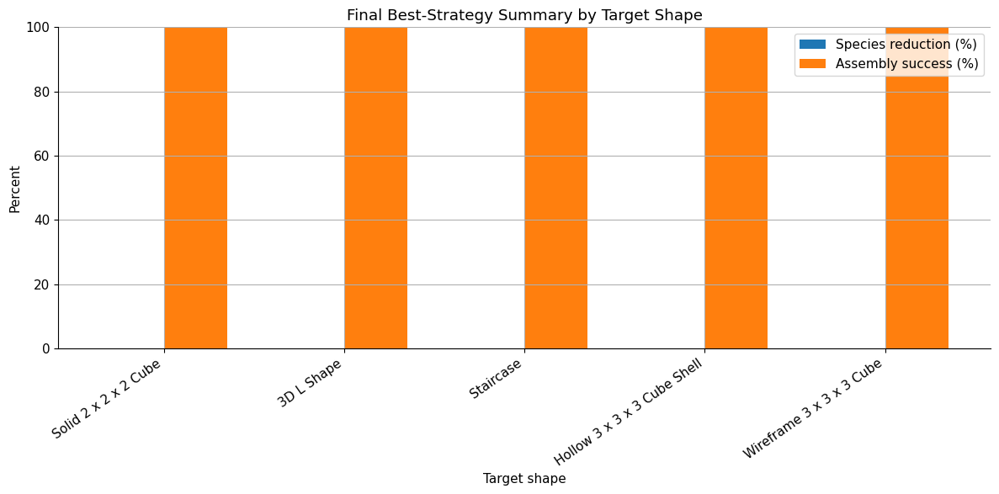

In [102]:
# ============================================================
# Step 13C: Final visual summary figure
# ============================================================

# What I am doing:
# I am creating one final visual summary that compares the best strategy for
# each target shape.
#
# This gives the notebook a strong final visual ending.

final_plot_df = final_research_summary_df.copy()

x_positions = np.arange(len(final_plot_df))
bar_width = 0.35

plt.figure(figsize=(12, 6))

plt.bar(
    x_positions - bar_width / 2,
    final_plot_df["species_reduction_percent"],
    width=bar_width,
    label="Species reduction (%)"
)

plt.bar(
    x_positions + bar_width / 2,
    final_plot_df["success_rate_percent"],
    width=bar_width,
    label="Assembly success (%)"
)

plt.title("Final Best-Strategy Summary by Target Shape")
plt.xlabel("Target shape")
plt.ylabel("Percent")
plt.xticks(
    x_positions,
    final_plot_df["target_shape"],
    rotation=35,
    ha="right"
)
plt.ylim(0, 100)
plt.legend()
plt.tight_layout()
plt.show()

In [105]:
# ============================================================
# Step 13D: Save final capstone outputs
# ============================================================

# What I am doing:
# I am saving the final capstone summary so it can be reused in the GitHub
# repository, README, or meeting discussion.

completed_contribution_path = os.path.join(
    OUTPUT_DIR,
    "completed_notebook_contributions.csv"
)

achievement_summary_path = os.path.join(
    OUTPUT_DIR,
    "final_achievement_summary.csv"
)

final_capstone_conclusion_path = os.path.join(
    OUTPUT_DIR,
    "final_capstone_conclusion.md"
)

completed_contribution_df.to_csv(completed_contribution_path, index=False)
achievement_summary_df.to_csv(achievement_summary_path, index=False)

with open(final_capstone_conclusion_path, "w", encoding="utf-8") as file:
    file.write(final_capstone_markdown)

print("Final capstone outputs saved:")
print(completed_contribution_path)
print(achievement_summary_path)
print(final_capstone_conclusion_path)

print("\nNotebook complete.")
print("This is the final notebook, no future work.")

Final capstone outputs saved:
self_assembly_outputs/completed_notebook_contributions.csv
self_assembly_outputs/final_achievement_summary.csv
self_assembly_outputs/final_capstone_conclusion.md

Notebook complete.
This is the final notebook, no future work.
